In [53]:
import pandas as pd
import numpy as np

# Load the Excel file
df = pd.read_excel('LTHW Data.xlsx', sheet_name='Sheet1', skiprows=27, header=0)

# Drop columns B, C, D, and E (index 1, 2, 3, 4)
df = df.drop(df.columns[[1, 2, 3, 4]], axis=1)

# Get the actual number of columns in the dataframe
num_cols = len(df.columns)

# Create month-year combinations only for the available columns
months = pd.date_range(start='2022-01-01', periods=num_cols-2, freq='MS').strftime('%b-%y').tolist()

# Create new column names
new_columns = ['Automated Meter Location', 'Boiler location'] + months

# Rename the columns
df.columns = new_columns

# Remove any rows where all values (except the first two columns) are NaN
df = df.dropna(subset=df.columns[2:], how='all')

# Replace NaN values with 0
df = df.fillna(0)

# Save the cleaned data as a CSV file
df.to_csv('cleaned_LTHW_data.csv', index=False)

print("Data cleaning completed. The cleaned file has been saved as 'cleaned_LTHW_data.csv'.")


Data cleaning completed. The cleaned file has been saved as 'cleaned_LTHW_data.csv'.


In [55]:
import pandas as pd
import numpy as np

# Load the Excel file, skipping rows 27 and additional rows 55 and 64
df = pd.read_excel('LTHW Data.xlsx', sheet_name='Sheet1', skiprows=lambda x: x < 27 or x in [55, 64], header=0)

# Drop columns B, C, D, and E (index 1, 2, 3, 4)
df = df.drop(df.columns[[1, 2, 3, 4]], axis=1)

# Get the actual number of columns in the dataframe
num_cols = len(df.columns)

# Create month-year combinations only for the available columns
months = pd.date_range(start='2022-01-01', periods=num_cols-2, freq='MS').strftime('%b-%y').tolist()

# Create new column names
new_columns = ['Automated Meter Location', 'Boiler location'] + months

# Rename the columns
df.columns = new_columns

# Remove any rows where all values (except the first two columns) are NaN
df = df.dropna(subset=df.columns[2:], how='all')

# Replace NaN values with 0
df = df.fillna(0)

# Save the cleaned data as a CSV file
df.to_csv('cleaned_LTHW_data.csv', index=False)

print("Data cleaning completed. The cleaned file has been saved as 'cleaned_LTHW_data.csv'.")


Data cleaning completed. The cleaned file has been saved as 'cleaned_LTHW_data.csv'.


In [57]:
import pandas as pd

# Load the cleaned CSV file
data = pd.read_csv('cleaned_LTHW_data.csv')

# Define columns to drop (Jan-25 to Dec-25)
columns_to_drop = [
    'Jan-25', 'Feb-25', 'Mar-25', 'Apr-25', 'May-25', 'Jun-25', 
    'Jul-25', 'Aug-25', 'Sep-25', 'Oct-25', 'Nov-25', 'Dec-25'
]

# Drop the specified columns
data = data.drop(columns=columns_to_drop, errors='ignore')

# Save the modified data to a new CSV file
data.to_csv('cleaned_LTHW_data_updated.csv', index=False)

print("The modified data has been saved as 'cleaned_LTHW_data_updated.csv'.")


The modified data has been saved as 'cleaned_LTHW_data_updated.csv'.


In [71]:
import pandas as pd

# Load the cleaned data
data = pd.read_csv('cleaned_LTHW_data.csv')

# Create date range for columns from Jan-22 to Dec-24
date_columns = pd.date_range(start='2022-01-01', end='2024-12-01', freq='MS').strftime('%b-%y').tolist()

# Define all columns to keep
columns_to_keep = ['Automated Meter Location', 'Boiler location'] + date_columns

# Create Automated Meter Reading dataframe
LTHW_automated_meter_reading = data.iloc[2:28][columns_to_keep]

# Create LTHW Consumption Values dataframe
Actual_lthw_consumption_values = data.iloc[34:75][columns_to_keep]

# Save the dataframes to CSV files (optional)
LTHW_automated_meter_reading.to_csv('LTHW_automated_meter_reading.csv', index=False)
Actual_lthw_consumption_values.to_csv('Actual_lthw_consumption_values.csv', index=False)



Running complete LTHW system analysis...

1. Analyzing high consumers...


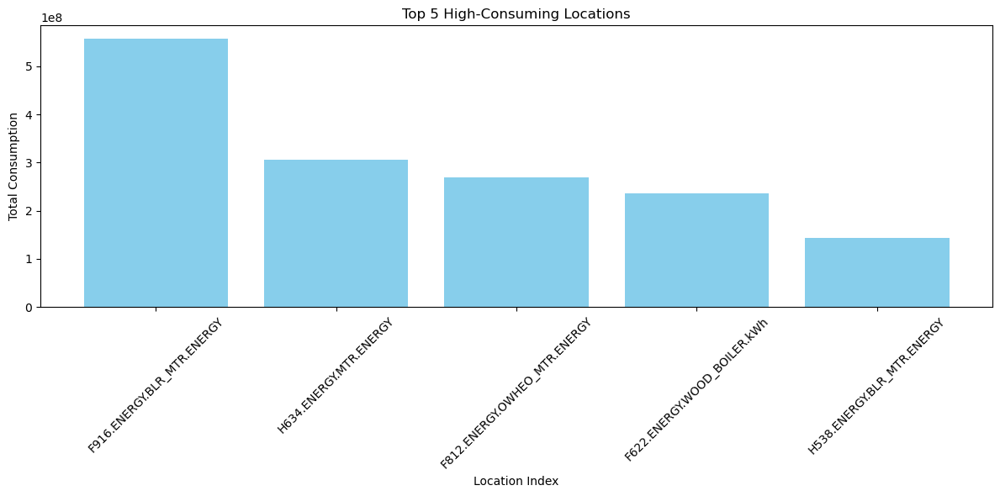


2. Analyzing seasonal patterns...


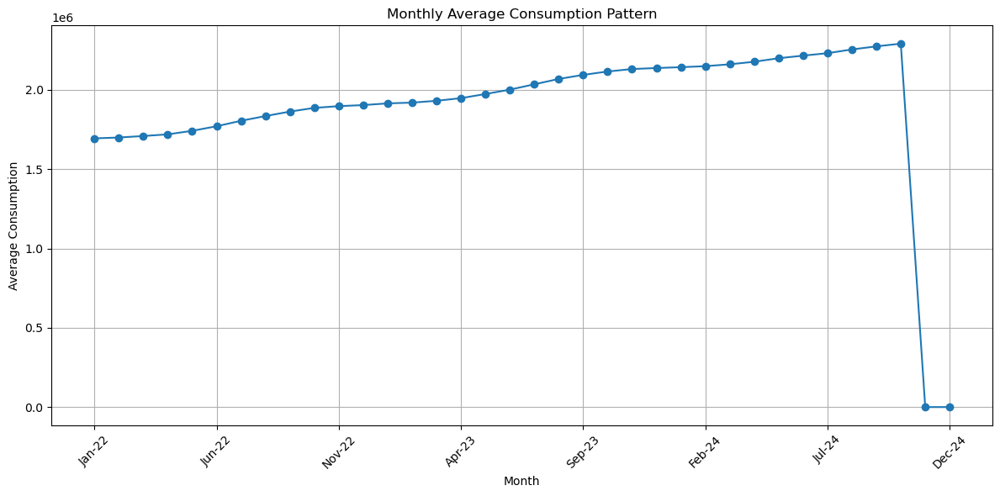


3. Detecting anomalies...


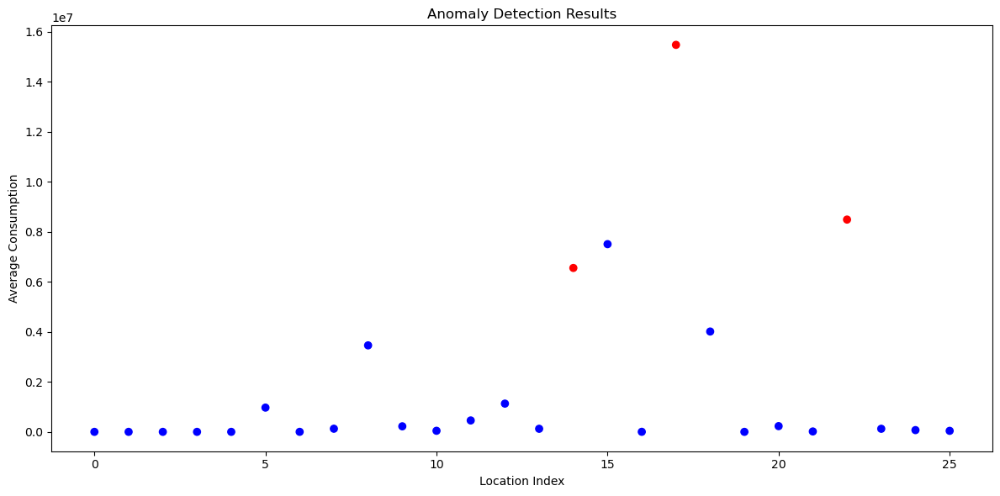

Anomalous locations: ['F622.ENERGY.WOOD_BOILER.kWh' 'F916.ENERGY.BLR_MTR.ENERGY'
 'H634.ENERGY.MTR.ENERGY']

4. Analyzing load balance...


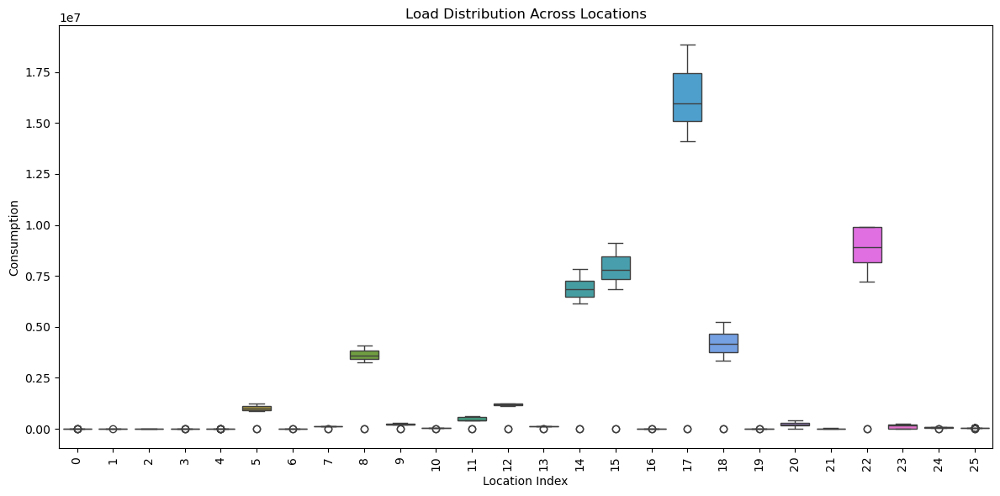

In [85]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest

# Load the data
data = pd.read_csv('LTHW_automated_meter_reading.csv')

# 1. High Consumption Analysis
def analyze_high_consumers():
    plt.figure(figsize=(12, 6))
    total_consumption = data.iloc[:, 2:].sum(axis=1)
    top_consumers = total_consumption.nlargest(5)
    
    plt.bar(range(len(top_consumers)), top_consumers, color='skyblue')
    plt.title('Top 5 High-Consuming Locations')
    plt.xlabel('Location Index')
    plt.ylabel('Total Consumption')
    plt.xticks(range(len(top_consumers)), [data['Automated Meter Location'][i] for i in top_consumers.index], rotation=45)
    plt.tight_layout()
    plt.show()

# 2. Seasonal Pattern Analysis
def analyze_seasonal_patterns():
    monthly_avg = data.iloc[:, 2:].mean()
    
    plt.figure(figsize=(12, 6))
    monthly_avg.plot(marker='o')
    plt.title('Monthly Average Consumption Pattern')
    plt.xlabel('Month')
    plt.ylabel('Average Consumption')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# 3. Anomaly Detection
def detect_anomalies():
    consumption_data = data.iloc[:, 2:].values
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(consumption_data)
    
    iso_forest = IsolationForest(contamination=0.1, random_state=42)
    anomalies = iso_forest.fit_predict(scaled_data)
    
    plt.figure(figsize=(12, 6))
    plt.scatter(range(len(anomalies)), 
               data.iloc[:, 2:].mean(axis=1),
               c=['red' if x == -1 else 'blue' for x in anomalies])
    plt.title('Anomaly Detection Results')
    plt.xlabel('Location Index')
    plt.ylabel('Average Consumption')
    plt.tight_layout()
    plt.show()
    
    # Print anomalous locations
    anomaly_indices = np.where(anomalies == -1)[0]
    print("Anomalous locations:", data['Automated Meter Location'][anomaly_indices].values)
    return anomalies

# 4. Load Balancing Analysis
def analyze_load_balance():
    hourly_load = data.iloc[:, 2:].T
    
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=hourly_load)
    plt.title('Load Distribution Across Locations')
    plt.xlabel('Location Index')
    plt.ylabel('Consumption')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

# Run all analyses
def run_complete_analysis():
    print("Running complete LTHW system analysis...")
    
    print("\n1. Analyzing high consumers...")
    analyze_high_consumers()
    
    print("\n2. Analyzing seasonal patterns...")
    analyze_seasonal_patterns()
    
    print("\n3. Detecting anomalies...")
    anomalies = detect_anomalies()
    
    print("\n4. Analyzing load balance...")
    analyze_load_balance()
    
    return anomalies

# Execute the analysis
if __name__ == "__main__":
    anomalies = run_complete_analysis()




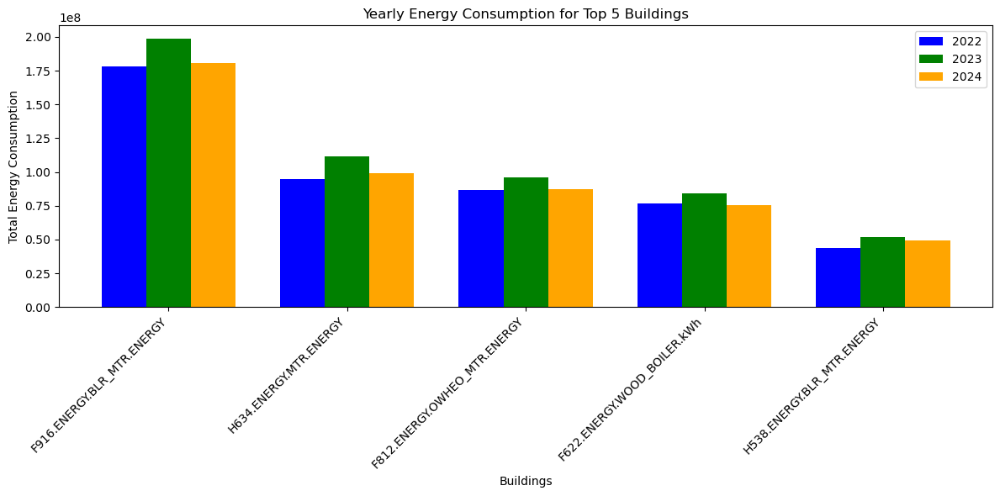

In [87]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the data
data = pd.read_csv('LTHW_automated_meter_reading.csv')

# Define columns for each year
columns_2022 = [col for col in data.columns if col.endswith('-22')]
columns_2023 = [col for col in data.columns if col.endswith('-23')]
columns_2024 = [col for col in data.columns if col.endswith('-24')]

# Calculate yearly totals
data['Total_2022'] = data[columns_2022].sum(axis=1)
data['Total_2023'] = data[columns_2023].sum(axis=1)
data['Total_2024'] = data[columns_2024].sum(axis=1)

# Calculate overall total and get top 5 buildings
data['Total_Consumption'] = data['Total_2022'] + data['Total_2023'] + data['Total_2024']
top_5_buildings = data.nlargest(5, 'Total_Consumption')

# Create bar chart
plt.figure(figsize=(12, 6))

# Set the positions of the bars
x = np.arange(len(top_5_buildings))
width = 0.25

# Create bars for each year
plt.bar(x - width, top_5_buildings['Total_2022'], width, label='2022', color='blue')
plt.bar(x, top_5_buildings['Total_2023'], width, label='2023', color='green')
plt.bar(x + width, top_5_buildings['Total_2024'], width, label='2024', color='orange')

# Customize the plot
plt.title('Yearly Energy Consumption for Top 5 Buildings')
plt.xlabel('Buildings')
plt.ylabel('Total Energy Consumption')

# Set x-axis labels
plt.xticks(x, top_5_buildings['Automated Meter Location'], rotation=45, ha='right')

# Add legend
plt.legend()

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show the plot
plt.show()


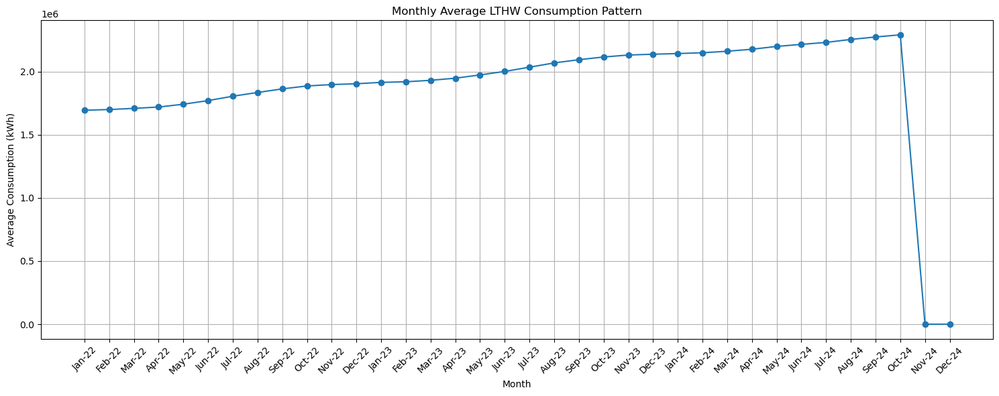

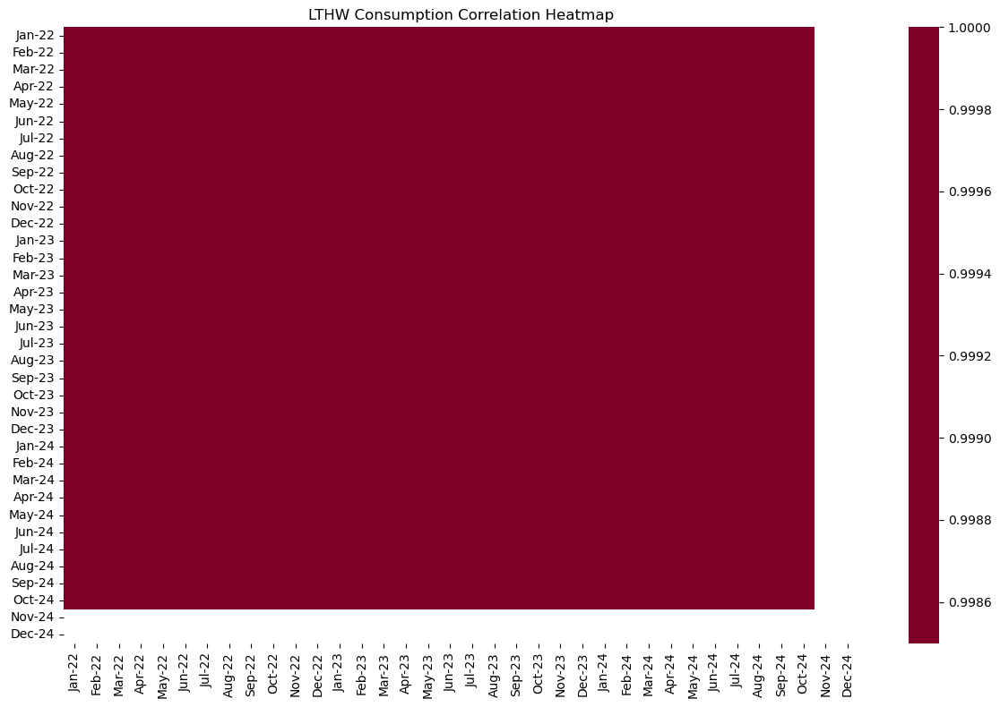

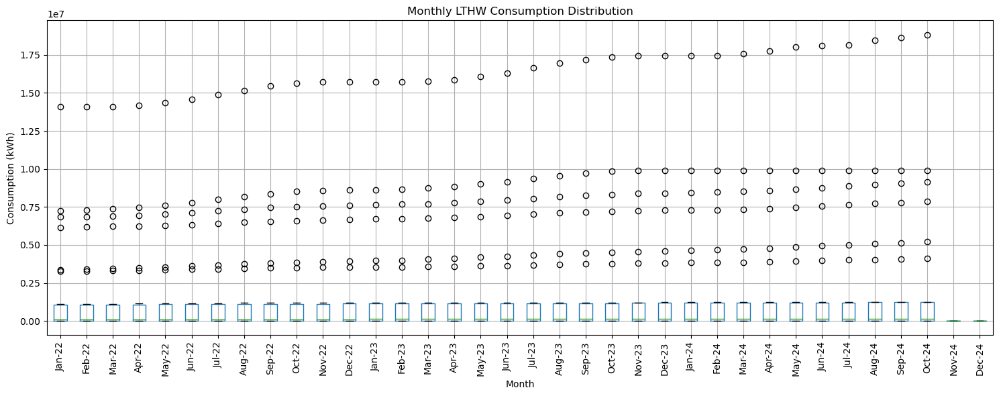

In [89]:

# Load the data
data = pd.read_csv('LTHW_automated_meter_reading.csv')

# Create seasonal analysis
def analyze_seasonal_patterns():
    monthly_avg = data.iloc[:, 2:].mean()
    
    plt.figure(figsize=(15, 6))
    plt.plot(monthly_avg.index, monthly_avg.values, marker='o')
    plt.title('Monthly Average LTHW Consumption Pattern')
    plt.xlabel('Month')
    plt.ylabel('Average Consumption (kWh)')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Create heatmap of monthly correlations
def create_consumption_heatmap():
    plt.figure(figsize=(12, 8))
    correlation_matrix = data.iloc[:, 2:].corr()
    sns.heatmap(correlation_matrix, cmap='YlOrRd', center=0)
    plt.title('LTHW Consumption Correlation Heatmap')
    plt.tight_layout()
    plt.show()

# Create boxplot for monthly distribution
def analyze_monthly_distribution():
    plt.figure(figsize=(15, 6))
    data.iloc[:, 2:].boxplot()
    plt.title('Monthly LTHW Consumption Distribution')
    plt.xlabel('Month')
    plt.ylabel('Consumption (kWh)')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

# Execute all visualizations
analyze_seasonal_patterns()
create_consumption_heatmap()
analyze_monthly_distribution()


Running complete LTHW system analysis...

1. Analyzing high consumers...


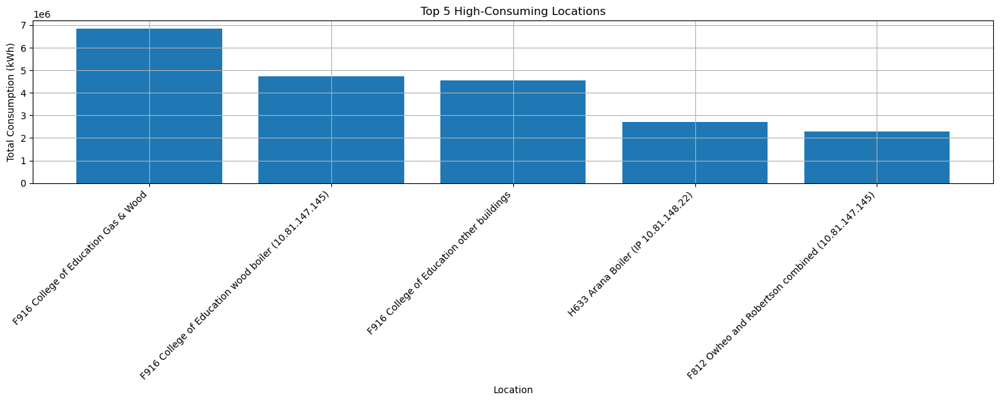


Top 5 Consuming Locations:
                             Automated Meter Location  Total_Consumption
25               F916 College of Education Gas & Wood       6.855344e+06
23  F916 College of Education wood boiler (10.81.1...       4.728500e+06
26          F916 College of Education other buildings       4.565044e+06
33                H633 Arana Boiler (IP 10.81.148.22)       2.709800e+06
20  F812 Owheo and Robertson combined (10.81.147.145)       2.290300e+06

2. Analyzing seasonal patterns...


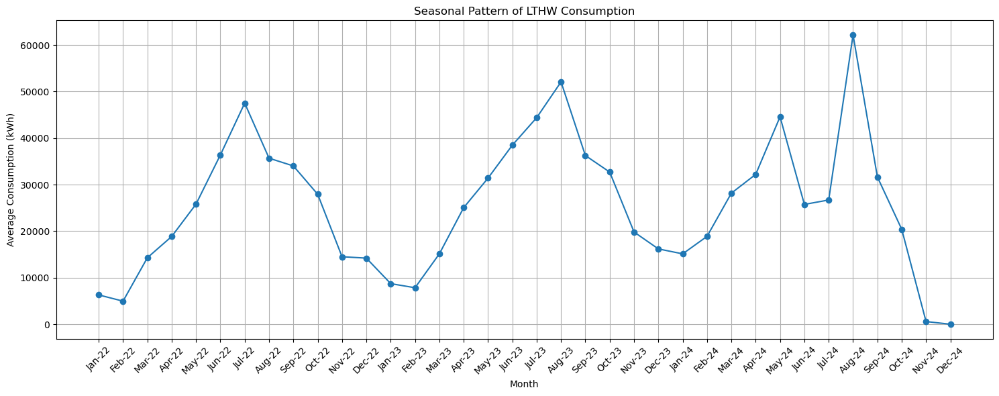


3. Detecting anomalies...


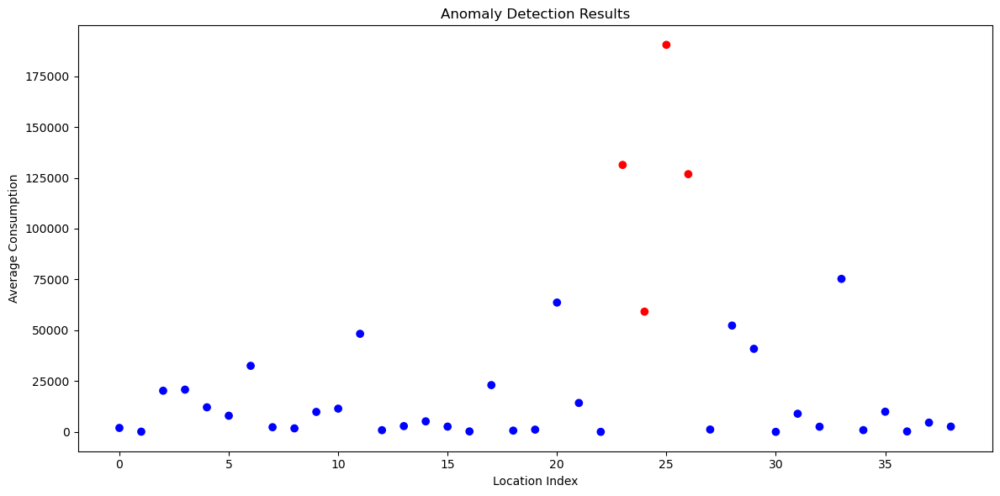


Anomalous Locations:
                             Automated Meter Location
23  F916 College of Education wood boiler (10.81.1...
24               F916 College of Education gas Boiler
25               F916 College of Education Gas & Wood
26          F916 College of Education other buildings

4. Analyzing load balance...


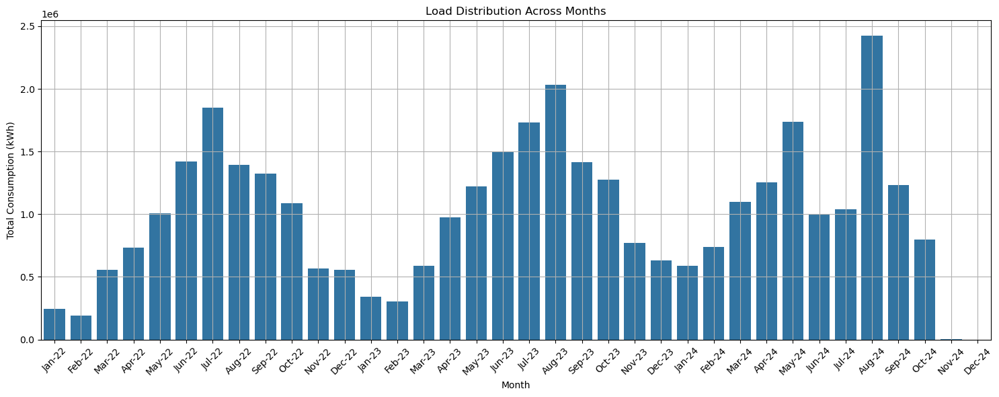

In [97]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest

# Load the data and convert columns to numeric
data = pd.read_csv('Actual_lthw_consumption_values.csv')
numeric_cols = data.columns[2:]  # All columns except first two
data[numeric_cols] = data[numeric_cols].apply(pd.to_numeric, errors='coerce')

def analyze_high_consumers():
    # Calculate total consumption for each location
    data['Total_Consumption'] = data[numeric_cols].sum(axis=1)
    top_5_consumers = data.nlargest(5, 'Total_Consumption')
    
    plt.figure(figsize=(15, 6))
    plt.bar(range(len(top_5_consumers)), top_5_consumers['Total_Consumption'])
    plt.title('Top 5 High-Consuming Locations')
    plt.xlabel('Location')
    plt.ylabel('Total Consumption (kWh)')
    plt.xticks(range(len(top_5_consumers)), 
               top_5_consumers['Automated Meter Location'], 
               rotation=45, 
               ha='right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    return top_5_consumers[['Automated Meter Location', 'Total_Consumption']]

def analyze_seasonal_patterns():
    monthly_avg = data[numeric_cols].mean()
    
    plt.figure(figsize=(15, 6))
    plt.plot(range(len(monthly_avg)), monthly_avg.values, marker='o')
    plt.title('Seasonal Pattern of LTHW Consumption')
    plt.xlabel('Month')
    plt.ylabel('Average Consumption (kWh)')
    plt.xticks(range(len(monthly_avg)), monthly_avg.index, rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def detect_anomalies():
    # Prepare data for anomaly detection
    consumption_data = data[numeric_cols].fillna(0)
    
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(consumption_data)
    
    iso_forest = IsolationForest(contamination=0.1, random_state=42)
    anomalies = iso_forest.fit_predict(scaled_data)
    
    plt.figure(figsize=(12, 6))
    plt.scatter(range(len(anomalies)), 
               consumption_data.mean(axis=1),
               c=['red' if x == -1 else 'blue' for x in anomalies])
    plt.title('Anomaly Detection Results')
    plt.xlabel('Location Index')
    plt.ylabel('Average Consumption')
    plt.tight_layout()
    plt.show()
    
    anomaly_indices = np.where(anomalies == -1)[0]
    return data.iloc[anomaly_indices][['Automated Meter Location']]

def analyze_load_balance():
    # Calculate monthly consumption
    monthly_consumption = data[numeric_cols].sum()
    
    plt.figure(figsize=(15, 6))
    sns.barplot(x=monthly_consumption.index, y=monthly_consumption.values)
    plt.title('Load Distribution Across Months')
    plt.xlabel('Month')
    plt.ylabel('Total Consumption (kWh)')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def run_complete_analysis():
    print("Running complete LTHW system analysis...")
    
    print("\n1. Analyzing high consumers...")
    top_consumers = analyze_high_consumers()
    print("\nTop 5 Consuming Locations:")
    print(top_consumers)
    
    print("\n2. Analyzing seasonal patterns...")
    analyze_seasonal_patterns()
    
    print("\n3. Detecting anomalies...")
    anomalies = detect_anomalies()
    print("\nAnomalous Locations:")
    print(anomalies)
    
    print("\n4. Analyzing load balance...")
    analyze_load_balance()

# Execute the analysis
if __name__ == "__main__":
    run_complete_analysis()


In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Load the dataset
file_path = 'Actual_lthw_consumption_values.csv'
data = pd.read_csv(file_path)

# Filter F, G, and H coded buildings
fgh_buildings = data[data['Meter_Location'].str.startswith(('F', 'G', 'H'))]
fgh_buildings = fgh_buildings.set_index('Meter_Location').T.replace(0, np.nan)

# Convert index to datetime for trend analysis
fgh_buildings.index = pd.to_datetime(fgh_buildings.index, format='%b-%y')


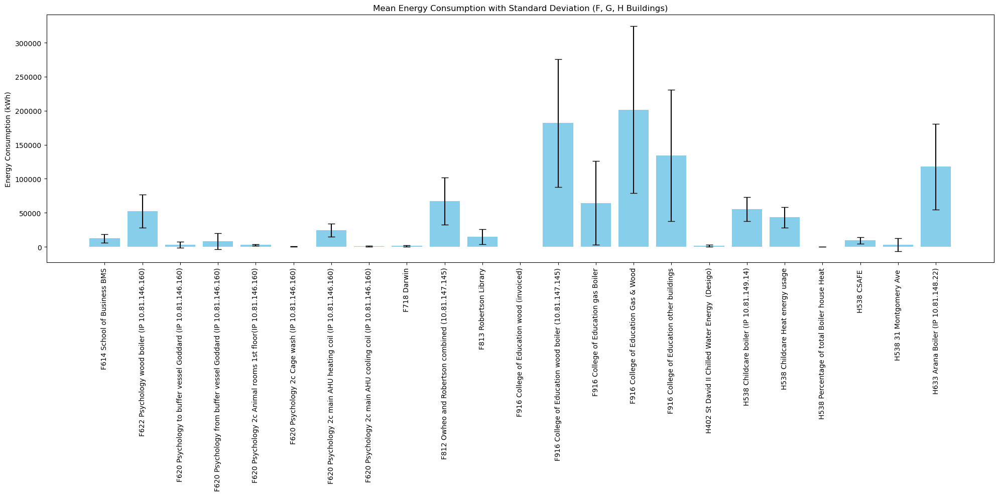

In [14]:
# Calculate mean and standard deviation for each building
mean_std = fgh_buildings.describe().loc[['mean', 'std']].T

# Plot bar chart with whiskers
plt.figure(figsize=(20, 10))
plt.bar(mean_std.index, mean_std['mean'], yerr=mean_std['std'], capsize=5, color='skyblue')
plt.title('Mean Energy Consumption with Standard Deviation (F, G, H Buildings)')
plt.ylabel('Energy Consumption (kWh)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


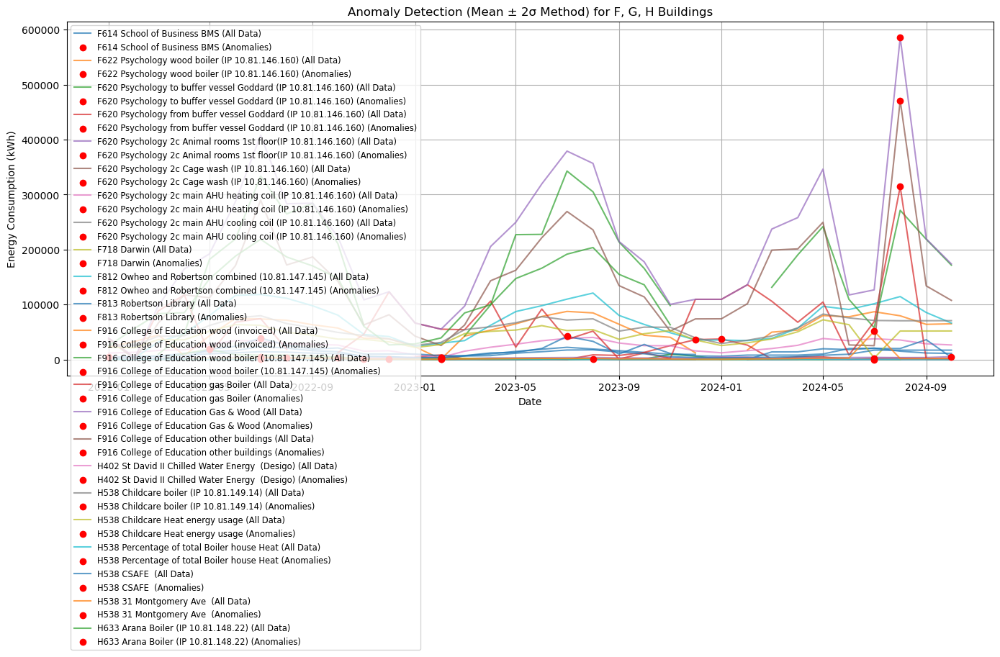

In [18]:
# Plot anomalies for each building
plt.figure(figsize=(14, 8))

for building in fgh_buildings.columns:
    # Calculate mean and standard deviation
    mean = fgh_buildings[building].mean()
    std = fgh_buildings[building].std()
    lower_bound, upper_bound = mean - 2 * std, mean + 2 * std

    # Plot all data points
    plt.plot(fgh_buildings.index, fgh_buildings[building], label=f"{building} (All Data)", alpha=0.7)

    # Highlight anomalies
    anomalies = fgh_buildings[(fgh_buildings[building] < lower_bound) | (fgh_buildings[building] > upper_bound)][building]
    plt.scatter(anomalies.index, anomalies, color='red', label=f"{building} (Anomalies)", zorder=5)

# Customize plot
plt.title("Anomaly Detection (Mean ± 2σ Method) for F, G, H Buildings")
plt.xlabel("Date")
plt.ylabel("Energy Consumption (kWh)")
plt.legend(loc='upper left', fontsize='small')
plt.grid()
plt.tight_layout()
plt.show()


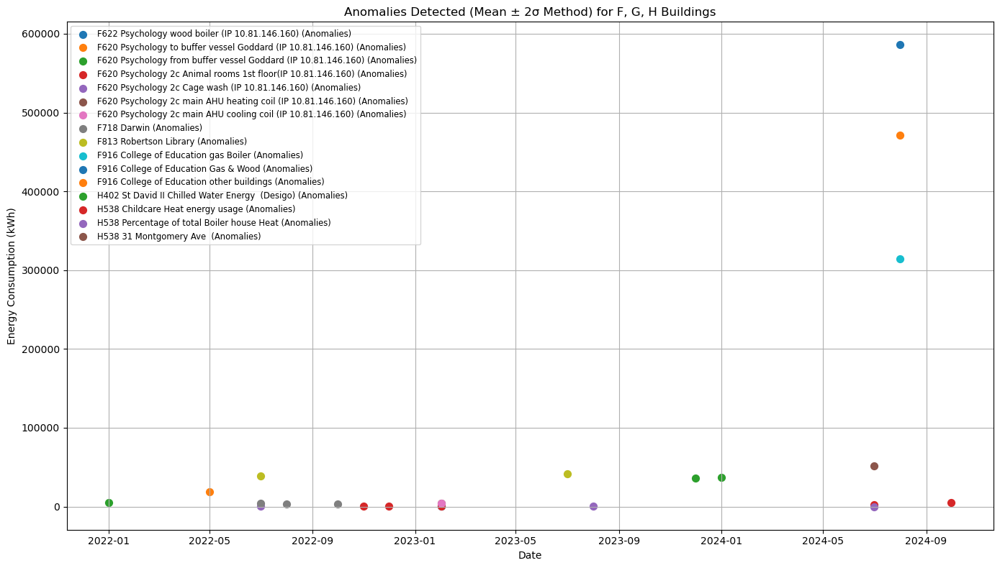

In [20]:
# Plot anomalies for each building
plt.figure(figsize=(14, 8))

for building in fgh_buildings.columns:
    # Calculate mean and standard deviation
    mean = fgh_buildings[building].mean()
    std = fgh_buildings[building].std()
    lower_bound, upper_bound = mean - 2 * std, mean + 2 * std

    # Identify anomalies
    anomalies = fgh_buildings[(fgh_buildings[building] < lower_bound) | (fgh_buildings[building] > upper_bound)][building]

    # Plot only anomalies
    if not anomalies.empty:
        plt.scatter(anomalies.index, anomalies, label=f"{building} (Anomalies)", s=50)

# Customize plot
plt.title("Anomalies Detected (Mean ± 2σ Method) for F, G, H Buildings")
plt.xlabel("Date")
plt.ylabel("Energy Consumption (kWh)")
plt.legend(loc='upper left', fontsize='small')
plt.grid()
plt.tight_layout()
plt.show()


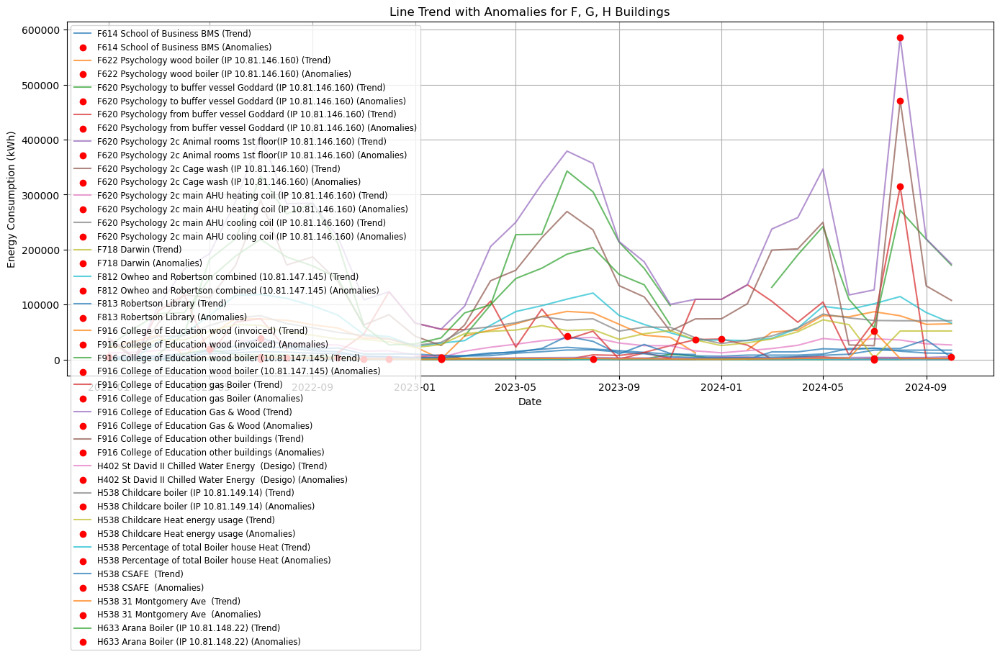

In [22]:
# Plot line trend with anomalies for each building
plt.figure(figsize=(14, 8))

for building in fgh_buildings.columns:
    # Calculate mean and standard deviation
    mean = fgh_buildings[building].mean()
    std = fgh_buildings[building].std()
    lower_bound, upper_bound = mean - 2 * std, mean + 2 * std

    # Plot the line trend
    plt.plot(fgh_buildings.index, fgh_buildings[building], label=f"{building} (Trend)", alpha=0.7)

    # Highlight anomalies
    anomalies = fgh_buildings[(fgh_buildings[building] < lower_bound) | (fgh_buildings[building] > upper_bound)][building]
    plt.scatter(anomalies.index, anomalies, color='red', label=f"{building} (Anomalies)", zorder=5)

# Customize plot
plt.title("Line Trend with Anomalies for F, G, H Buildings")
plt.xlabel("Date")
plt.ylabel("Energy Consumption (kWh)")
plt.legend(loc='upper left', fontsize='small')
plt.grid()
plt.tight_layout()
plt.show()


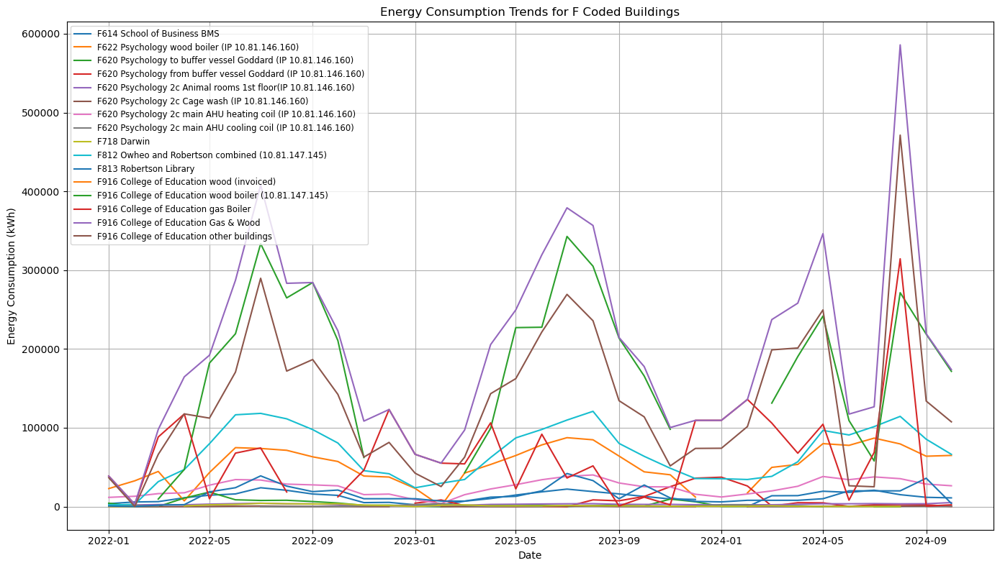

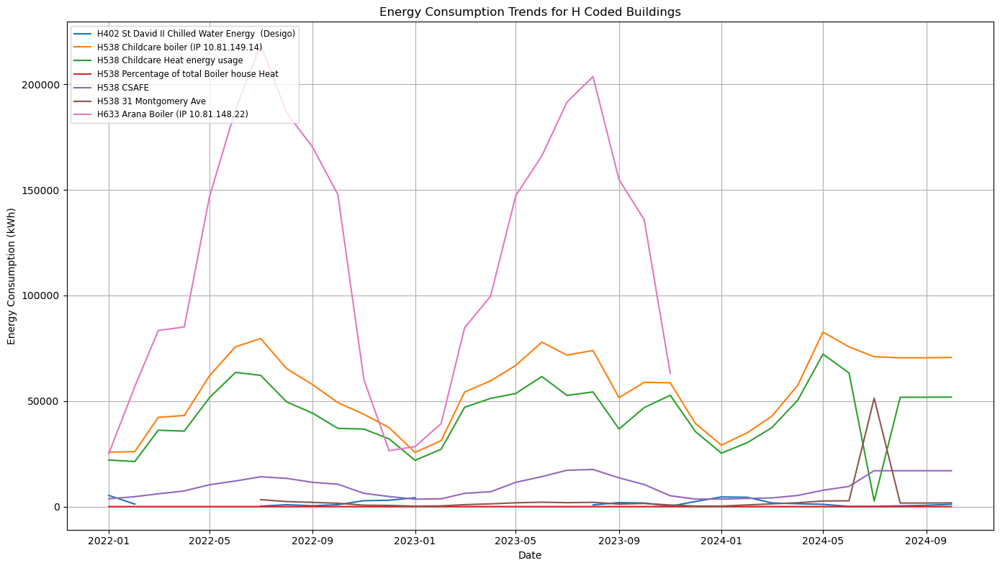

In [26]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
file_path = 'Actual_lthw_consumption_values.csv'
data = pd.read_csv(file_path)

# Filter F, G, and H coded buildings
f_buildings = data[data['Meter_Location'].str.startswith('F')]
g_buildings = data[data['Meter_Location'].str.startswith('G')]
h_buildings = data[data['Meter_Location'].str.startswith('H')]

# Transpose datasets and set index to datetime
f_buildings = f_buildings.set_index('Meter_Location').T.replace(0, None)
g_buildings = g_buildings.set_index('Meter_Location').T.replace(0, None)
h_buildings = h_buildings.set_index('Meter_Location').T.replace(0, None)

f_buildings.index = pd.to_datetime(f_buildings.index, format='%b-%y')
g_buildings.index = pd.to_datetime(g_buildings.index, format='%b-%y')
h_buildings.index = pd.to_datetime(h_buildings.index, format='%b-%y')

# Plot F coded buildings
plt.figure(figsize=(14, 8))
for column in f_buildings.columns:
    plt.plot(f_buildings.index, f_buildings[column], label=column)
plt.title("Energy Consumption Trends for F Coded Buildings")
plt.xlabel("Date")
plt.ylabel("Energy Consumption (kWh)")
plt.legend(loc='upper left', fontsize='small')
plt.grid()
plt.tight_layout()
plt.show()

# Plot G coded buildings (if any exist)
if not g_buildings.empty:
    plt.figure(figsize=(14, 8))
    for column in g_buildings.columns:
        plt.plot(g_buildings.index, g_buildings[column], label=column)
    plt.title("Energy Consumption Trends for G Coded Buildings")
    plt.xlabel("Date")
    plt.ylabel("Energy Consumption (kWh)")
    plt.legend(loc='upper left', fontsize='small')
    plt.grid()
    plt.tight_layout()
    plt.show()

# Plot H coded buildings
plt.figure(figsize=(14, 8))
for column in h_buildings.columns:
    plt.plot(h_buildings.index, h_buildings[column], label=column)
plt.title("Energy Consumption Trends for H Coded Buildings")
plt.xlabel("Date")
plt.ylabel("Energy Consumption (kWh)")
plt.legend(loc='upper left', fontsize='small')
plt.grid()
plt.tight_layout()
plt.show()


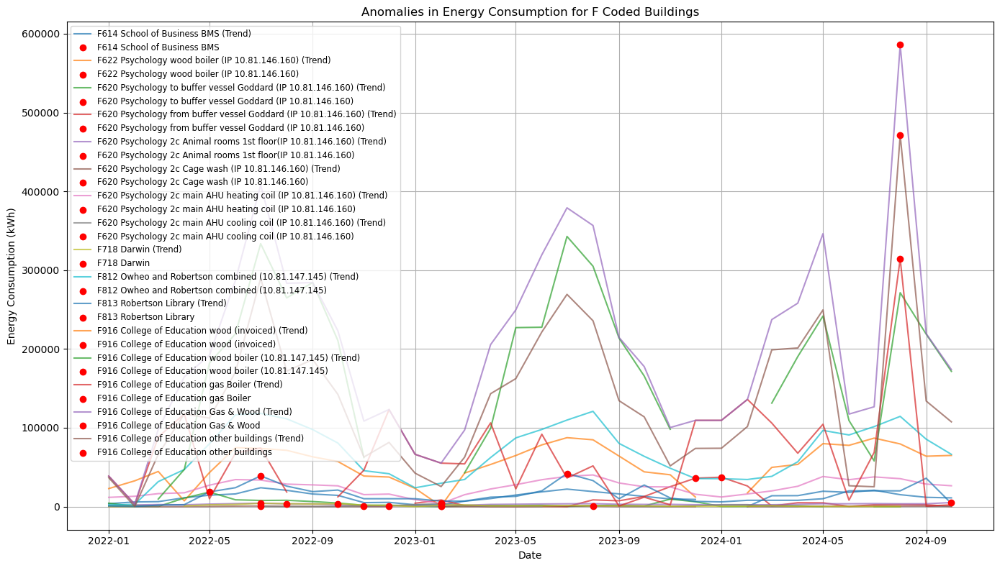

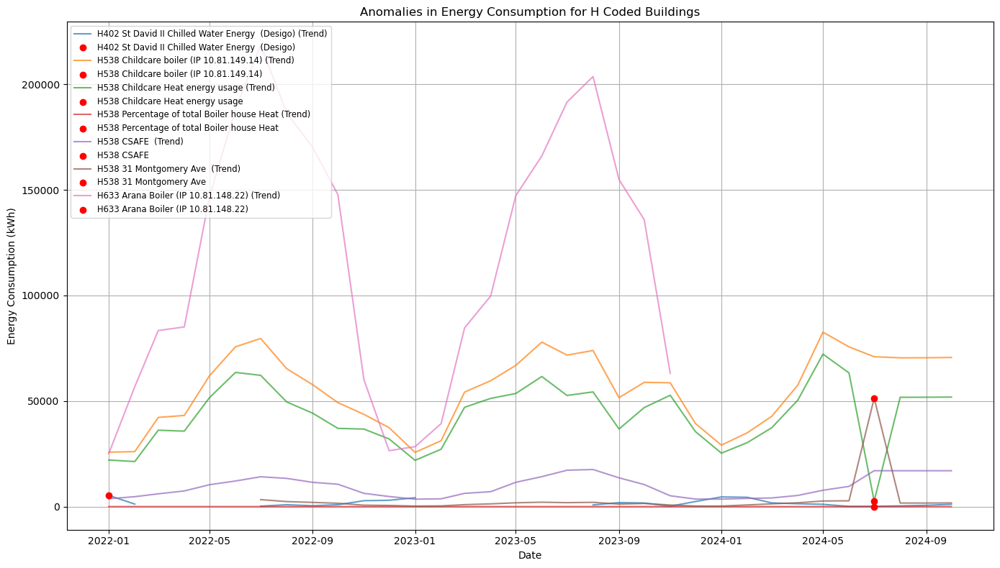

In [32]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
file_path = 'Actual_lthw_consumption_values.csv'
data = pd.read_csv(file_path)

# Filter F and H coded buildings
f_buildings = data[data['Meter_Location'].str.startswith('F')]
h_buildings = data[data['Meter_Location'].str.startswith('H')]

# Transpose datasets and set index to datetime
f_buildings = f_buildings.set_index('Meter_Location').T.replace(0, None)
h_buildings = h_buildings.set_index('Meter_Location').T.replace(0, None)

f_buildings.index = pd.to_datetime(f_buildings.index, format='%b-%y')
h_buildings.index = pd.to_datetime(h_buildings.index, format='%b-%y')

# Function to detect anomalies and plot
def plot_anomalies(buildings, title):
    plt.figure(figsize=(14, 8))

    for building in buildings.columns:
        # Calculate mean and standard deviation
        mean = buildings[building].mean()
        std = buildings[building].std()
        lower_bound, upper_bound = mean - 2 * std, mean + 2 * std

        # Plot the line trend
        plt.plot(buildings.index, buildings[building], label=f"{building} (Trend)", alpha=0.7)

        # Highlight anomalies
        anomalies = buildings[(buildings[building] < lower_bound) | (buildings[building] > upper_bound)][building]
        plt.scatter(anomalies.index, anomalies, color='red', label=f"{building}", zorder=5)

    # Customize plot
    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Energy Consumption (kWh)")
    plt.legend(loc='upper left', fontsize='small')
    plt.grid()
    plt.tight_layout()
    plt.show()

# Plot anomalies for F coded buildings
plot_anomalies(f_buildings, "Anomalies in Energy Consumption for F Coded Buildings")

# Plot anomalies for H coded buildings
plot_anomalies(h_buildings, "Anomalies in Energy Consumption for H Coded Buildings")


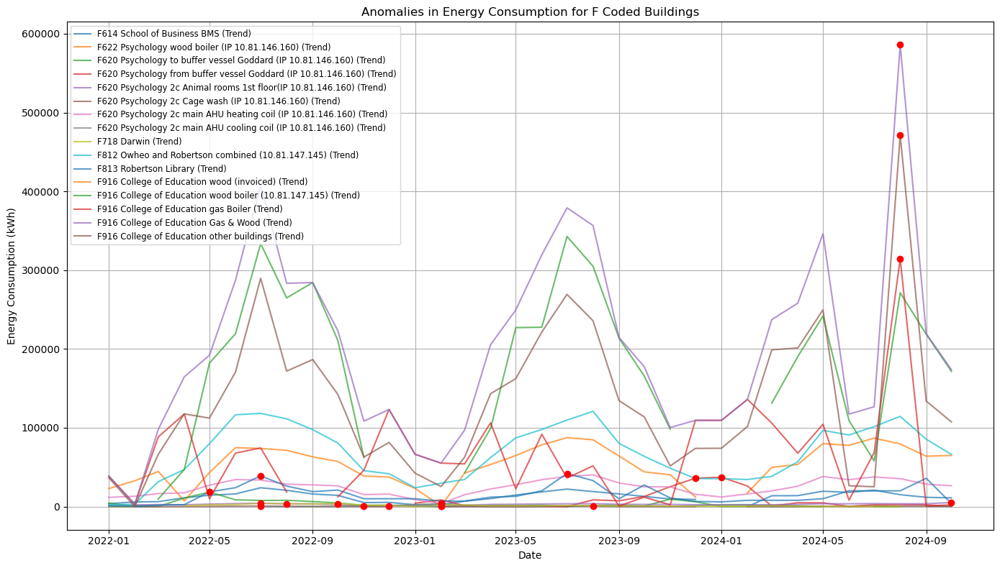

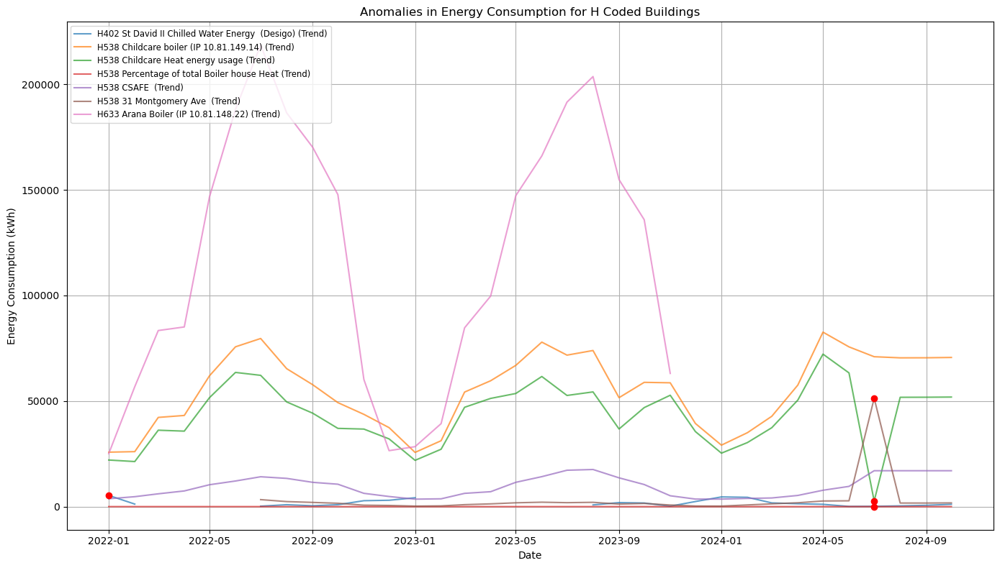

In [36]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
file_path = 'Actual_lthw_consumption_values.csv'
data = pd.read_csv(file_path)

# Filter F and H coded buildings
f_buildings = data[data['Meter_Location'].str.startswith('F')]
h_buildings = data[data['Meter_Location'].str.startswith('H')]

# Transpose datasets and set index to datetime
f_buildings = f_buildings.set_index('Meter_Location').T.replace(0, None)
h_buildings = h_buildings.set_index('Meter_Location').T.replace(0, None)

f_buildings.index = pd.to_datetime(f_buildings.index, format='%b-%y')
h_buildings.index = pd.to_datetime(h_buildings.index, format='%b-%y')

# Function to detect anomalies and plot without anomaly labels
def plot_anomalies_no_labels(buildings, title):
    plt.figure(figsize=(14, 8))

    for building in buildings.columns:
        # Calculate mean and standard deviation
        mean = buildings[building].mean()
        std = buildings[building].std()
        lower_bound, upper_bound = mean - 2 * std, mean + 2 * std

        # Plot the line trend
        plt.plot(buildings.index, buildings[building], label=f"{building} (Trend)", alpha=0.7)

        # Highlight anomalies (without adding them to the legend)
        anomalies = buildings[(buildings[building] < lower_bound) | (buildings[building] > upper_bound)][building]
        plt.scatter(anomalies.index, anomalies, color='red', zorder=5)

    # Customize plot
    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Energy Consumption (kWh)")
    plt.legend(loc='upper left', fontsize='small')
    plt.grid()
    plt.tight_layout()
    plt.show()

# Plot anomalies for F coded buildings without labels
plot_anomalies_no_labels(f_buildings, "Anomalies in Energy Consumption for F Coded Buildings")

# Plot anomalies for H coded buildings without labels
plot_anomalies_no_labels(h_buildings, "Anomalies in Energy Consumption for H Coded Buildings")


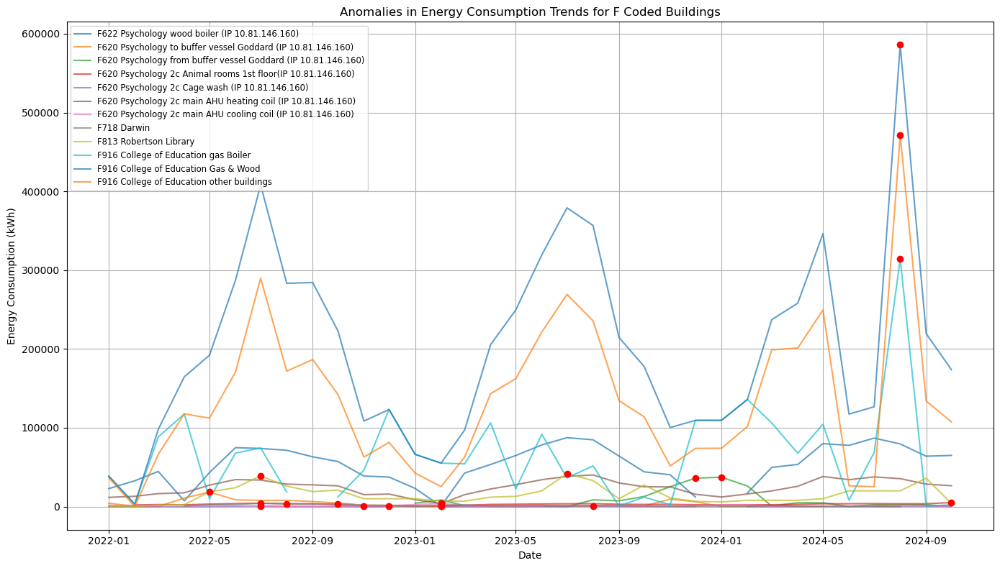

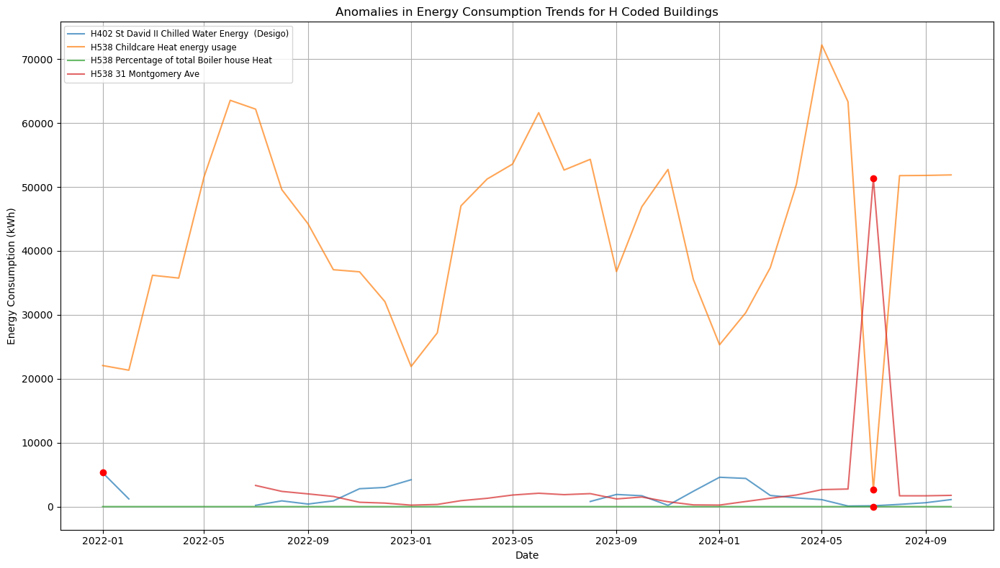

In [38]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
file_path = 'Actual_lthw_consumption_values.csv'
data = pd.read_csv(file_path)

# Filter F and H coded buildings
f_buildings = data[data['Meter_Location'].str.startswith('F')]
h_buildings = data[data['Meter_Location'].str.startswith('H')]

# Transpose datasets and set index to datetime
f_buildings = f_buildings.set_index('Meter_Location').T.replace(0, None)
h_buildings = h_buildings.set_index('Meter_Location').T.replace(0, None)

f_buildings.index = pd.to_datetime(f_buildings.index, format='%b-%y')
h_buildings.index = pd.to_datetime(h_buildings.index, format='%b-%y')

# Function to detect anomalies and filter only anomaly buildings
def get_anomaly_buildings(buildings):
    anomaly_buildings = {}
    for building in buildings.columns:
        mean = buildings[building].mean()
        std = buildings[building].std()
        lower_bound, upper_bound = mean - 2 * std, mean + 2 * std
        anomalies = buildings[(buildings[building] < lower_bound) | (buildings[building] > upper_bound)][building]
        if not anomalies.empty:
            anomaly_buildings[building] = anomalies
    return anomaly_buildings

# Get anomaly buildings for F and H coded buildings
f_anomaly_buildings = get_anomaly_buildings(f_buildings)
h_anomaly_buildings = get_anomaly_buildings(h_buildings)

# Function to plot anomaly buildings
def plot_anomaly_trends(anomaly_dict, original_data, title):
    plt.figure(figsize=(14, 8))
    for building in anomaly_dict.keys():
        # Plot the line trend for the building
        plt.plot(original_data.index, original_data[building], label=building, alpha=0.7)
        
        # Highlight anomalies
        plt.scatter(anomaly_dict[building].index, anomaly_dict[building], color='red', zorder=5)

    # Customize plot
    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Energy Consumption (kWh)")
    plt.legend(loc='upper left', fontsize='small')
    plt.grid()
    plt.tight_layout()
    plt.show()

# Plot anomaly trends for F coded buildings
plot_anomaly_trends(f_anomaly_buildings, f_buildings, "Anomalies in Energy Consumption Trends for F Coded Buildings")

# Plot anomaly trends for H coded buildings
plot_anomaly_trends(h_anomaly_buildings, h_buildings, "Anomalies in Energy Consumption Trends for H Coded Buildings")


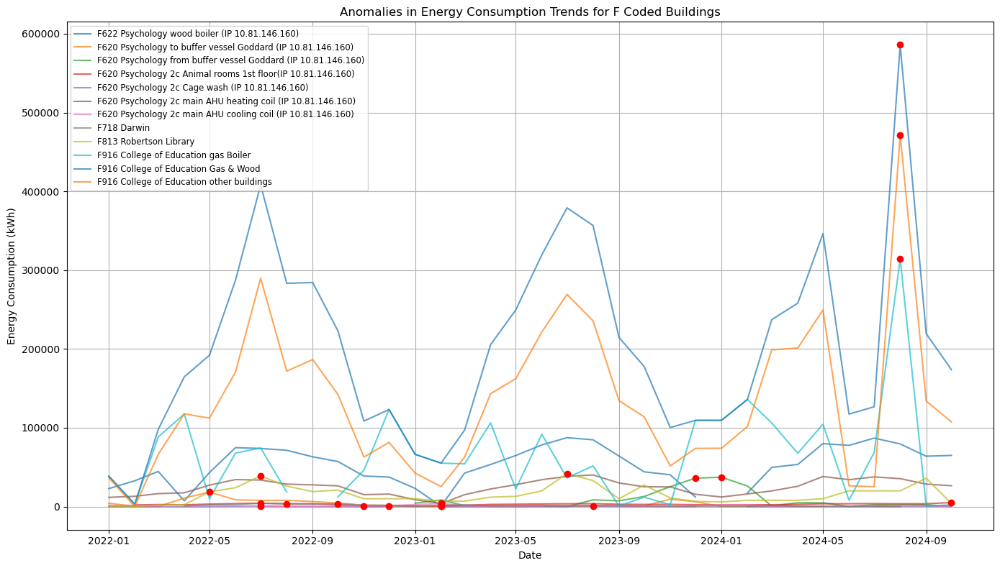

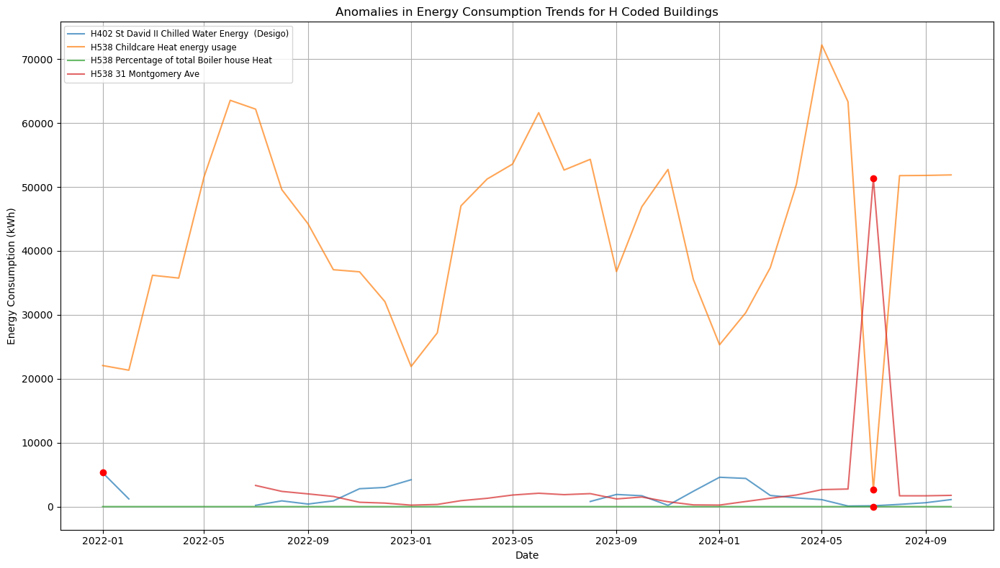

In [40]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
file_path = 'Actual_lthw_consumption_values.csv'
data = pd.read_csv(file_path)

# Filter F and H coded buildings
f_buildings = data[data['Meter_Location'].str.startswith('F')]
h_buildings = data[data['Meter_Location'].str.startswith('H')]

# Transpose datasets and set index to datetime
f_buildings = f_buildings.set_index('Meter_Location').T.replace(0, None)
h_buildings = h_buildings.set_index('Meter_Location').T.replace(0, None)

f_buildings.index = pd.to_datetime(f_buildings.index, format='%b-%y')
h_buildings.index = pd.to_datetime(h_buildings.index, format='%b-%y')

# Function to detect anomalies and extract only anomaly buildings
def extract_anomaly_buildings(buildings):
    anomaly_buildings = {}
    for building in buildings.columns:
        mean = buildings[building].mean()
        std = buildings[building].std()
        lower_bound, upper_bound = mean - 2 * std, mean + 2 * std
        anomalies = buildings[(buildings[building] < lower_bound) | (buildings[building] > upper_bound)][building]
        if not anomalies.empty:
            anomaly_buildings[building] = anomalies
    return anomaly_buildings

# Extract anomaly buildings for F and H coded buildings
f_anomaly_buildings = extract_anomaly_buildings(f_buildings)
h_anomaly_buildings = extract_anomaly_buildings(h_buildings)

# Function to plot only anomaly buildings
def plot_only_anomaly_trends(anomaly_dict, original_data, title):
    plt.figure(figsize=(14, 8))
    for building in anomaly_dict.keys():
        # Plot the line trend for the building
        plt.plot(original_data.index, original_data[building], label=building, alpha=0.7)
        
        # Highlight anomalies
        plt.scatter(anomaly_dict[building].index, anomaly_dict[building], color='red', zorder=5)

    # Customize plot
    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Energy Consumption (kWh)")
    plt.legend(loc='upper left', fontsize='small')
    plt.grid()
    plt.tight_layout()
    plt.show()

# Plot only anomaly trends for F coded buildings
plot_only_anomaly_trends(f_anomaly_buildings, f_buildings, "Anomalies in Energy Consumption Trends for F Coded Buildings")

# Plot only anomaly trends for H coded buildings
plot_only_anomaly_trends(h_anomaly_buildings, h_buildings, "Anomalies in Energy Consumption Trends for H Coded Buildings")


In [50]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.pipeline import Pipeline

def create_features(df):
    """Create features with seasonal and historical components"""
    # Convert month columns to datetime
    df_melted = df.melt(id_vars=['Meter_Location'], 
                        var_name='Month', 
                        value_name='Consumption')
    df_melted['Month'] = pd.to_datetime(df_melted['Month'], format='%b-%y')
    
    # Sort and create features
    df_melted = df_melted.sort_values(['Meter_Location', 'Month'])
    
    # Historical features
    df_melted['rolling_mean_3'] = df_melted.groupby('Meter_Location')['Consumption'].rolling(3, min_periods=1).mean().reset_index(0, drop=True)
    df_melted['rolling_mean_6'] = df_melted.groupby('Meter_Location')['Consumption'].rolling(6, min_periods=1).mean().reset_index(0, drop=True)
    
    # Seasonal features
    df_melted['month_sin'] = np.sin(2 * np.pi * df_melted['Month'].dt.month/12)
    df_melted['month_cos'] = np.cos(2 * np.pi * df_melted['Month'].dt.month/12)
    
    return df_melted


In [52]:
def train_evaluate_models(X, y):
    """Train and evaluate multiple regression models"""
    
    # Initialize models
    models = {
        'Linear': LinearRegression(),
        'Ridge': Ridge(alpha=1.0),
        'Lasso': Lasso(alpha=1.0),
        'RandomForest': RandomForestRegressor(
            n_estimators=100,
            max_depth=10,
            min_samples_split=5,
            min_samples_leaf=4,
            random_state=42
        )
    }
    
    # Time series cross-validation
    tscv = TimeSeriesSplit(n_splits=3, test_size=12, gap=1)
    
    results = {}
    for name, model in models.items():
        scores = {'train_r2': [], 'test_r2': [], 'train_rmse': [], 'test_rmse': []}
        
        for train_idx, test_idx in tscv.split(X):
            X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
            
            # Scale features
            scaler = StandardScaler()
            X_train_scaled = scaler.fit_transform(X_train)
            X_test_scaled = scaler.transform(X_test)
            
            # Fit and predict
            model.fit(X_train_scaled, y_train)
            y_train_pred = model.predict(X_train_scaled)
            y_test_pred = model.predict(X_test_scaled)
            
            # Calculate metrics
            scores['train_r2'].append(r2_score(y_train, y_train_pred))
            scores['test_r2'].append(r2_score(y_test, y_test_pred))
            scores['train_rmse'].append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
            scores['test_rmse'].append(np.sqrt(mean_squared_error(y_test, y_test_pred)))
        
        results[name] = scores
    
    return results


In [54]:
def tune_random_forest(X, y):
    """Tune Random Forest hyperparameters"""
    
    param_grid = {
        'n_estimators': [100, 200],
        'max_depth': [8, 10, 12],
        'min_samples_split': [4, 5, 6],
        'min_samples_leaf': [3, 4, 5]
    }
    
    tscv = TimeSeriesSplit(n_splits=3, test_size=12, gap=1)
    best_score = -np.inf
    best_params = None
    
    for n_estimators in param_grid['n_estimators']:
        for max_depth in param_grid['max_depth']:
            for min_samples_split in param_grid['min_samples_split']:
                for min_samples_leaf in param_grid['min_samples_leaf']:
                    rf = RandomForestRegressor(
                        n_estimators=n_estimators,
                        max_depth=max_depth,
                        min_samples_split=min_samples_split,
                        min_samples_leaf=min_samples_leaf,
                        random_state=42
                    )
                    
                    scores = []
                    for train_idx, test_idx in tscv.split(X):
                        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
                        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
                        
                        scaler = StandardScaler()
                        X_train_scaled = scaler.fit_transform(X_train)
                        X_test_scaled = scaler.transform(X_test)
                        
                        rf.fit(X_train_scaled, y_train)
                        y_test_pred = rf.predict(X_test_scaled)
                        scores.append(r2_score(y_test, y_test_pred))
                    
                    avg_score = np.mean(scores)
                    if avg_score > best_score:
                        best_score = avg_score
                        best_params = {
                            'n_estimators': n_estimators,
                            'max_depth': max_depth,
                            'min_samples_split': min_samples_split,
                            'min_samples_leaf': min_samples_leaf
                        }
    
    return best_params, best_score


In [56]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.pipeline import Pipeline

def create_features(df):
    """Create features with seasonal and historical components"""
    # Convert month columns to datetime
    df_melted = df.melt(id_vars=['Meter_Location'], 
                        var_name='Month', 
                        value_name='Consumption')
    df_melted['Month'] = pd.to_datetime(df_melted['Month'], format='%b-%y')
    
    # Sort and create features
    df_melted = df_melted.sort_values(['Meter_Location', 'Month'])
    
    # Historical features
    df_melted['rolling_mean_3'] = df_melted.groupby('Meter_Location')['Consumption'].rolling(3, min_periods=1).mean().reset_index(0, drop=True)
    df_melted['rolling_mean_6'] = df_melted.groupby('Meter_Location')['Consumption'].rolling(6, min_periods=1).mean().reset_index(0, drop=True)
    
    # Seasonal features
    df_melted['month_sin'] = np.sin(2 * np.pi * df_melted['Month'].dt.month/12)
    df_melted['month_cos'] = np.cos(2 * np.pi * df_melted['Month'].dt.month/12)
    
    return df_melted

def train_evaluate_models(X, y):
    """Train and evaluate multiple regression models"""
    
    # Initialize models
    models = {
        'Linear': LinearRegression(),
        'Ridge': Ridge(alpha=1.0),
        'Lasso': Lasso(alpha=1.0),
        'RandomForest': RandomForestRegressor(
            n_estimators=100,
            max_depth=10,
            min_samples_split=5,
            min_samples_leaf=4,
            random_state=42
        )
    }
    
    # Time series cross-validation
    tscv = TimeSeriesSplit(n_splits=3, test_size=12, gap=1)
    
    results = {}
    for name, model in models.items():
        scores = {'train_r2': [], 'test_r2': [], 'train_rmse': [], 'test_rmse': []}
        
        for train_idx, test_idx in tscv.split(X):
            X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
            
            # Scale features
            scaler = StandardScaler()
            X_train_scaled = scaler.fit_transform(X_train)
            X_test_scaled = scaler.transform(X_test)
            
            # Fit and predict
            model.fit(X_train_scaled, y_train)
            y_train_pred = model.predict(X_train_scaled)
            y_test_pred = model.predict(X_test_scaled)
            
            # Calculate metrics
            scores['train_r2'].append(r2_score(y_train, y_train_pred))
            scores['test_r2'].append(r2_score(y_test, y_test_pred))
            scores['train_rmse'].append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
            scores['test_rmse'].append(np.sqrt(mean_squared_error(y_test, y_test_pred)))
        
        results[name] = scores
    
    # Display results
    for model_name, metrics in results.items():
        print(f"Model: {model_name}")
        print(f"Train R2: {np.mean(metrics['train_r2']):.4f}, Test R2: {np.mean(metrics['test_r2']):.4f}")
        print(f"Train RMSE: {np.mean(metrics['train_rmse']):.4f}, Test RMSE: {np.mean(metrics['test_rmse']):.4f}")
        print("-" * 40)
    
    return results

def tune_random_forest(X, y):
    """Tune Random Forest hyperparameters"""
    
    param_grid = {
        'n_estimators': [100, 200],
        'max_depth': [8, 10, 12],
        'min_samples_split': [4, 5, 6],
        'min_samples_leaf': [3, 4, 5]
    }
    
    tscv = TimeSeriesSplit(n_splits=3, test_size=12, gap=1)
    best_score = -np.inf
    best_params = None
    
    for n_estimators in param_grid['n_estimators']:
        for max_depth in param_grid['max_depth']:
            for min_samples_split in param_grid['min_samples_split']:
                for min_samples_leaf in param_grid['min_samples_leaf']:
                    rf = RandomForestRegressor(
                        n_estimators=n_estimators,
                        max_depth=max_depth,
                        min_samples_split=min_samples_split,
                        min_samples_leaf=min_samples_leaf,
                        random_state=42
                    )
                    
                    scores = []
                    for train_idx, test_idx in tscv.split(X):
                        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
                        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
                        
                        scaler = StandardScaler()
                        X_train_scaled = scaler.fit_transform(X_train)
                        X_test_scaled = scaler.transform(X_test)
                        
                        rf.fit(X_train_scaled, y_train)
                        y_test_pred = rf.predict(X_test_scaled)
                        scores.append(r2_score(y_test, y_test_pred))
                    
                    avg_score = np.mean(scores)
                    if avg_score > best_score:
                        best_score = avg_score
                        best_params = {
                            'n_estimators': n_estimators,
                            'max_depth': max_depth,
                            'min_samples_split': min_samples_split,
                            'min_samples_leaf': min_samples_leaf
                        }
    
    print(f"Best Parameters: {best_params}")
    print(f"Best Score: {best_score:.4f}")
    
    return best_params, best_score

# Main execution block
if __name__ == "__main__":
    # Load your dataset here
    # For example: df = pd.read_csv('your_dataset.csv')
    
    # Create features
    df_features = create_features(df)
    
    # Prepare X and y for modeling
    X = df_features[['rolling_mean_3', 'rolling_mean_6', 'month_sin', 'month_cos']]
    y = df_features['Consumption']
    
    # Train and evaluate models
    print("Model Evaluation Results:")
    results = train_evaluate_models(X, y)
    
    print("\nTuning Random Forest:")
    best_params, best_score = tune_random_forest(X, y)


NameError: name 'df' is not defined

In [58]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values.csv')

def create_features(df):
    """Create features with seasonal and historical components"""
    # Convert month columns to datetime
    df_melted = df.melt(id_vars=['Meter_Location'], 
                        var_name='Month', 
                        value_name='Consumption')
    df_melted['Month'] = pd.to_datetime(df_melted['Month'], format='%b-%y', errors='coerce')
    
    # Drop rows with invalid dates
    df_melted = df_melted.dropna(subset=['Month'])
    
    # Sort and create features
    df_melted = df_melted.sort_values(['Meter_Location', 'Month'])
    
    # Historical features
    df_melted['rolling_mean_3'] = df_melted.groupby('Meter_Location')['Consumption'].rolling(3, min_periods=1).mean().reset_index(0, drop=True)
    df_melted['rolling_mean_6'] = df_melted.groupby('Meter_Location')['Consumption'].rolling(6, min_periods=1).mean().reset_index(0, drop=True)
    
    # Seasonal features
    df_melted['month_sin'] = np.sin(2 * np.pi * df_melted['Month'].dt.month/12)
    df_melted['month_cos'] = np.cos(2 * np.pi * df_melted['Month'].dt.month/12)
    
    return df_melted

def train_evaluate_models(X, y):
    """Train and evaluate multiple regression models"""
    
    # Initialize models
    models = {
        'Linear': LinearRegression(),
        'Ridge': Ridge(alpha=1.0),
        'Lasso': Lasso(alpha=1.0),
        'RandomForest': RandomForestRegressor(
            n_estimators=100,
            max_depth=10,
            min_samples_split=5,
            min_samples_leaf=4,
            random_state=42
        )
    }
    
    # Time series cross-validation
    tscv = TimeSeriesSplit(n_splits=3, test_size=12, gap=1)
    
    results = {}
    for name, model in models.items():
        scores = {'train_r2': [], 'test_r2': [], 'train_rmse': [], 'test_rmse': []}
        
        for train_idx, test_idx in tscv.split(X):
            X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
            
            # Scale features
            scaler = StandardScaler()
            X_train_scaled = scaler.fit_transform(X_train)
            X_test_scaled = scaler.transform(X_test)
            
            # Fit and predict
            model.fit(X_train_scaled, y_train)
            y_train_pred = model.predict(X_train_scaled)
            y_test_pred = model.predict(X_test_scaled)
            
            # Calculate metrics
            scores['train_r2'].append(r2_score(y_train, y_train_pred))
            scores['test_r2'].append(r2_score(y_test, y_test_pred))
            scores['train_rmse'].append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
            scores['test_rmse'].append(np.sqrt(mean_squared_error(y_test, y_test_pred)))
        
        results[name] = scores
    
    # Display results
    for model_name, metrics in results.items():
        print(f"Model: {model_name}")
        print(f"Train R2: {np.mean(metrics['train_r2']):.4f}, Test R2: {np.mean(metrics['test_r2']):.4f}")
        print(f"Train RMSE: {np.mean(metrics['train_rmse']):.4f}, Test RMSE: {np.mean(metrics['test_rmse']):.4f}")
        print("-" * 40)
    
    return results

# Create features
df_features = create_features(df)

# Prepare X and y for modeling
X = df_features[['rolling_mean_3', 'rolling_mean_6', 'month_sin', 'month_cos']]
y = df_features['Consumption']

# Train and evaluate models
results = train_evaluate_models(X, y)


Model: Linear
Train R2: 0.8449, Test R2: -1026845.0069
Train RMSE: 23374.5822, Test RMSE: 4332.8095
----------------------------------------
Model: Ridge
Train R2: 0.8449, Test R2: -1035077.7930
Train RMSE: 23375.6244, Test RMSE: 4354.9093
----------------------------------------
Model: Lasso
Train R2: 0.8449, Test R2: -1026517.5892
Train RMSE: 23374.5830, Test RMSE: 4332.1077
----------------------------------------
Model: RandomForest
Train R2: 0.9235, Test R2: 0.5756
Train RMSE: 16410.4366, Test RMSE: 1347.6107
----------------------------------------


In [66]:
!pip install prophet --no-cache-dir


   ---------------------------------------- 0.0/13.3 MB ? eta -:--:--
   --- ------------------------------------ 1.0/13.3 MB 25.4 MB/s eta 0:00:01
   ------ --------------------------------- 2.1/13.3 MB 6.9 MB/s eta 0:00:02
   --------- ------------------------------ 3.1/13.3 MB 5.8 MB/s eta 0:00:02
   ------------ --------------------------- 4.2/13.3 MB 5.0 MB/s eta 0:00:02
   ------------- -------------------------- 4.5/13.3 MB 4.1 MB/s eta 0:00:03
   --------------- ------------------------ 5.2/13.3 MB 4.8 MB/s eta 0:00:02
   ------------------ --------------------- 6.3/13.3 MB 4.8 MB/s eta 0:00:02
   ------------------ --------------------- 6.3/13.3 MB 4.8 MB/s eta 0:00:02
   ------------------ --------------------- 6.3/13.3 MB 4.8 MB/s eta 0:00:02
   ------------------ --------------------- 6.3/13.3 MB 4.8 MB/s eta 0:00:02
   ---------------------- ----------------- 7.3/13.3 MB 3.3 MB/s eta 0:00:02
   ------------------------- -------------- 8.4/13.3 MB 3.4 MB/s eta 0:00:02
   --

17:32:18 - cmdstanpy - INFO - Chain [1] start processing
17:32:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


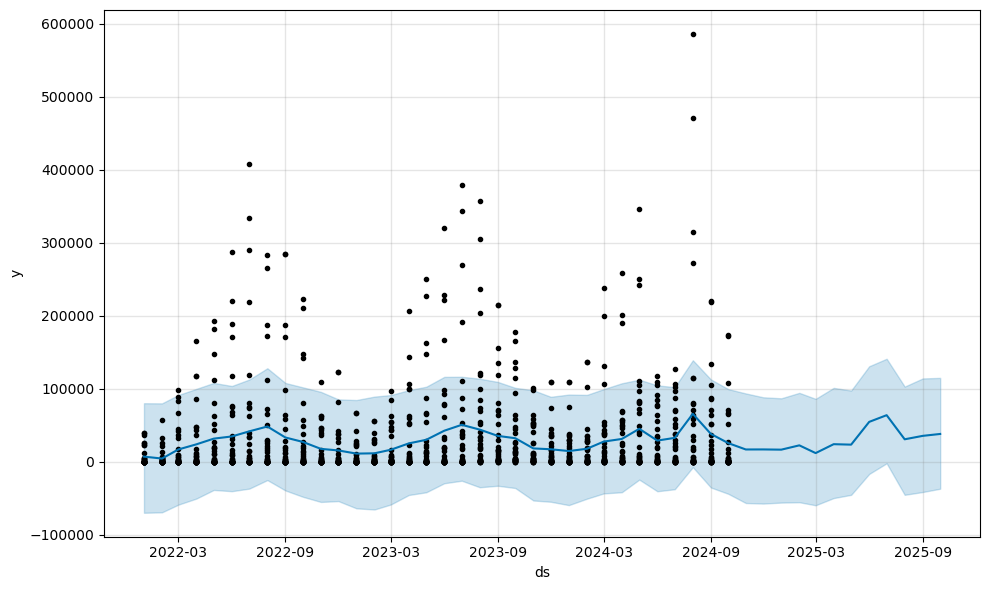

In [68]:
import pandas as pd
from prophet import Prophet

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values.csv')

# Prepare data for Prophet
meter_data = df.melt(id_vars=['Meter_Location'], var_name='Month', value_name='Consumption')
meter_data['Month'] = pd.to_datetime(meter_data['Month'], format='%b-%y', errors='coerce')
meter_data = meter_data.dropna(subset=['Month'])
prophet_data = meter_data.rename(columns={'Month': 'ds', 'Consumption': 'y'})

# Create and fit the Prophet model
model = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
model.fit(prophet_data)

# Make future dataframe for predictions
future = model.make_future_dataframe(periods=12, freq='M')

# Forecast
forecast = model.predict(future)

# Plot the forecast
fig = model.plot(forecast)


In [72]:
import numpy as np

# Handle outliers using the IQR method
columns = df.columns[1:]  # Exclude 'Meter_Location'

for col in columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Replace outliers with the median of the column
    median = df[col].median()
    df[col] = np.where((df[col] < lower_bound) | (df[col] > upper_bound), median, df[col])


In [74]:
# Reshape the dataset for Prophet
meter_data = df.melt(id_vars=['Meter_Location'], var_name='Month', value_name='Consumption')
meter_data['Month'] = pd.to_datetime(meter_data['Month'], format='%b-%y', errors='coerce')

# Drop rows with invalid dates
meter_data = meter_data.dropna(subset=['Month'])

# Rename columns for Prophet
prophet_data = meter_data.rename(columns={'Month': 'ds', 'Consumption': 'y'})


17:50:52 - cmdstanpy - INFO - Chain [1] start processing


Processing F614 School of Business BMS...


17:50:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


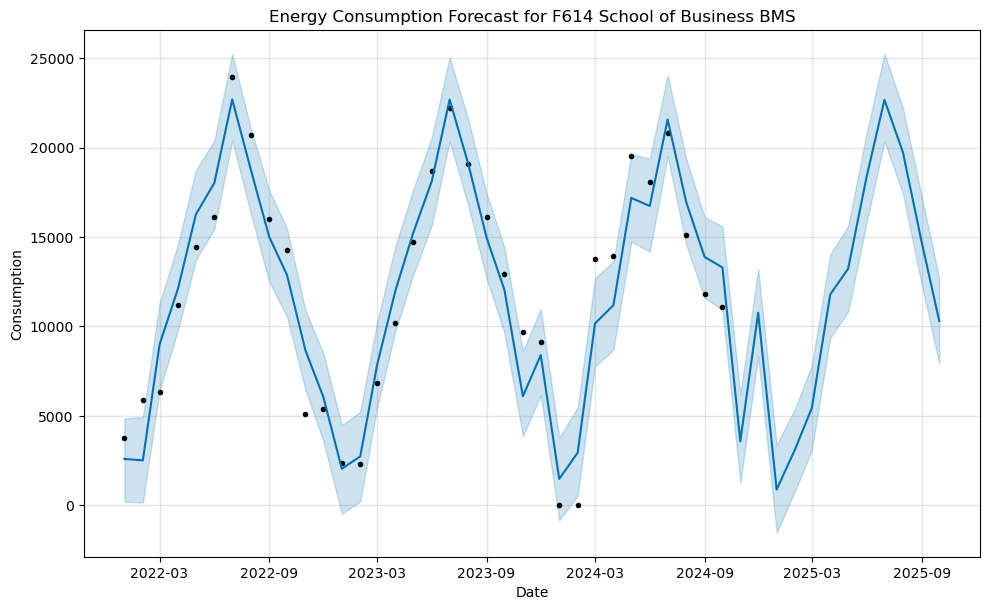

17:50:52 - cmdstanpy - INFO - Chain [1] start processing


Processing F622 Psychology wood boiler (IP 10.81.146.160)...


17:50:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


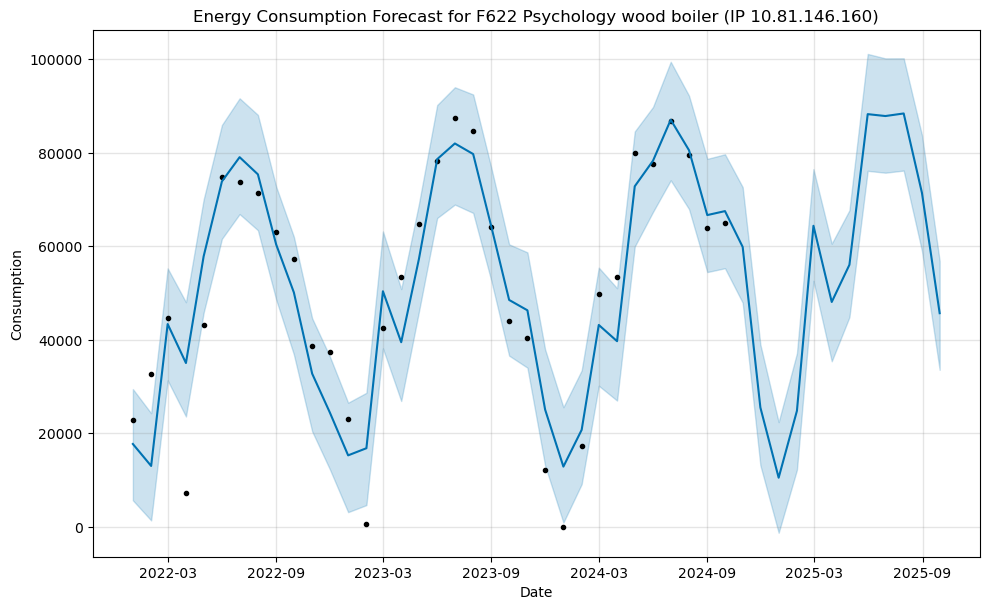

17:50:53 - cmdstanpy - INFO - Chain [1] start processing


Processing F620 Psychology to buffer vessel Goddard (IP 10.81.146.160)...


17:50:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


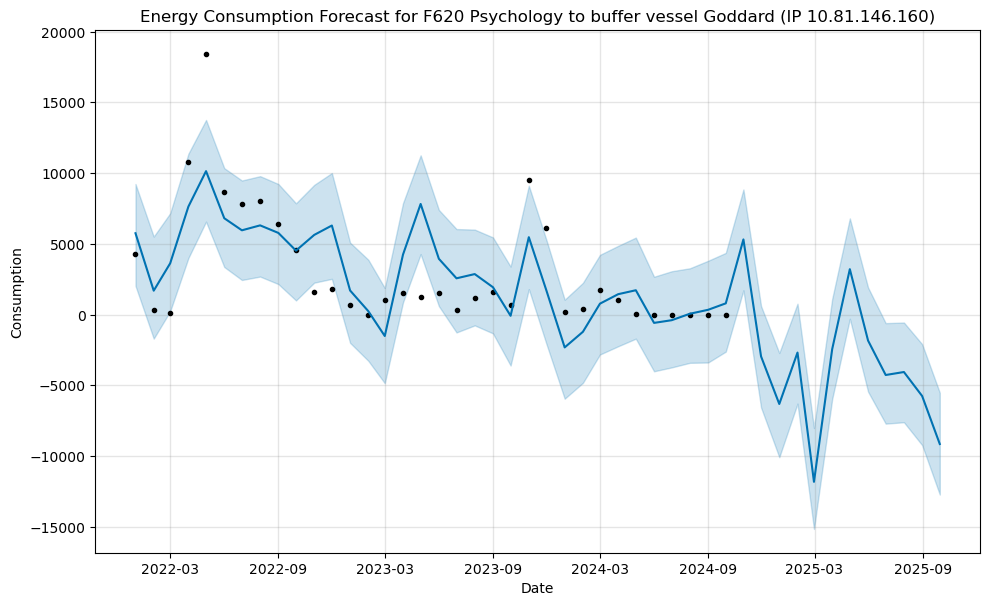

17:50:53 - cmdstanpy - INFO - Chain [1] start processing
17:50:54 - cmdstanpy - INFO - Chain [1] done processing


Processing F620 Psychology from buffer vessel Goddard (IP 10.81.146.160)...


C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


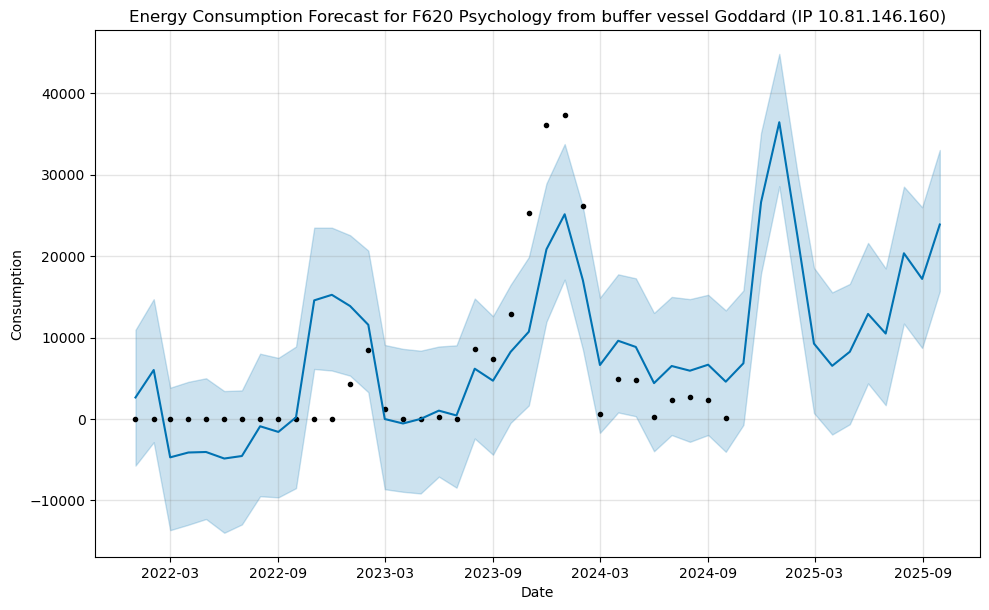

17:50:54 - cmdstanpy - INFO - Chain [1] start processing


Processing F620 Psychology 2c Animal rooms 1st floor(IP 10.81.146.160)...


17:50:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


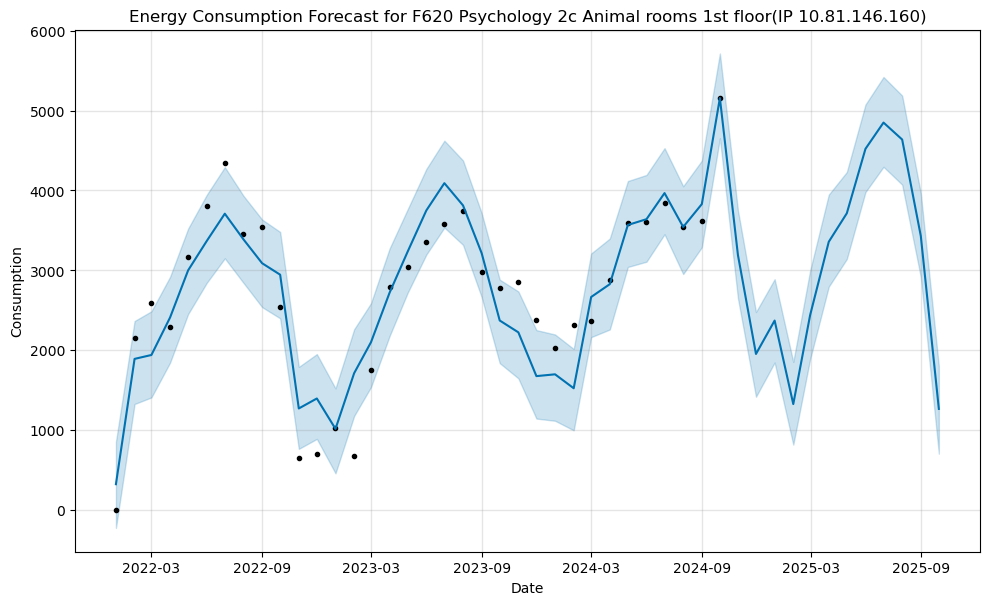

17:50:55 - cmdstanpy - INFO - Chain [1] start processing


Processing F620 Psychology 2c Cage wash (IP 10.81.146.160)...


17:50:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


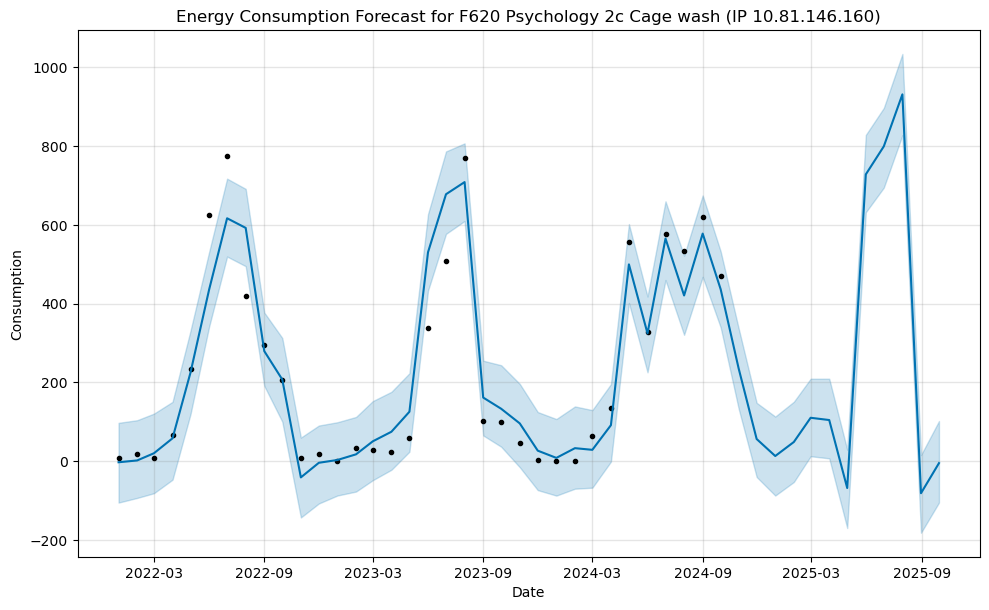

17:50:55 - cmdstanpy - INFO - Chain [1] start processing
17:50:55 - cmdstanpy - INFO - Chain [1] done processing


Processing F620 Psychology 2c main AHU heating coil (IP 10.81.146.160)...


C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


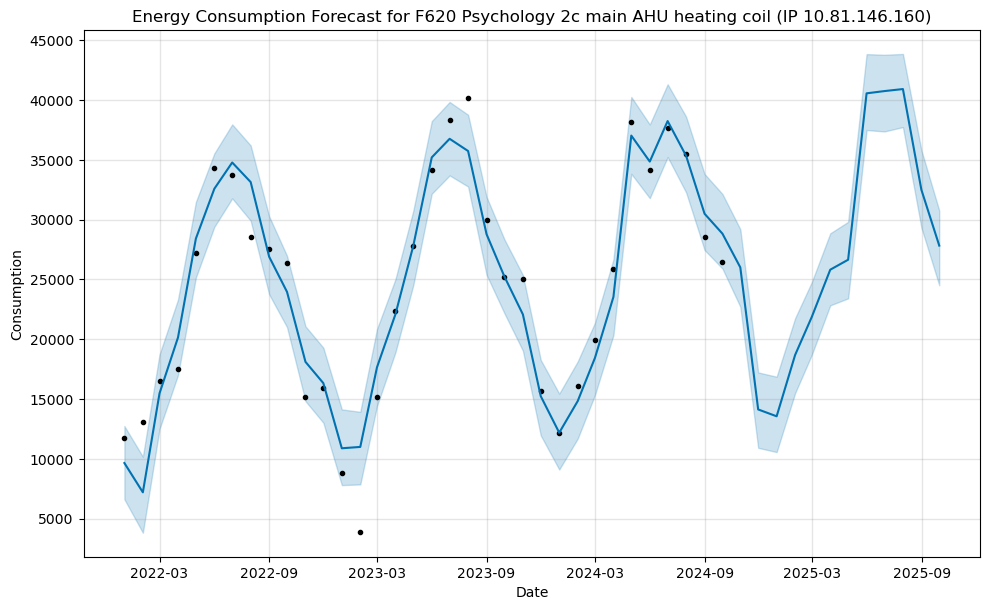

17:50:56 - cmdstanpy - INFO - Chain [1] start processing


Processing F620 Psychology 2c main AHU cooling coil (IP 10.81.146.160)...


17:50:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


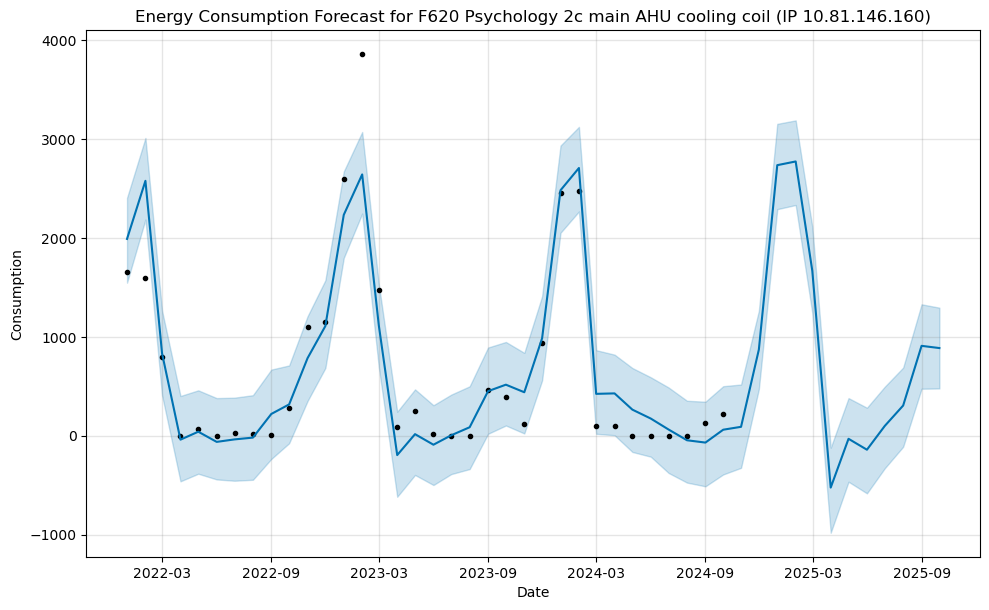

17:50:56 - cmdstanpy - INFO - Chain [1] start processing
17:50:56 - cmdstanpy - INFO - Chain [1] done processing


Processing F718 Darwin...


C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


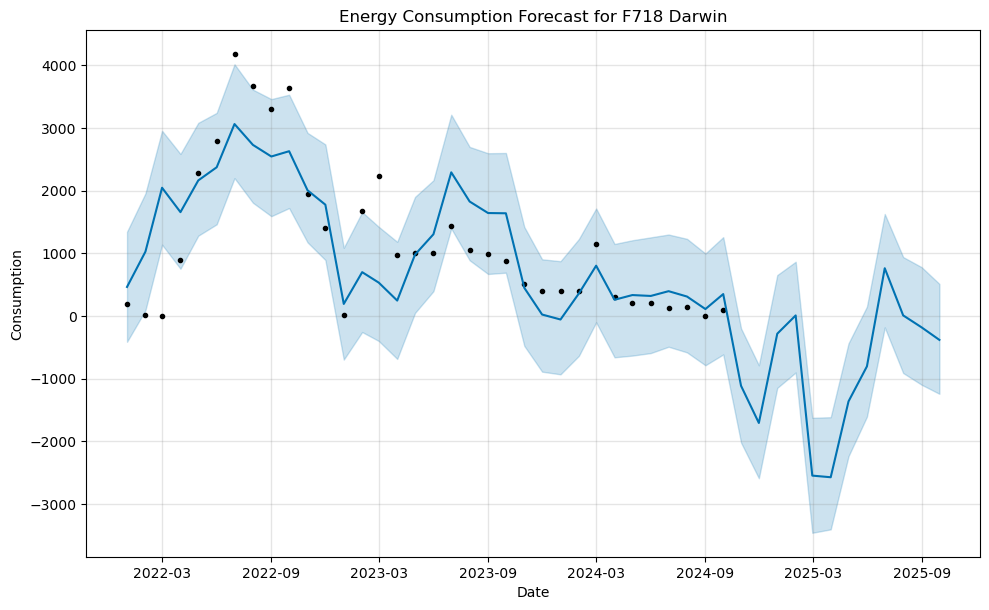

17:50:57 - cmdstanpy - INFO - Chain [1] start processing


Processing F812 Owheo and Robertson combined (10.81.147.145)...


17:50:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


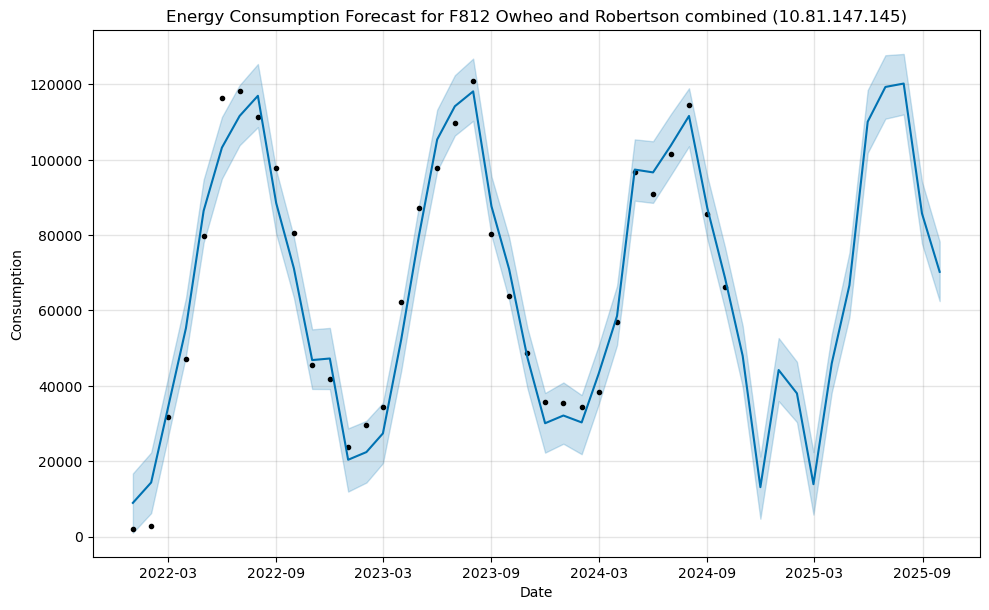

17:50:58 - cmdstanpy - INFO - Chain [1] start processing


Processing F813 Robertson Library...


17:50:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


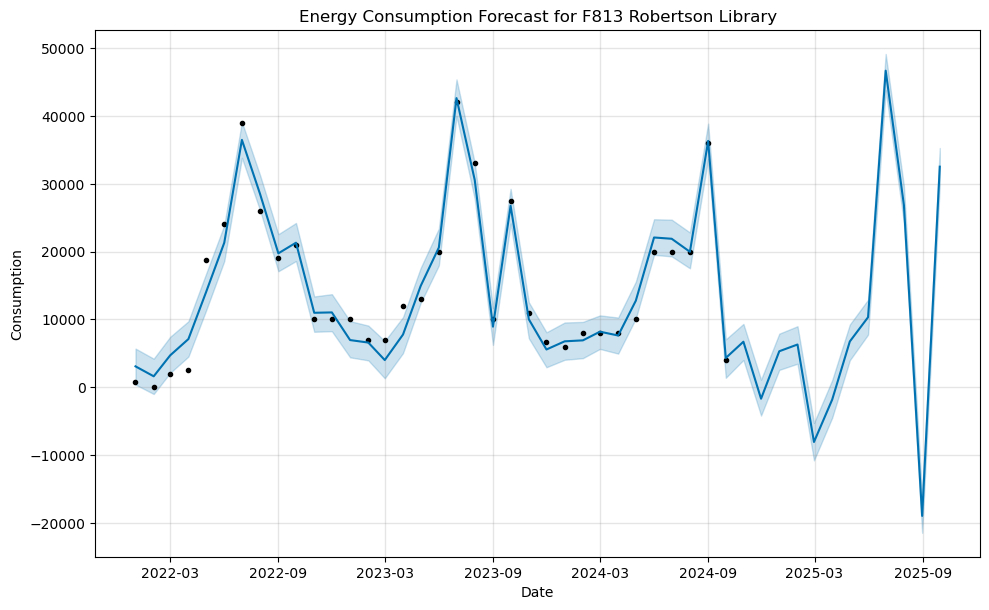

17:50:58 - cmdstanpy - INFO - Chain [1] start processing
17:50:58 - cmdstanpy - INFO - Chain [1] done processing


Processing F916 College of Education wood (invoiced)...


C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


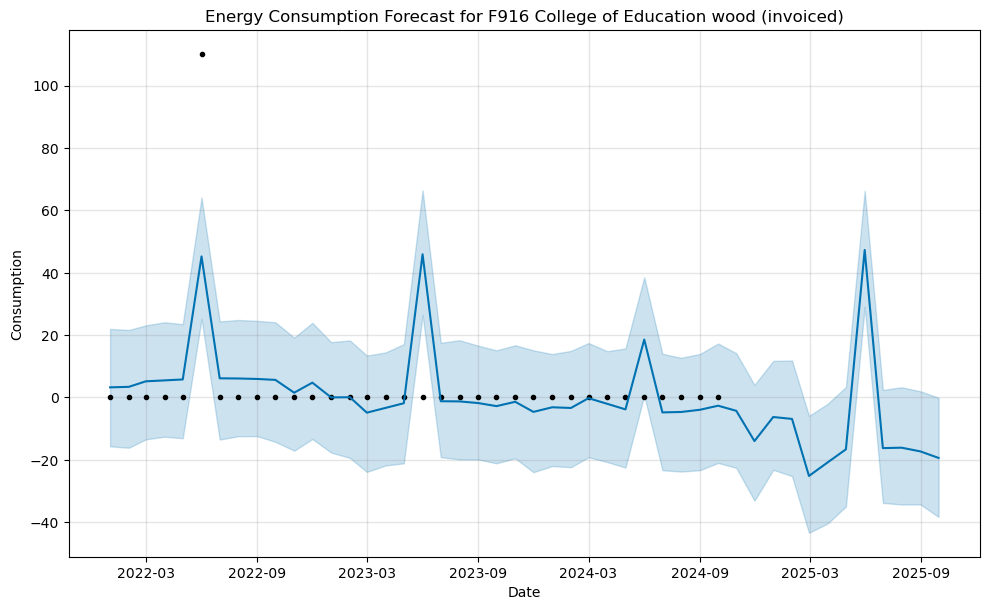

17:50:59 - cmdstanpy - INFO - Chain [1] start processing


Processing F916 College of Education wood boiler (10.81.147.145)...


17:50:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


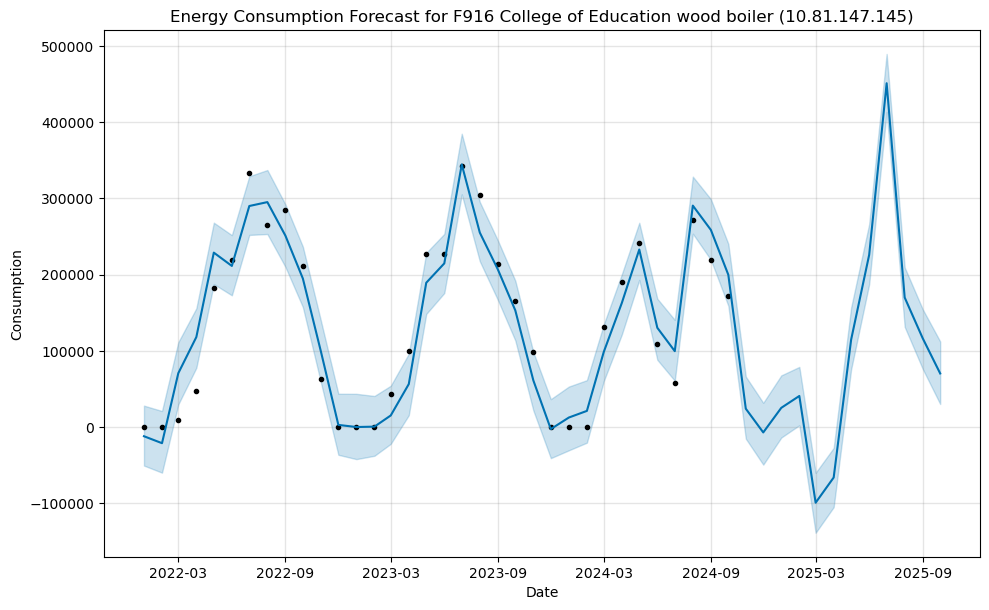

17:50:59 - cmdstanpy - INFO - Chain [1] start processing


Processing F916 College of Education gas Boiler...


17:50:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


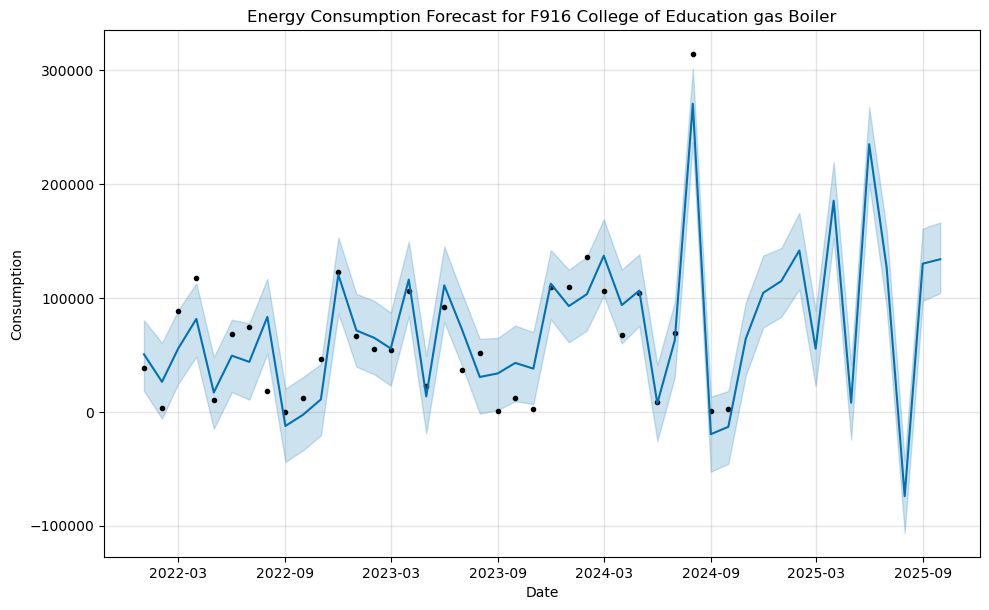

17:51:00 - cmdstanpy - INFO - Chain [1] start processing


Processing F916 College of Education Gas & Wood...


17:51:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


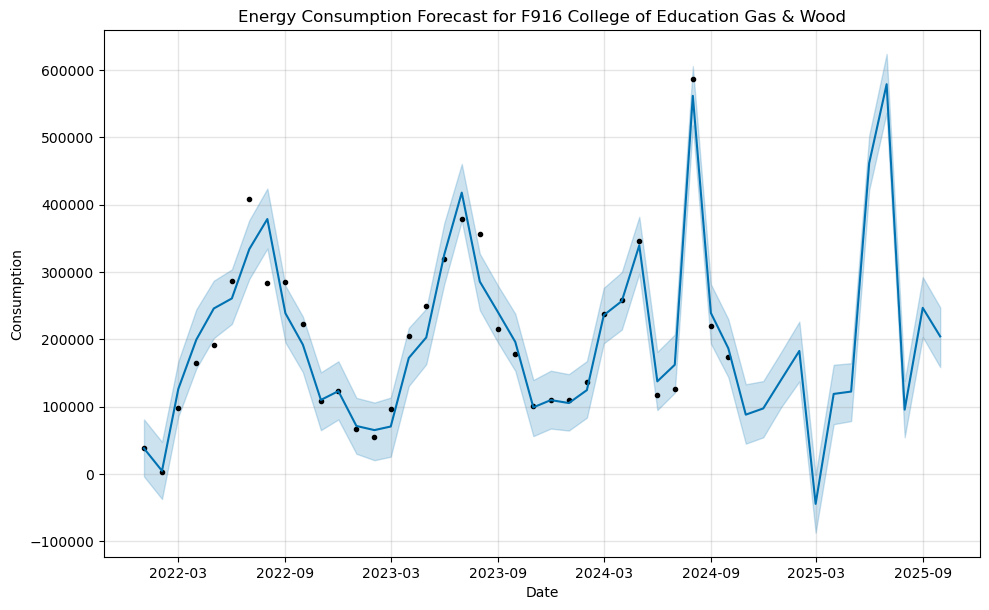

17:51:01 - cmdstanpy - INFO - Chain [1] start processing


Processing F916 College of Education other buildings...


17:51:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


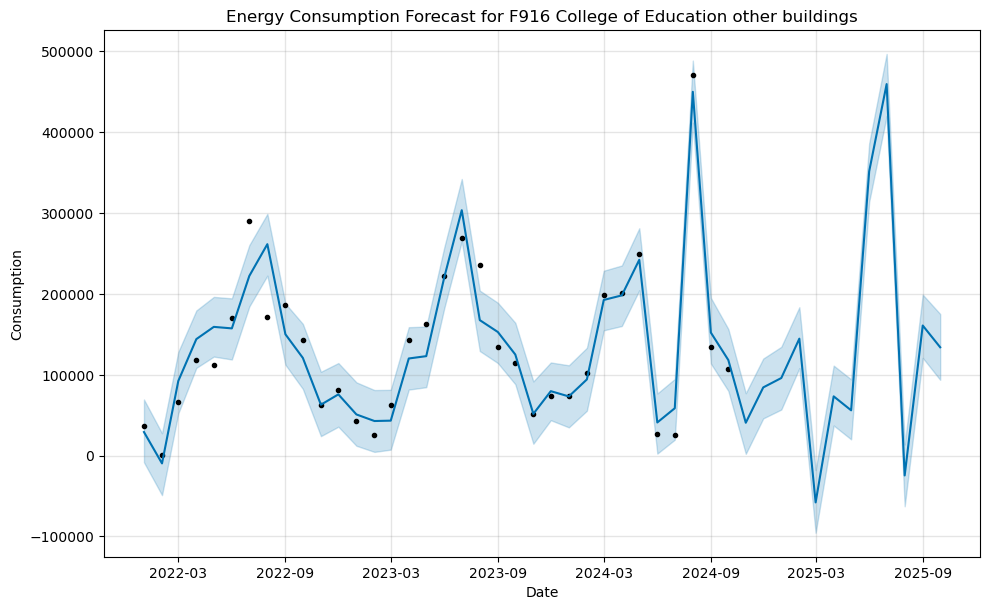

17:51:01 - cmdstanpy - INFO - Chain [1] start processing


Processing H402 St David II Chilled Water Energy  (Desigo)...


17:51:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


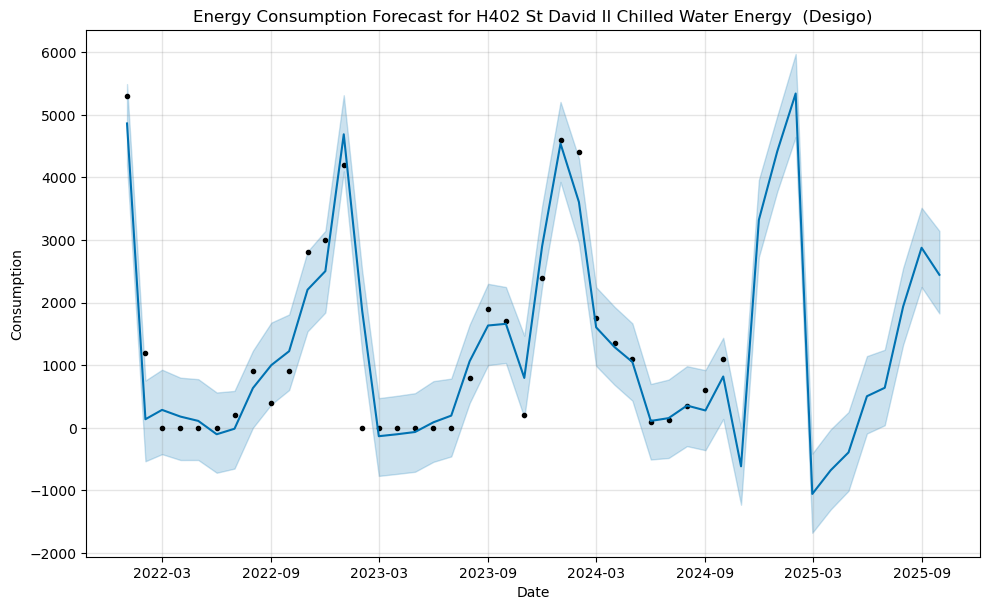

17:51:02 - cmdstanpy - INFO - Chain [1] start processing


Processing H538 Childcare boiler (IP 10.81.149.14)...


17:51:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


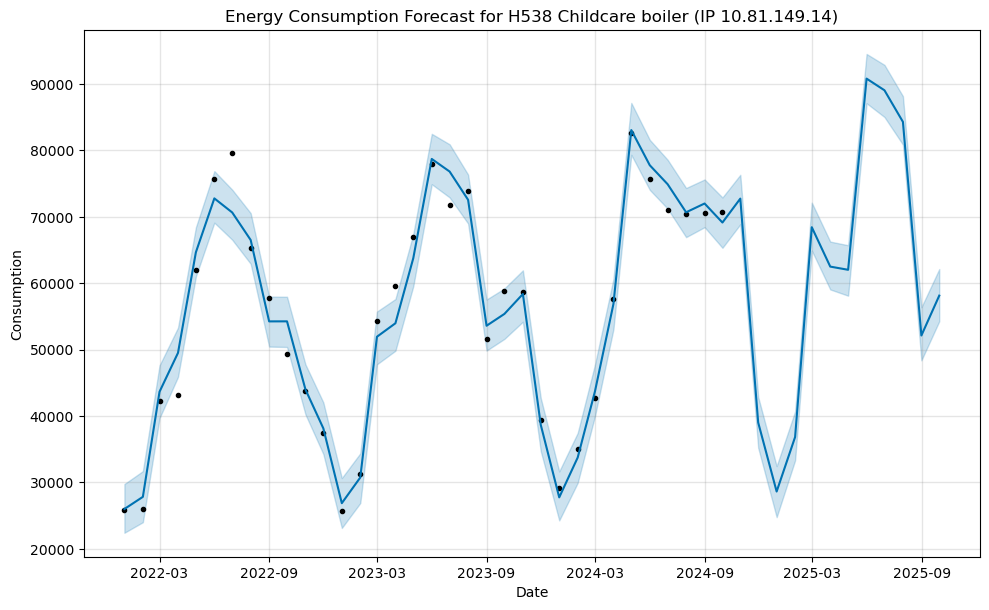

17:51:02 - cmdstanpy - INFO - Chain [1] start processing


Processing H538 Childcare Heat energy usage...


17:51:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


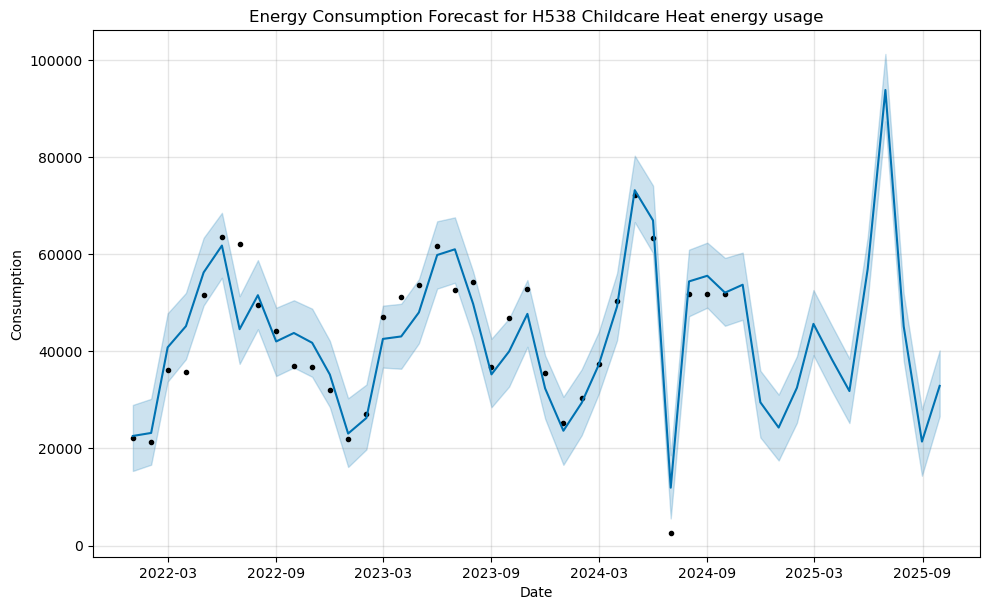

17:51:03 - cmdstanpy - INFO - Chain [1] start processing


Processing H538 Percentage of total Boiler house Heat...


17:51:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


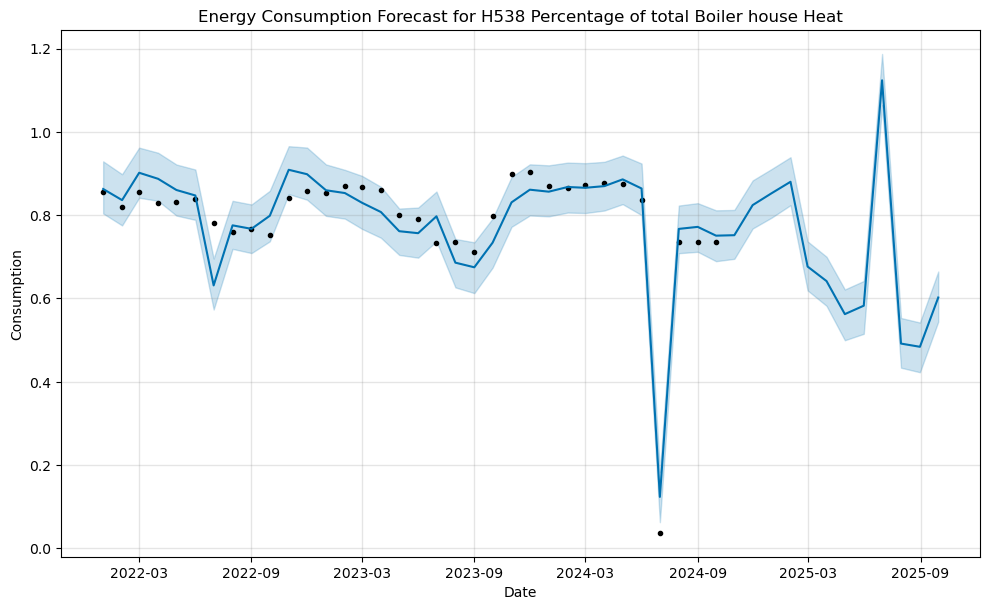

17:51:04 - cmdstanpy - INFO - Chain [1] start processing


Processing H538 CSAFE ...


17:51:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


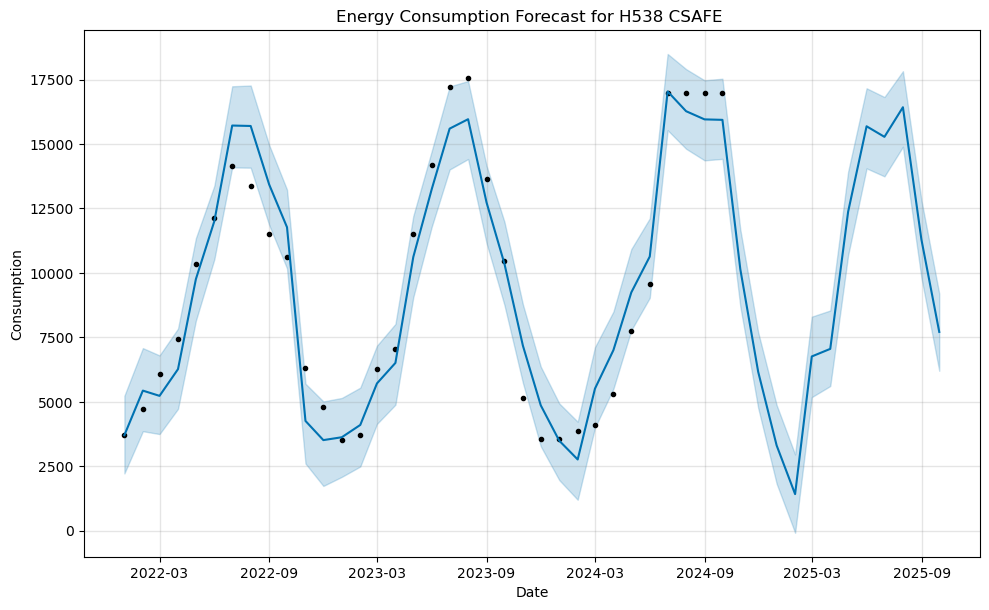

17:51:04 - cmdstanpy - INFO - Chain [1] start processing


Processing H538 31 Montgomery Ave ...


17:51:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


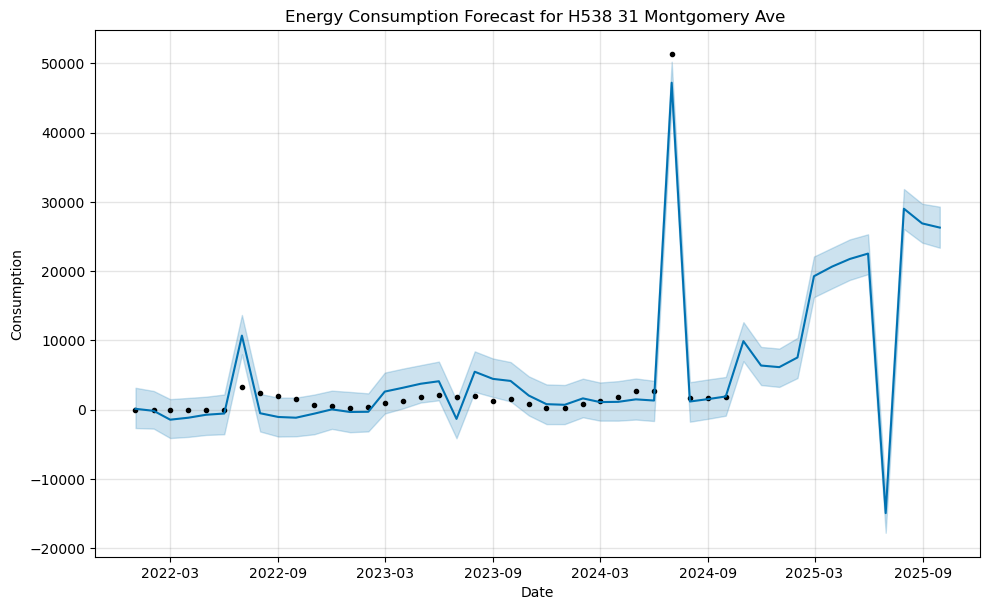

17:51:05 - cmdstanpy - INFO - Chain [1] start processing


Processing H633 Arana Boiler (IP 10.81.148.22)...


17:51:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\sugan\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


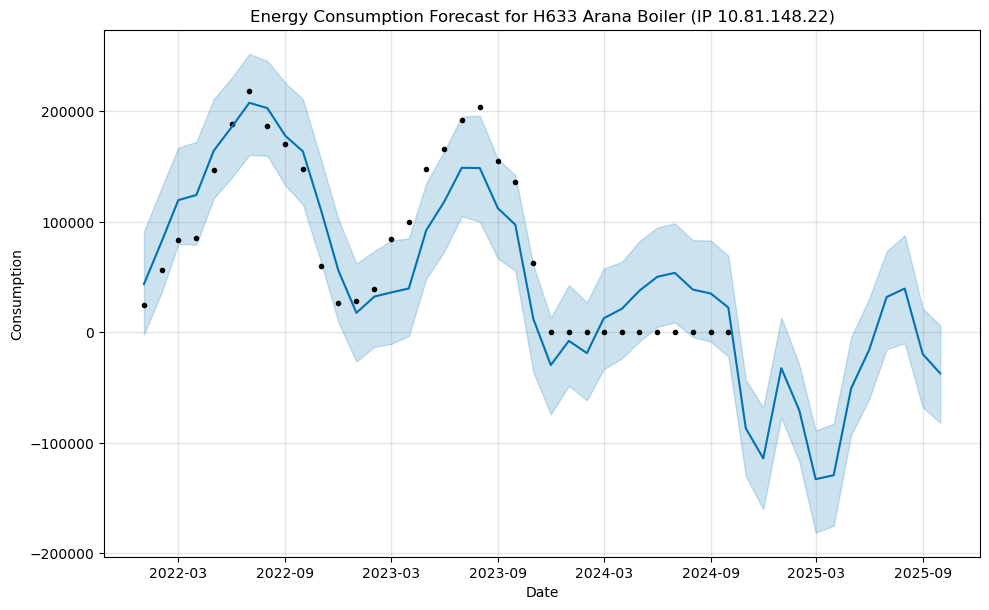

In [76]:
import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values.csv')

# Filter rows for F, G, and H coded meter locations
filtered_df = df[df['Meter_Location'].str.startswith(('F', 'G', 'H'))]

# Reshape the dataset into long format
long_df = filtered_df.melt(id_vars=['Meter_Location'], 
                           var_name='Month', 
                           value_name='Consumption')

# Convert Month column to datetime
long_df['Month'] = pd.to_datetime(long_df['Month'], format='%b-%y', errors='coerce')

# Drop rows with invalid dates or missing consumption values
long_df = long_df.dropna(subset=['Month', 'Consumption'])

# Rename columns to fit Prophet's requirements
long_df = long_df.rename(columns={'Month': 'ds', 'Consumption': 'y'})

# Initialize a dictionary to store forecasts for each location
forecasts = {}

# Forecast for each meter location separately
for location in long_df['Meter_Location'].unique():
    print(f"Processing {location}...")
    
    # Filter data for the specific location
    location_data = long_df[long_df['Meter_Location'] == location]
    
    # Initialize and fit Prophet model
    model = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
    model.fit(location_data)
    
    # Create future dataframe for 12 months into the future
    future = model.make_future_dataframe(periods=12, freq='M')
    
    # Make predictions
    forecast = model.predict(future)
    
    # Store forecast in dictionary
    forecasts[location] = forecast
    
    # Plot the forecast
    fig = model.plot(forecast)
    plt.title(f"Energy Consumption Forecast for {location}")
    plt.xlabel("Date")
    plt.ylabel("Consumption")
    plt.show()

# Optionally save forecasts to CSV files
#for location, forecast in forecasts.items():
   # forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].to_csv(f"{location}_forecast.csv", index=False)


In [78]:
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
import numpy as np

# Load the dataset
file_path = 'Actual_lthw_consumption_values.csv'
df = pd.read_csv(file_path)

# Reshape the dataset into long format
long_df = df.melt(id_vars=['Meter_Location'], 
                   var_name='Month', 
                   value_name='Consumption')

# Convert Month column to datetime
long_df['Month'] = pd.to_datetime(long_df['Month'], format='%b-%y', errors='coerce')

# Drop rows with invalid dates or missing consumption values
long_df = long_df.dropna(subset=['Month', 'Consumption'])

# Filter data for F, G, and H coded meter locations
filtered_df = long_df[long_df['Meter_Location'].str.startswith(('F', 'G', 'H'))]

# Initialize a dictionary to store RMSE and R2 values
metrics = {}

# Loop through each meter location
for location in filtered_df['Meter_Location'].unique():
    # Filter data for the specific location
    location_data = filtered_df[filtered_df['Meter_Location'] == location]

    # Prepare data for regression (use Month as X and Consumption as y)
    X = location_data['Month'].map(pd.Timestamp.toordinal).values.reshape(-1, 1)
    y = location_data['Consumption'].values

    # Use a simple linear regression model for demonstration
    model = LinearRegression()
    model.fit(X, y)

    # Make predictions
    y_pred = model.predict(X)

    # Calculate RMSE and R2
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    r2 = r2_score(y, y_pred)

    # Store the metrics
    metrics[location] = {'RMSE': rmse, 'R2': r2}

# Display metrics for all meter locations
for location, metric in metrics.items():
    print(f"Location: {location}")
    print(f"  RMSE: {metric['RMSE']:.2f}")
    print(f"  R²: {metric['R2']:.4f}")


Location: F614 School of Business BMS
  RMSE: 6389.14
  R²: 0.0240
Location: F622 Psychology wood boiler (IP 10.81.146.160)
  RMSE: 24195.81
  R²: 0.0767
Location: F620 Psychology to buffer vessel Goddard (IP 10.81.146.160)
  RMSE: 3584.76
  R²: 0.2518
Location: F620 Psychology from buffer vessel Goddard (IP 10.81.146.160)
  RMSE: 9457.29
  R²: 0.1184
Location: F620 Psychology 2c Animal rooms 1st floor(IP 10.81.146.160)
  RMSE: 1029.97
  R²: 0.1615
Location: F620 Psychology 2c Cage wash (IP 10.81.146.160)
  RMSE: 242.65
  R²: 0.0642
Location: F620 Psychology 2c main AHU heating coil (IP 10.81.146.160)
  RMSE: 8864.22
  R²: 0.1211
Location: F620 Psychology 2c main AHU cooling coil (IP 10.81.146.160)
  RMSE: 944.06
  R²: 0.0266
Location: F718 Darwin
  RMSE: 1017.47
  R²: 0.2492
Location: F812 Owheo and Robertson combined (10.81.147.145)
  RMSE: 33225.03
  R²: 0.0515
Location: F813 Robertson Library
  RMSE: 10825.07
  R²: 0.0149
Location: F916 College of Education wood (invoiced)
  RMSE: 

C:\Users\sugan\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
C:\Users\sugan\AppData\Local\Temp\ipykernel_23220\2525157438.py:54: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  future_months = pd.date_range(start=aggregated_data['Month'].iloc[-1] + pd.DateOffset(months=1), periods=12, freq='M')


RMSE: 416472.44755041494
R²: 0.30798397992294446


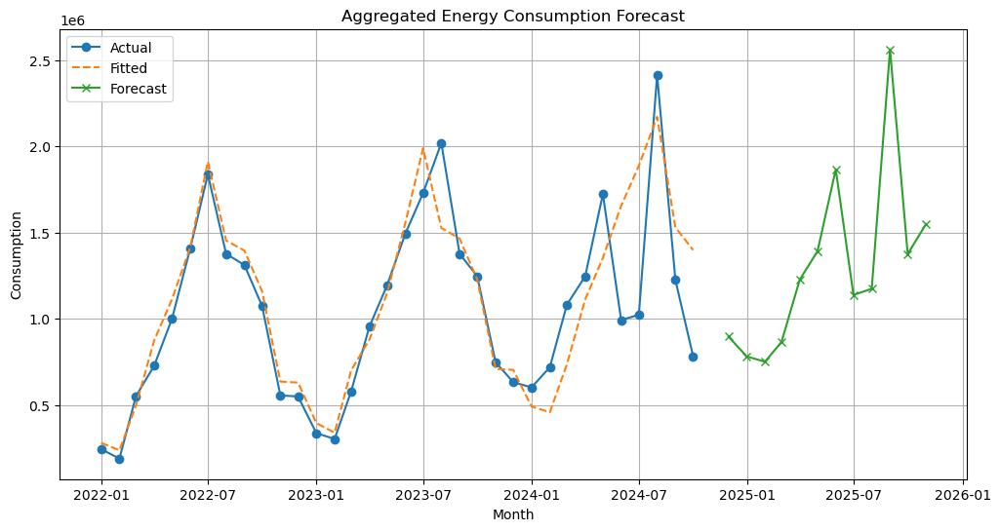

In [80]:
import pandas as pd
import numpy as np
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values.csv')

# Reshape the dataset into long format
long_df = df.melt(id_vars=['Meter_Location'], 
                   var_name='Month', 
                   value_name='Consumption')

# Convert Month column to datetime
long_df['Month'] = pd.to_datetime(long_df['Month'], format='%b-%y', errors='coerce')

# Drop rows with invalid dates or missing consumption values
long_df = long_df.dropna(subset=['Month', 'Consumption'])

# Aggregate monthly consumption data by summing all meter locations
aggregated_data = long_df.groupby('Month')['Consumption'].sum().reset_index()

# Sort data by Month
aggregated_data = aggregated_data.sort_values('Month')

# Fit an Exponential Smoothing model
model = ExponentialSmoothing(aggregated_data['Consumption'], seasonal='add', seasonal_periods=12, trend='add')
fit = model.fit()

# Forecast for the next 12 months
forecast = fit.forecast(12)

# Evaluate model performance (last 12 months of actual vs fitted)
actual = aggregated_data['Consumption'][-12:].values  # Last 12 months of actual data
predicted = fit.fittedvalues[-12:].values  # Last 12 months of fitted values

rmse = np.sqrt(mean_squared_error(actual, predicted))
r2 = r2_score(actual, predicted)

print(f"RMSE: {rmse}")
print(f"R²: {r2}")

# Plot actual, fitted, and forecasted data
plt.figure(figsize=(12, 6))

# Plot actual data
plt.plot(aggregated_data['Month'], aggregated_data['Consumption'], label='Actual', marker='o')

# Plot fitted values
plt.plot(aggregated_data['Month'], fit.fittedvalues, label='Fitted', linestyle='--')

# Plot forecasted values
future_months = pd.date_range(start=aggregated_data['Month'].iloc[-1] + pd.DateOffset(months=1), periods=12, freq='M')
plt.plot(future_months, forecast, label='Forecast', marker='x')

# Add labels and legend
plt.title('Aggregated Energy Consumption Forecast')
plt.xlabel('Month')
plt.ylabel('Consumption')
plt.legend()
plt.grid()
plt.show()


C:\Users\sugan\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
C:\Users\sugan\AppData\Local\Temp\ipykernel_23220\110017195.py:63: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  future_months = pd.date_range(start=aggregated_data['Month'].iloc[-1] + pd.DateOffset(months=1), periods=12, freq='M')


RMSE (Fitted): 416472.45
R² (Fitted): 0.3080


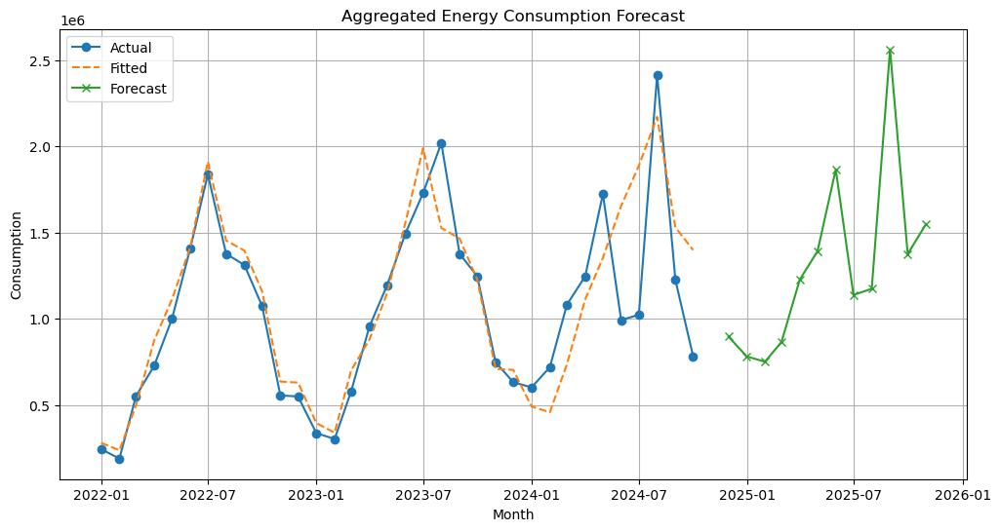

In [82]:
import pandas as pd
import numpy as np
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values.csv')

# Reshape the dataset into long format
long_df = df.melt(id_vars=['Meter_Location'], 
                   var_name='Month', 
                   value_name='Consumption')

# Convert Month column to datetime
long_df['Month'] = pd.to_datetime(long_df['Month'], format='%b-%y', errors='coerce')

# Drop rows with invalid dates or missing consumption values
long_df = long_df.dropna(subset=['Month', 'Consumption'])

# Aggregate monthly consumption data by summing all meter locations
aggregated_data = long_df.groupby('Month')['Consumption'].sum().reset_index()

# Sort data by Month
aggregated_data = aggregated_data.sort_values('Month')

# Fit an Exponential Smoothing model
model = ExponentialSmoothing(aggregated_data['Consumption'], seasonal='add', seasonal_periods=12, trend='add')
fit = model.fit()

# Forecast for the next 12 months
forecast = fit.forecast(12)

# Evaluate model performance (last 12 months of actual vs fitted)
actual = aggregated_data['Consumption'][-12:].values  # Last 12 months of actual data
fitted_values = fit.fittedvalues[-12:].values  # Last 12 months of fitted values

# Calculate RMSE and R² for fitted values
rmse_fitted = np.sqrt(mean_squared_error(actual, fitted_values))
r2_fitted = r2_score(actual, fitted_values)

print(f"RMSE (Fitted): {rmse_fitted:.2f}")
print(f"R² (Fitted): {r2_fitted:.4f}")

# Evaluate forecast performance (if ground truth is available for forecasted months)
forecasted_actual = []  # Replace with actual values for forecasted months if available
if len(forecasted_actual) > 0:
    rmse_forecast = np.sqrt(mean_squared_error(forecasted_actual, forecast))
    r2_forecast = r2_score(forecasted_actual, forecast)
    print(f"RMSE (Forecast): {rmse_forecast:.2f}")
    print(f"R² (Forecast): {r2_forecast:.4f}")

# Plot actual, fitted, and forecasted data
plt.figure(figsize=(12, 6))

# Plot actual data
plt.plot(aggregated_data['Month'], aggregated_data['Consumption'], label='Actual', marker='o')

# Plot fitted values
plt.plot(aggregated_data['Month'], fit.fittedvalues, label='Fitted', linestyle='--')

# Plot forecasted values
future_months = pd.date_range(start=aggregated_data['Month'].iloc[-1] + pd.DateOffset(months=1), periods=12, freq='M')
plt.plot(future_months, forecast, label='Forecast', marker='x')

# Add labels and legend
plt.title('Aggregated Energy Consumption Forecast')
plt.xlabel('Month')
plt.ylabel('Consumption')
plt.legend()
plt.grid()
plt.show()


C:\Users\sugan\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\sugan\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\sugan\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\sugan\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


RMSE (Test): 468206.25
R² (Test): 0.1565


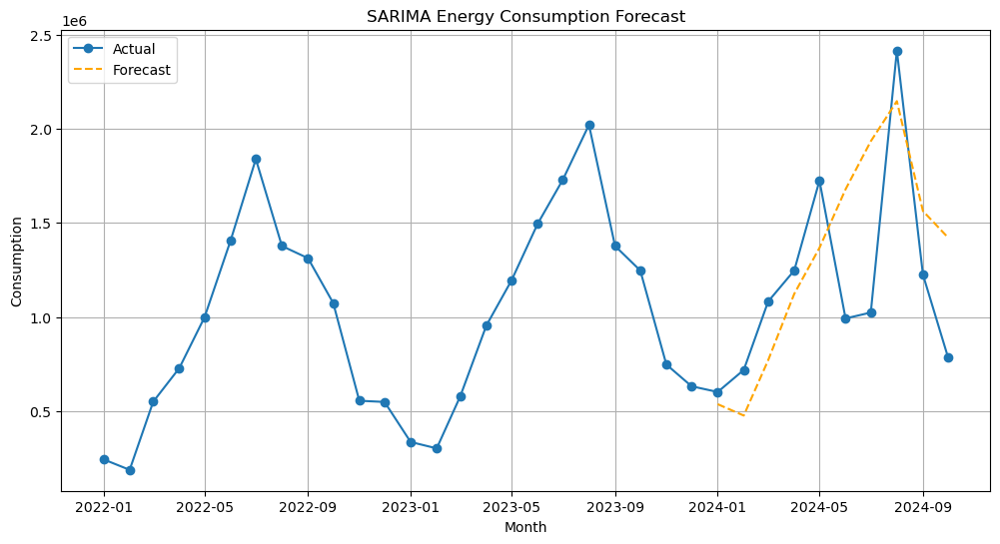

In [84]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values.csv')

# Reshape the dataset into long format
long_df = df.melt(id_vars=['Meter_Location'], 
                   var_name='Month', 
                   value_name='Consumption')

# Convert Month column to datetime
long_df['Month'] = pd.to_datetime(long_df['Month'], format='%b-%y', errors='coerce')

# Drop rows with invalid dates or missing consumption values
long_df = long_df.dropna(subset=['Month', 'Consumption'])

# Aggregate monthly consumption data by summing all meter locations
aggregated_data = long_df.groupby('Month')['Consumption'].sum().reset_index()

# Sort data by Month
aggregated_data = aggregated_data.sort_values('Month')
aggregated_data.set_index('Month', inplace=True)

# Split data into training and testing sets
train_data = aggregated_data[:'2023-12']
test_data = aggregated_data['2024-01':]

# Fit a SARIMA model (Seasonal ARIMA)
model = SARIMAX(train_data['Consumption'], 
                order=(1, 1, 1),  # ARIMA(p, d, q)
                seasonal_order=(1, 1, 0, 12))  # Seasonal order (P, D, Q, s)
fit = model.fit(disp=False)

# Forecast future values
forecast = fit.forecast(steps=len(test_data))

# Evaluate model performance on test data
rmse_test = np.sqrt(mean_squared_error(test_data['Consumption'], forecast))
r2_test = r2_score(test_data['Consumption'], forecast)

print(f"RMSE (Test): {rmse_test:.2f}")
print(f"R² (Test): {r2_test:.4f}")

# Plot actual vs forecasted values
plt.figure(figsize=(12, 6))
plt.plot(aggregated_data.index, aggregated_data['Consumption'], label='Actual', marker='o')
plt.plot(forecast.index, forecast.values, label='Forecast', linestyle='--', color='orange')
plt.title('SARIMA Energy Consumption Forecast')
plt.xlabel('Month')
plt.ylabel('Consumption')
plt.legend()
plt.grid()
plt.show()


In [90]:
import pandas as pd
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values.csv')

def create_features(df):
    """Create features with seasonal and historical components"""
    # Convert month columns to datetime
    df_melted = df.melt(id_vars=['Meter_Location'], 
                        var_name='Month', 
                        value_name='Consumption')
    df_melted['Month'] = pd.to_datetime(df_melted['Month'], format='%b-%y', errors='coerce')
    
    # Drop rows with invalid dates
    df_melted = df_melted.dropna(subset=['Month'])
    
    # Sort and create features
    df_melted = df_melted.sort_values(['Meter_Location', 'Month'])
    
    # Historical features
    df_melted['rolling_mean_3'] = df_melted.groupby('Meter_Location')['Consumption'].rolling(3, min_periods=1).mean().reset_index(0, drop=True)
    df_melted['rolling_mean_6'] = df_melted.groupby('Meter_Location')['Consumption'].rolling(6, min_periods=1).mean().reset_index(0, drop=True)
    
    # Lag features
    df_melted['lag_1'] = df_melted.groupby('Meter_Location')['Consumption'].shift(1)
    df_melted['lag_2'] = df_melted.groupby('Meter_Location')['Consumption'].shift(2)
    
    # Seasonal features
    df_melted['month_sin'] = np.sin(2 * np.pi * df_melted['Month'].dt.month / 12)
    df_melted['month_cos'] = np.cos(2 * np.pi * df_melted['Month'].dt.month / 12)
    
    return df_melted

def train_evaluate_model(X, y):
    """Train and evaluate a Random Forest model"""
    
    # Initialize Random Forest model with tuned hyperparameters
    model = RandomForestRegressor(
        n_estimators=200,
        max_depth=15,
        min_samples_split=5,
        min_samples_leaf=4,
        random_state=42
    )
    
    # Time series cross-validation
    tscv = TimeSeriesSplit(n_splits=3)
    
    train_r2_scores, test_r2_scores = [], []
    train_rmse_scores, test_rmse_scores = [], []
    
    for train_idx, test_idx in tscv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Scale features
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        
        # Fit and predict
        model.fit(X_train_scaled, y_train)
        y_train_pred = model.predict(X_train_scaled)
        y_test_pred = model.predict(X_test_scaled)
        
        # Calculate metrics
        train_r2_scores.append(r2_score(y_train, y_train_pred))
        test_r2_scores.append(r2_score(y_test, y_test_pred))
        train_rmse_scores.append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
        test_rmse_scores.append(np.sqrt(mean_squared_error(y_test, y_test_pred)))
    
    print(f"Train R²: {np.mean(train_r2_scores):.4f}")
    print(f"Test R²: {np.mean(test_r2_scores):.4f}")
    print(f"Train RMSE: {np.mean(train_rmse_scores):.4f}")
    print(f"Test RMSE: {np.mean(test_rmse_scores):.4f}")

# Create features
df_features = create_features(df)

# Drop rows with missing values after feature creation
df_features = df_features.dropna()

# Prepare X and y for modeling
X = df_features[['rolling_mean_3', 'rolling_mean_6', 'lag_1', 'lag_2', 'month_sin', 'month_cos']]
y = df_features['Consumption']

# Train and evaluate the model
train_evaluate_model(X, y)


Train R²: 0.9451
Test R²: 0.7777
Train RMSE: 9064.3847
Test RMSE: 29164.0748


In [92]:
 df_melted

NameError: name 'df_melted' is not defined

In [94]:
df.melt(id_vars=['Meter_Location'], 
                        var_name='Month', 
                        value_name='Consumption')

,Meter_Location,Month,Consumption
0,E308 Student Health,Jan-22,0.00
1,E811.TE.RANGIHIROA.MTHW HX0.1a,Jan-22,0.00
2,E811.TE.RANGIHIROA.MTHW HX0.1b,Jan-22,0.00
3,E811.TE.RANGIHIROA.MTHW HX0.2 DHW,Jan-22,0.00
4,E811.TE.RANGIHIROA.LTHW Ground,Jan-22,0.00
...,...,...,...
1253,J141 Aquinas Priory solar (Desigo),Oct-24,718.00
1254,J122 Carrington Jenkins boiler,Oct-24,5.03
1255,K430 Caroline Freeman College East (Abbey) sol...,Oct-24,79.30
1256,XI01 Invercargill Boiler (IP 10.85.4.21),Oct-24,10.00


In [101]:
import pandas as pd
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values.csv')

# Step 1: Filter for F-, G-, H-coded buildings
filtered_df = df[df['Meter_Location'].str.startswith(('F', 'G', 'H'))]

# Step 2: Create features
def create_features(df):
    """Create features with seasonal and historical components."""
    df_melted = df.melt(id_vars=['Meter_Location'], 
                        var_name='Month', 
                        value_name='Consumption')
    df_melted['Month'] = pd.to_datetime(df_melted['Month'], format='%b-%y', errors='coerce')
    df_melted = df_melted.dropna(subset=['Month'])
    df_melted = df_melted.sort_values(['Meter_Location', 'Month'])
    
    # Historical features
    df_melted['rolling_mean_3'] = df_melted.groupby('Meter_Location')['Consumption'].rolling(3, min_periods=1).mean().reset_index(0, drop=True)
    df_melted['rolling_mean_6'] = df_melted.groupby('Meter_Location')['Consumption'].rolling(6, min_periods=1).mean().reset_index(0, drop=True)
    
    # Lag features
    df_melted['lag_1'] = df_melted.groupby('Meter_Location')['Consumption'].shift(1)
    df_melted['lag_2'] = df_melted.groupby('Meter_Location')['Consumption'].shift(2)
    
    # Seasonal features
    df_melted['month_sin'] = np.sin(2 * np.pi * df_melted['Month'].dt.month / 12)
    df_melted['month_cos'] = np.cos(2 * np.pi * df_melted['Month'].dt.month / 12)
    
    return df_melted

df_features = create_features(filtered_df)
df_features = df_features.dropna()

# Step 3: Select top two most important features based on feature importance
X = df_features[['rolling_mean_3', 'lag_2']]  # Top two important features
y = df_features['Consumption']

# Step 4: Check for multicollinearity using VIF
def calculate_vif(X):
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif_data

vif_data = calculate_vif(X)
print("\nVariance Inflation Factor (VIF):")
print(vif_data)

# Ensure VIF values are below 5 to avoid multicollinearity

# Step 5: Train and evaluate model with selected features
def train_evaluate_model(X, y):
    """Train and evaluate a Random Forest model."""
    model = RandomForestRegressor(
        n_estimators=200,
        max_depth=15,
        min_samples_split=5,
        min_samples_leaf=4,
        random_state=42
    )
    
    tscv = TimeSeriesSplit(n_splits=3)
    
    train_r2_scores, test_r2_scores = [], []
    train_rmse_scores, test_rmse_scores = [], []
    
    for train_idx, test_idx in tscv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        model.fit(X_train_scaled, y_train)
        y_train_pred = model.predict(X_train_scaled)
        y_test_pred = model.predict(X_test_scaled)

        train_r2_scores.append(r2_score(y_train, y_train_pred))
        test_r2_scores.append(r2_score(y_test, y_test_pred))
        train_rmse_scores.append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
        test_rmse_scores.append(np.sqrt(mean_squared_error(y_test, y_test_pred)))
    
    print(f"\nTrain R²: {np.mean(train_r2_scores):.4f}")
    print(f"Test R²: {np.mean(test_r2_scores):.4f}")
    print(f"Train RMSE: {np.mean(train_rmse_scores):.4f}")
    print(f"Test RMSE: {np.mean(test_rmse_scores):.4f}")

train_evaluate_model(X, y)



Variance Inflation Factor (VIF):
          Feature       VIF
0  rolling_mean_3  6.727079
1           lag_2  6.727079

Train R²: 0.9463
Test R²: 0.5720
Train RMSE: 11863.3186
Test RMSE: 43907.6524


In [406]:
import pandas as pd
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values.csv')

# Filter for F-, G-, H-coded buildings
filtered_df = df[df['Meter_Location'].str.startswith(('F', 'G', 'H'))]

# Create features
def create_features(df):
    """Create features with seasonal and historical components."""
    df_melted = df.melt(id_vars=['Meter_Location'], 
                        var_name='Month', 
                        value_name='Consumption')
    df_melted['Month'] = pd.to_datetime(df_melted['Month'], format='%b-%y', errors='coerce')
    df_melted = df_melted.dropna(subset=['Month'])
    df_melted = df_melted.sort_values(['Meter_Location', 'Month'])
    
    # Historical features
    df_melted['rolling_mean_3'] = df_melted.groupby('Meter_Location')['Consumption'].rolling(3, min_periods=1).mean().reset_index(0, drop=True)
    return df_melted

df_features = create_features(filtered_df)
df_features = df_features.dropna()

# Use only the most important feature ('rolling_mean_3')
X = df_features[['rolling_mean_3']]
y = df_features['Consumption']

# Train and evaluate model
def train_evaluate_model(X, y):
    """Train and evaluate a Random Forest model with regularization."""
    model = RandomForestRegressor(
         n_estimators=150,
        max_depth=8,  # Further limit tree depth to prevent overfitting
        min_samples_split=15,  # Increase minimum samples required for a split
        min_samples_leaf=15,  # Increase minimum samples required in a leaf node
        random_state=85
    )
    
    tscv = TimeSeriesSplit(n_splits=3)
    
    train_r2_scores, test_r2_scores = [], []
    train_rmse_scores, test_rmse_scores = [], []
    
    for train_idx, test_idx in tscv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        model.fit(X_train_scaled, y_train)
        y_train_pred = model.predict(X_train_scaled)
        y_test_pred = model.predict(X_test_scaled)

        train_r2_scores.append(r2_score(y_train, y_train_pred))
        test_r2_scores.append(r2_score(y_test, y_test_pred))
        train_rmse_scores.append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
        test_rmse_scores.append(np.sqrt(mean_squared_error(y_test, y_test_pred)))
    
    print(f"\nTrain R²: {np.mean(train_r2_scores):.4f}")
    print(f"Test R²: {np.mean(test_r2_scores):.4f}")
    print(f"Train RMSE: {np.mean(train_rmse_scores):.4f}")
    print(f"Test RMSE: {np.mean(test_rmse_scores):.4f}")

train_evaluate_model(X, y)



Train R²: 0.8232
Test R²: 0.4993
Train RMSE: 20087.7816
Test RMSE: 48789.8289


In [438]:
import pandas as pd
import numpy as np
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values.csv')

# Filter for F-, G-, H-coded buildings
filtered_df = df[df['Meter_Location'].str.startswith(('F', 'G', 'H'))]

# Create features
def create_features(df):
    """Create features with seasonal and historical components."""
    df_melted = df.melt(id_vars=['Meter_Location'], 
                        var_name='Month', 
                        value_name='Consumption')
    df_melted['Month'] = pd.to_datetime(df_melted['Month'], format='%b-%y', errors='coerce')
    df_melted = df_melted.dropna(subset=['Month'])
    df_melted = df_melted.sort_values(['Meter_Location', 'Month'])
    
    # Historical features
    df_melted['rolling_mean_3'] = df_melted.groupby('Meter_Location')['Consumption'].rolling(3, min_periods=1).mean().reset_index(0, drop=True)
    return df_melted

df_features = create_features(filtered_df)
df_features = df_features.dropna()

# Use only the most important feature ('rolling_mean_3')
X = df_features[['rolling_mean_3']]
y = df_features['Consumption']

# Step 1: Define a parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [25, 50, 100,150],
    'max_depth': [2, 3,4],
    'min_samples_split': [5, 10,15],
    'min_samples_leaf': [1, 5,10]
}

# Step 2: Perform GridSearchCV to find the best parameters
def perform_grid_search(X, y):
    """Perform GridSearchCV to find the best hyperparameters."""
    model = RandomForestRegressor(random_state=42)
    
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        cv=4,
        scoring='neg_mean_squared_error',
        verbose=2,
        n_jobs=-1
    )
    
    grid_search.fit(X, y)
    
    print("\nBest Parameters:", grid_search.best_params_)
    return grid_search.best_params_

best_params = perform_grid_search(X, y)

# Step 3: Train and evaluate model with best parameters from GridSearchCV
def train_evaluate_model_with_best_params(X, y, best_params):
    """Train and evaluate a Random Forest model with best parameters."""
    model = RandomForestRegressor(
        n_estimators=best_params['n_estimators'],
        max_depth=best_params['max_depth'],
        min_samples_split=best_params['min_samples_split'],
        min_samples_leaf=best_params['min_samples_leaf'],
        random_state=42
    )
    
    tscv = TimeSeriesSplit(n_splits=3)
    
    train_r2_scores, test_r2_scores = [], []
    train_rmse_scores, test_rmse_scores = [], []
    
    for train_idx, test_idx in tscv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        model.fit(X_train_scaled, y_train)
        y_train_pred = model.predict(X_train_scaled)
        y_test_pred = model.predict(X_test_scaled)

        train_r2_scores.append(r2_score(y_train, y_train_pred))
        test_r2_scores.append(r2_score(y_test, y_test_pred))
        train_rmse_scores.append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
        test_rmse_scores.append(np.sqrt(mean_squared_error(y_test, y_test_pred)))
    
    print(f"\nTrain R²: {np.mean(train_r2_scores):.4f}")
    print(f"Test R²: {np.mean(test_r2_scores):.4f}")
    print(f"Train RMSE: {np.mean(train_rmse_scores):.4f}")
    print(f"Test RMSE: {np.mean(test_rmse_scores):.4f}")

train_evaluate_model_with_best_params(X, y, best_params)


Fitting 4 folds for each of 108 candidates, totalling 432 fits

Best Parameters: {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 15, 'n_estimators': 50}

Train R²: 0.8897
Test R²: 0.5559
Train RMSE: 16317.9932
Test RMSE: 44752.6968


In [442]:
import pandas as pd
import numpy as np
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values.csv')

# Filter for F-, G-, H-coded buildings
filtered_df = df[df['Meter_Location'].str.startswith(('F', 'G', 'H'))]

# Step 1: Handle anomalies by replacing them with mean consumption for each Meter_Location
def handle_anomalies(df):
    """Replace anomalies (negative or missing values) with the mean consumption."""
    df['Consumption'] = df.groupby('Meter_Location')['Consumption'].transform(
        lambda x: np.where((x < 0) | (x.isnull()), x.mean(), x)
    )
    return df

# Step 2: Create features
def create_features(df):
    """Create features with seasonal and historical components."""
    df_melted = df.melt(id_vars=['Meter_Location'], 
                        var_name='Month', 
                        value_name='Consumption')
    df_melted['Month'] = pd.to_datetime(df_melted['Month'], format='%b-%y', errors='coerce')
    df_melted = df_melted.dropna(subset=['Month'])
    df_melted = df_melted.sort_values(['Meter_Location', 'Month'])
    
    # Handle anomalies
    df_melted = handle_anomalies(df_melted)
    
    # Historical features
    df_melted['rolling_mean_3'] = df_melted.groupby('Meter_Location')['Consumption'].rolling(3, min_periods=1).mean().reset_index(0, drop=True)
    return df_melted

df_features_cleaned = create_features(filtered_df)
df_features_cleaned = df_features_cleaned.dropna()

# Use only the most important feature ('rolling_mean_3')
X = df_features_cleaned[['rolling_mean_3']]
y = df_features_cleaned['Consumption']

# Step 3: Define a parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [25, 50, 100, 150],
    'max_depth': [2, 3, 4],
    'min_samples_split': [5, 10, 15],
    'min_samples_leaf': [1, 5, 10]
}

# Step 4: Perform GridSearchCV to find the best parameters
def perform_grid_search(X, y):
    """Perform GridSearchCV to find the best hyperparameters."""
    model = RandomForestRegressor(random_state=42)
    
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        cv=4,
        scoring='neg_mean_squared_error',
        verbose=2,
        n_jobs=-1
    )
    
    grid_search.fit(X, y)
    
    print("\nBest Parameters:", grid_search.best_params_)
    return grid_search.best_params_

best_params = perform_grid_search(X, y)

# Step 5: Train and evaluate model with best parameters from GridSearchCV
def train_evaluate_model_with_best_params(X, y, best_params):
    """Train and evaluate a Random Forest model with best parameters."""
    model = RandomForestRegressor(
        n_estimators=best_params['n_estimators'],
        max_depth=best_params['max_depth'],
        min_samples_split=best_params['min_samples_split'],
        min_samples_leaf=best_params['min_samples_leaf'],
        random_state=42
    )
    
    tscv = TimeSeriesSplit(n_splits=3)
    
    train_r2_scores, test_r2_scores = [], []
    train_rmse_scores, test_rmse_scores = [], []
    
    for train_idx, test_idx in tscv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        model.fit(X_train_scaled, y_train)
        y_train_pred = model.predict(X_train_scaled)
        y_test_pred = model.predict(X_test_scaled)

        train_r2_scores.append(r2_score(y_train, y_train_pred))
        test_r2_scores.append(r2_score(y_test, y_test_pred))
        train_rmse_scores.append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
        test_rmse_scores.append(np.sqrt(mean_squared_error(y_test, y_test_pred)))
    
    print(f"\nTrain R²: {np.mean(train_r2_scores):.4f}")
    print(f"Test R²: {np.mean(test_r2_scores):.4f}")
    print(f"Train RMSE: {np.mean(train_rmse_scores):.4f}")
    print(f"Test RMSE: {np.mean(test_rmse_scores):.4f}")

train_evaluate_model_with_best_params(X, y, best_params)


Fitting 4 folds for each of 108 candidates, totalling 432 fits

Best Parameters: {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 15, 'n_estimators': 50}

Train R²: 0.8908
Test R²: 0.5560
Train RMSE: 16293.2464
Test RMSE: 44751.1507


In [460]:
import pandas as pd
import numpy as np
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values.csv')

# Filter for F-, G-, H-coded buildings
filtered_df = df[df['Meter_Location'].str.startswith(('F', 'G', 'H'))]

# Step 1: Handle anomalies by replacing them with mean consumption
def handle_anomalies(df):
    """Replace anomalies (negative, missing, or high values) with the mean consumption."""
    def replace_anomalies(group):
        mean = group['Consumption'].mean()
        std = group['Consumption'].std()
        threshold = mean + std  # Mean + sigma threshold
        
        # Replace high values (above threshold), negative values, and missing values with the mean
        group['Consumption'] = np.where(group['Consumption'] > threshold, mean, group['Consumption'])
        group['Consumption'] = np.where((group['Consumption'] < 0) | (group['Consumption'].isnull()), mean, group['Consumption'])
        return group
    
    # Apply anomaly replacement to each Meter_Location group and reset index to avoid ambiguity
    df = df.groupby('Meter_Location', group_keys=False).apply(replace_anomalies).reset_index(drop=True)
    return df

# Step 2: Create features
def create_features(df):
    """Create features with seasonal and historical components."""
    df_melted = df.melt(id_vars=['Meter_Location'], 
                        var_name='Month', 
                        value_name='Consumption')
    df_melted['Month'] = pd.to_datetime(df_melted['Month'], format='%b-%y', errors='coerce')
    df_melted = df_melted.dropna(subset=['Month'])
    df_melted = df_melted.sort_values(['Meter_Location', 'Month'])
    
    # Handle anomalies
    df_melted = handle_anomalies(df_melted)
    
    # Historical features
    df_melted['rolling_mean_3'] = (
        df_melted.groupby('Meter_Location')['Consumption']
        .rolling(3, min_periods=1)
        .mean()
        .reset_index(0, drop=True)
    )
    
    # Lagged features
    df_melted['lag_1'] = df_melted.groupby('Meter_Location')['Consumption'].shift(1)
    df_melted['lag_2'] = df_melted.groupby('Meter_Location')['Consumption'].shift(2)
    
    # Seasonal features
    df_melted['month_sin'] = np.sin(2 * np.pi * df_melted['Month'].dt.month / 12)
    df_melted['month_cos'] = np.cos(2 * np.pi * df_melted['Month'].dt.month / 12)
    
    return df_melted

df_features_cleaned = create_features(filtered_df)
df_features_cleaned = df_features_cleaned.dropna()

# Use additional features for modeling
X = df_features_cleaned[['rolling_mean_3', 'lag_1', 'lag_2', 'month_sin', 'month_cos']]
y = df_features_cleaned['Consumption']

# Step 3: Define a parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [2, 3],
    'min_samples_split': [25, 45],
    'min_samples_leaf': [20, 30]
}

# Step 4: Perform GridSearchCV to find the best parameters
def perform_grid_search(X, y):
    """Perform GridSearchCV to find the best hyperparameters."""
    model = RandomForestRegressor(random_state=42)
    
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        cv=3,
        scoring='neg_mean_squared_error',
        verbose=2,
        n_jobs=-1
    )
    
    grid_search.fit(X, y)
    
    print("\nBest Parameters:", grid_search.best_params_)
    return grid_search.best_params_

best_params = perform_grid_search(X, y)

# Step 5: Train and evaluate model with best parameters from GridSearchCV
def train_evaluate_model_with_best_params(X, y, best_params):
    """Train and evaluate a Random Forest model with best parameters."""
    model = RandomForestRegressor(
        n_estimators=best_params['n_estimators'],
        max_depth=best_params['max_depth'],
        min_samples_split=best_params['min_samples_split'],
        min_samples_leaf=best_params['min_samples_leaf'],
        random_state=100
    )
    
    tscv = TimeSeriesSplit(n_splits=3)
    
    train_r2_scores, test_r2_scores = [], []
    train_rmse_scores, test_rmse_scores = [], []
    
    for train_idx, test_idx in tscv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        model.fit(X_train_scaled, y_train)
        y_train_pred = model.predict(X_train_scaled)
        y_test_pred = model.predict(X_test_scaled)

        train_r2_scores.append(r2_score(y_train, y_train_pred))
        test_r2_scores.append(r2_score(y_test, y_test_pred))
        train_rmse_scores.append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
        test_rmse_scores.append(np.sqrt(mean_squared_error(y_test, y_test_pred)))
    
    print(f"\nTrain R²: {np.mean(train_r2_scores):.4f}")
    print(f"Test R²: {np.mean(test_r2_scores):.4f}")
    print(f"Train RMSE: {np.mean(train_rmse_scores):.4f}")
    print(f"Test zxttttttttttttttttttgfgRMSE: {np.mean(test_rmse_scores):.4f}")

train_evaluate_model_with_best_params(X, y, best_params)


C:\Users\sugan\AppData\Local\Temp\ipykernel_23220\2391738885.py:28: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('Meter_Location', group_keys=False).apply(replace_anomalies).reset_index(drop=True)


Fitting 3 folds for each of 16 candidates, totalling 48 fits

Best Parameters: {'max_depth': 3, 'min_samples_leaf': 20, 'min_samples_split': 25, 'n_estimators': 50}

Train R²: 0.8028
Test R²: 0.4655
Train RMSE: 16703.3877
Test RMSE: 39591.8483


In [7]:
import pandas as pd

# Load the CSV file
df = pd.read_csv('Actual_lthw_consumption_values - Copy.csv')

# Melt the DataFrame to long format
df_melted = df.melt(id_vars=['Meter_Location'], var_name='Month', value_name='Consumption')

# Calculate summary statistics for each Meter_Location
summary_stats = df_melted.groupby('Meter_Location')['Consumption'].agg([
    'min', 'max', 'mean', 'std',
    ('25%', lambda x: x.quantile(0.25)),
    ('50%', lambda x: x.quantile(0.50)),
    ('75%', lambda x: x.quantile(0.75))
])

# Format the summary statistics
def format_summary_stats(summary_stats):
    summary_stats = summary_stats.reset_index()
    summary_stats['Meter_Location'] = summary_stats['Meter_Location'].str[:4]
    return summary_stats

formatted_stats = format_summary_stats(summary_stats)

# Display the formatted summary statistics
print(formatted_stats.to_string(index=False))


Meter_Location   min    max          mean           std     25%      50%      75%
          F622     0  87470  51085.294118  25559.883724 37825.0  53480.0  73197.5
          F916     0 342800 139073.529412 113228.530800 17925.0 148500.0 225150.0
          H538 25680  82640  55385.294118  17486.300306 42382.5  58195.0  70612.5
          H633     0 218700  79700.000000  75905.998485     0.0  61650.0 147675.0


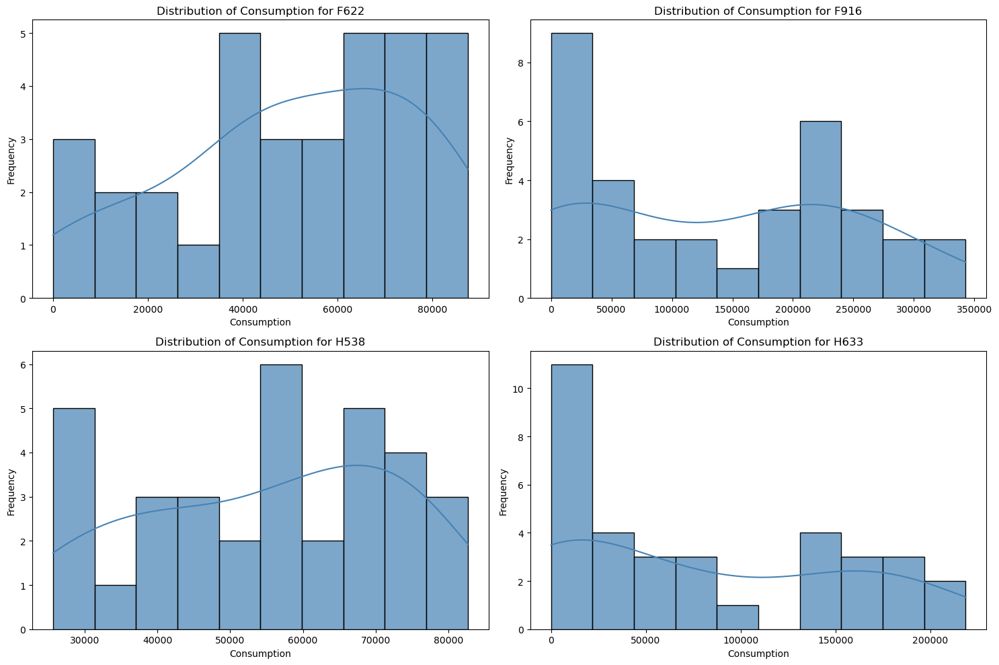

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values - Copy.csv')

# Melt the DataFrame to long format
df_melted = df.melt(id_vars=['Meter_Location'], var_name='Month', value_name='Consumption')

# Extract the first 4 characters of Meter_Location for simplicity
df_melted['Meter_Location'] = df_melted['Meter_Location'].str[:4]

# Create a list of unique building codes
buildings = df_melted['Meter_Location'].unique()

# Set up subplots for each building
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

# Generate histograms and KDE plots for each building
for i, building in enumerate(buildings):
    ax = axes[i]
    building_data = df_melted[df_melted['Meter_Location'] == building]['Consumption']
    sns.histplot(building_data, kde=True, ax=ax, bins=10, color='steelblue', alpha=0.7)
    ax.set_title(f'Distribution of Consumption for {building}')
    ax.set_xlabel('Consumption')
    ax.set_ylabel('Frequency')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()


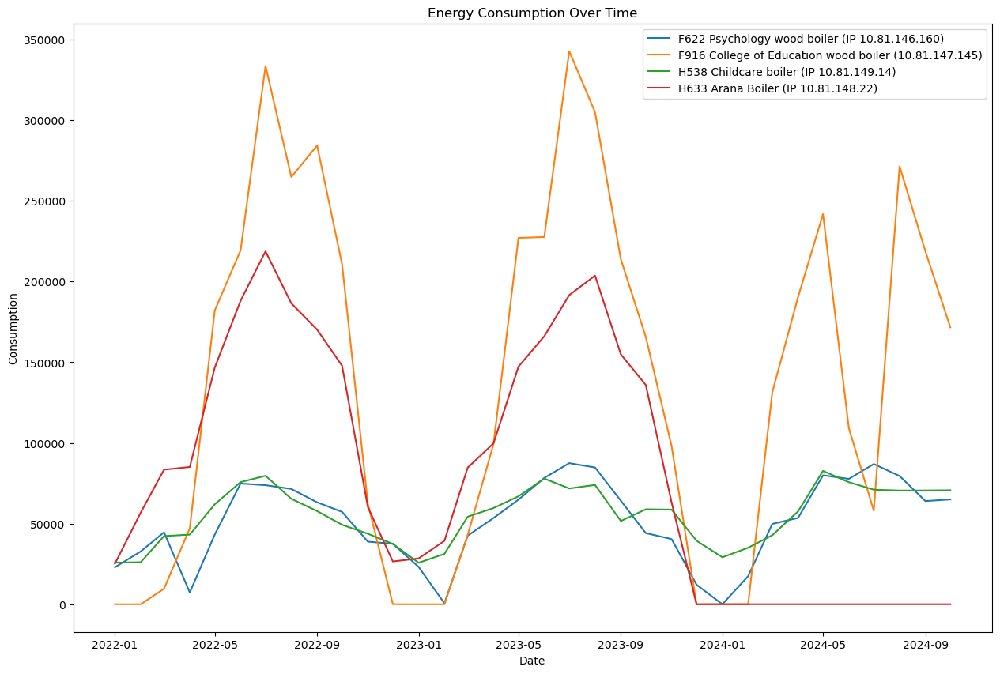

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values - Copy.csv')

# Separate the 'Meter_Location' column from the date columns
date_columns = df.columns[1:]

# Create a date range for the columns
date_range = pd.date_range(start='2022-01-01', periods=len(date_columns), freq='MS')

# Rename the columns with the proper date format
df.columns = ['Meter_Location'] + [d.strftime('%Y-%m-%d') for d in date_range]

# Melt the dataframe to long format
df_melted = df.melt(id_vars=['Meter_Location'], var_name='Date', value_name='Consumption')

# Convert the 'Date' column to datetime
df_melted['Date'] = pd.to_datetime(df_melted['Date'])

# Sort the dataframe by Meter_Location and Date
df_melted = df_melted.sort_values(['Meter_Location', 'Date'])

# Convert Consumption to numeric, replacing any non-numeric values with NaN
df_melted['Consumption'] = pd.to_numeric(df_melted['Consumption'], errors='coerce')

# Time Series Visualization for All Buildings
plt.figure(figsize=(15, 10))
for location in df_melted['Meter_Location'].unique():
    data = df_melted[df_melted['Meter_Location'] == location]
    plt.plot(data['Date'], data['Consumption'], label=location)
plt.legend()
plt.title('Energy Consumption Over Time')
plt.xlabel('Date')
plt.ylabel('Consumption')
plt.show()





In [35]:
import pandas as pd
import numpy as np
from scipy.stats import skew, kurtosis

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values - Copy.csv')

# Extract the Meter_Location and energy consumption columns
date_columns = df.columns[1:]

# Convert the data to numeric for calculations
df[date_columns] = df[date_columns].apply(pd.to_numeric, errors='coerce')

# Calculate skewness and kurtosis for each building
results = []
for index, row in df.iterrows():
    building = row['Meter_Location']
    consumption_values = row[1:].dropna().astype(float)
    building_skewness = skew(consumption_values)
    building_kurtosis = kurtosis(consumption_values)
    results.append({'Building': building, 'Skewness': building_skewness, 'Kurtosis': building_kurtosis})

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the results
print(results_df)


                                            Building  Skewness  Kurtosis
0     F622 Psychology wood boiler (IP 10.81.146.160) -0.438175 -0.804181
1  F916 College of Education wood boiler (10.81.1...  0.122572 -1.326000
2            H538 Childcare boiler (IP 10.81.149.14) -0.261059 -1.171157
3                H633 Arana Boiler (IP 10.81.148.22)  0.372818 -1.370180


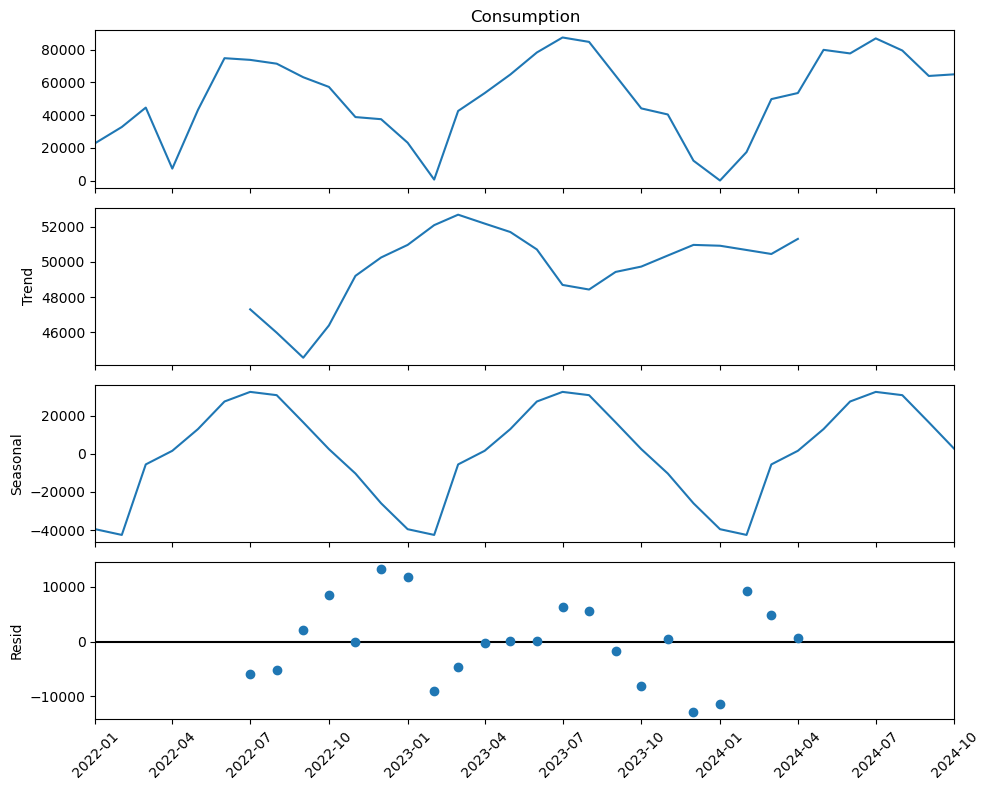

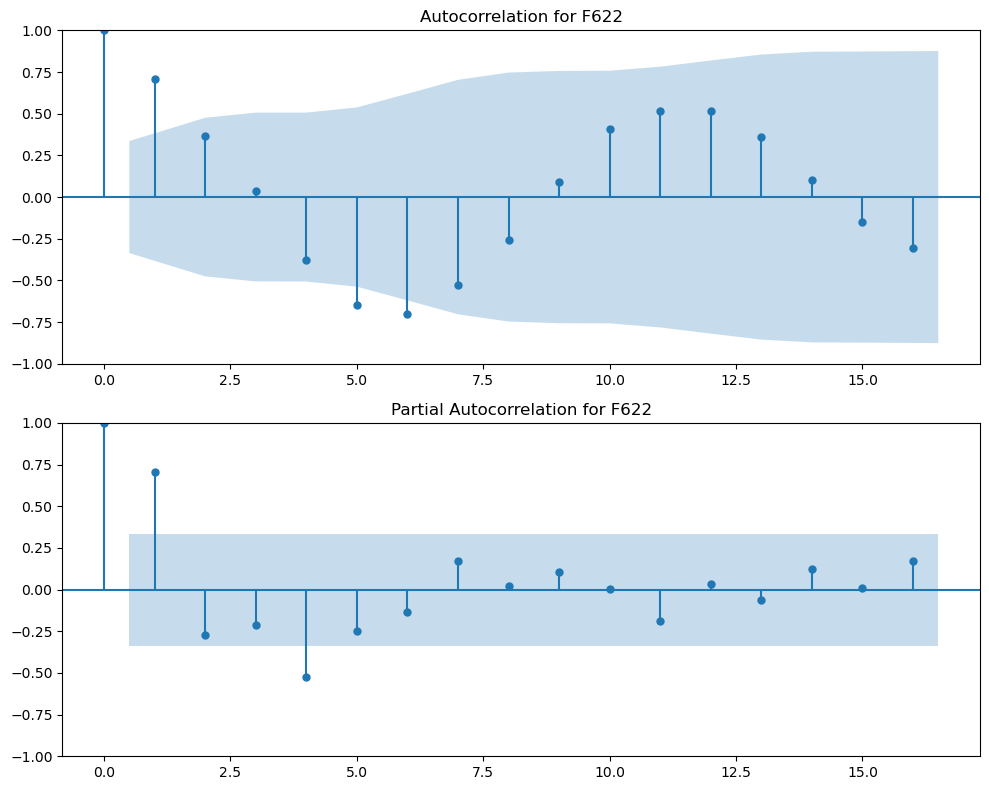

ADF Statistic: -4.6372449321699225
p-value: 0.00011022097094566013
Critical Values: {'1%': -3.6889256286443146, '5%': -2.9719894897959187, '10%': -2.6252957653061224}


In [25]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values-Copy.csv')

# Separate the 'Meter_Location' column from the date columns
date_columns = df.columns[1:]

# Create a date range for the columns
date_range = pd.date_range(start='2022-01-01', periods=len(date_columns), freq='MS')

# Rename the columns with the proper date format
df.columns = ['Meter_Location'] + [d.strftime('%Y-%m-%d') for d in date_range]

# Melt the dataframe to long format
df_melted = df.melt(id_vars=['Meter_Location'], var_name='Date', value_name='Consumption')

# Convert the 'Date' column to datetime
df_melted['Date'] = pd.to_datetime(df_melted['Date'])

# Sort the dataframe by Meter_Location and Date
df_melted = df_melted.sort_values(['Meter_Location', 'Date'])

# Convert Consumption to numeric, replacing any non-numeric values with NaN
df_melted['Consumption'] = pd.to_numeric(df_melted['Consumption'], errors='coerce')

# Seasonal Decomposition (example for F622)
f622_data = df_melted[df_melted['Meter_Location'] == 'F622 Psychology wood boiler (IP 10.81.146.160)']
f622_data = f622_data.set_index('Date')['Consumption']

result = seasonal_decompose(f622_data, model='additive', period=12)

# Adjust x-axis for readability in seasonal decomposition plot
fig = result.plot()
fig.set_size_inches(10, 8)
for ax in fig.axes:
    ax.tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

# Autocorrelation and Partial Autocorrelation (for F622)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

# Adjust lags to comply with sample size constraints
sample_size = len(f622_data.dropna())
max_lags = min(24, sample_size // 2 - 1)  # Ensure lags are less than half of sample size

plot_acf(f622_data.dropna(), ax=ax1, lags=max_lags)
plot_pacf(f622_data.dropna(), ax=ax2, lags=max_lags)

ax1.set_title('Autocorrelation for F622')
ax2.set_title('Partial Autocorrelation for F622')
plt.tight_layout()
plt.show()

# Stationarity Test (ADF Test for F622)
adf_result = adfuller(f622_data.dropna())
print("ADF Statistic:", adf_result[0])
print("p-value:", adf_result[1])
print("Critical Values:", adf_result[4])


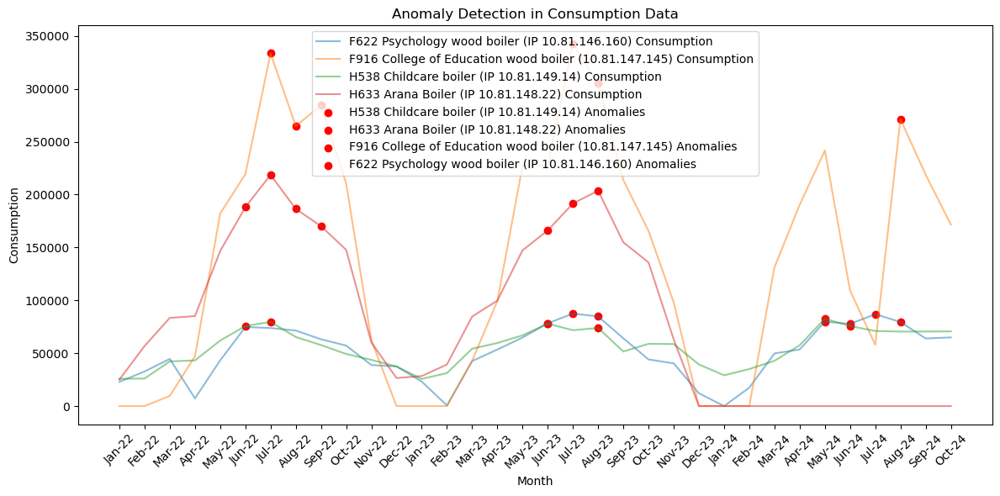

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values - Copy.csv')

# Melt the dataframe to long format
df_melted = df.melt(id_vars=['Meter_Location'], var_name='Month', value_name='Consumption')

# Convert 'Consumption' to numeric, errors='coerce' will turn non-numeric values into NaN
df_melted['Consumption'] = pd.to_numeric(df_melted['Consumption'], errors='coerce')

# Drop rows where Consumption is NaN (i.e., non-numeric values)
df_melted = df_melted.dropna(subset=['Consumption'])

# Calculate mean and standard deviation for each Meter_Location
stats = df_melted.groupby('Meter_Location')['Consumption'].agg(['mean', 'std']).reset_index()

# Merge stats back into the melted dataframe
df_merged = pd.merge(df_melted, stats, on='Meter_Location', suffixes=('', '_stats'))

# Define anomaly threshold (mean + sigma)
df_merged['anomaly_threshold_upper'] = df_merged['mean'] + df_merged['std']

# Identify anomalies
df_merged['is_anomaly'] = df_merged['Consumption'] > df_merged['anomaly_threshold_upper']

# Plot anomalies
plt.figure(figsize=(12, 6))

# Plot all data points
for location in df_merged['Meter_Location'].unique():
    location_data = df_merged[df_merged['Meter_Location'] == location]
    plt.plot(location_data['Month'], location_data['Consumption'], label=f'{location} Consumption', alpha=0.5)

# Highlight anomalies
anomalies = df_merged[df_merged['is_anomaly']]
for location in anomalies['Meter_Location'].unique():
    anomaly_data = anomalies[anomalies['Meter_Location'] == location]
    plt.scatter(anomaly_data['Month'], anomaly_data['Consumption'], label=f'{location} Anomalies', color='red')

plt.xlabel('Month')
plt.ylabel('Consumption')
plt.title('Anomaly Detection in Consumption Data')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


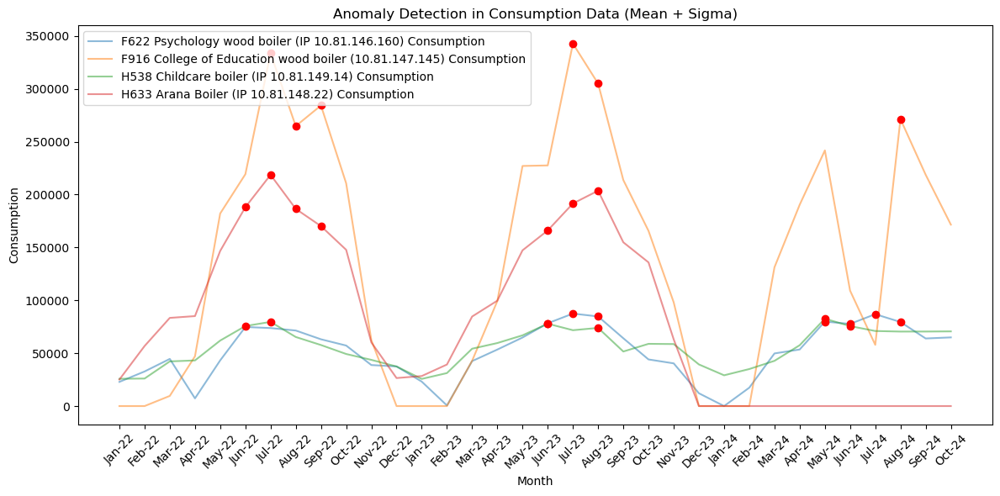

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values - Copy.csv')

# Melt the dataframe to long format
df_melted = df.melt(id_vars=['Meter_Location'], var_name='Month', value_name='Consumption')

# Convert 'Consumption' to numeric, errors='coerce' will turn non-numeric values into NaN
df_melted['Consumption'] = pd.to_numeric(df_melted['Consumption'], errors='coerce')

# Drop rows where Consumption is NaN (i.e., non-numeric values)
df_melted = df_melted.dropna(subset=['Consumption'])

# Calculate mean and standard deviation for each Meter_Location
stats = df_melted.groupby('Meter_Location')['Consumption'].agg(['mean', 'std']).reset_index()

# Merge stats back into the melted dataframe
df_merged = pd.merge(df_melted, stats, on='Meter_Location', suffixes=('', '_stats'))

# Define anomaly threshold (mean + sigma)
df_merged['anomaly_threshold_upper'] = df_merged['mean'] + df_merged['std']

# Identify anomalies
df_merged['is_anomaly'] = df_merged['Consumption'] > df_merged['anomaly_threshold_upper']

# Plot anomalies
plt.figure(figsize=(12, 6))

# Plot all data points
for location in df_merged['Meter_Location'].unique():
    location_data = df_merged[df_merged['Meter_Location'] == location]
    plt.plot(location_data['Month'], location_data['Consumption'], label=f'{location} Consumption', alpha=0.5)

# Highlight anomalies (without adding them to the legend)
anomalies = df_merged[df_merged['is_anomaly']]
for location in anomalies['Meter_Location'].unique():
    anomaly_data = anomalies[anomalies['Meter_Location'] == location]
    plt.scatter(anomaly_data['Month'], anomaly_data['Consumption'], color='red', zorder=5)

plt.xlabel('Month')
plt.ylabel('Consumption')
plt.title('Anomaly Detection in Consumption Data (Mean + Sigma)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


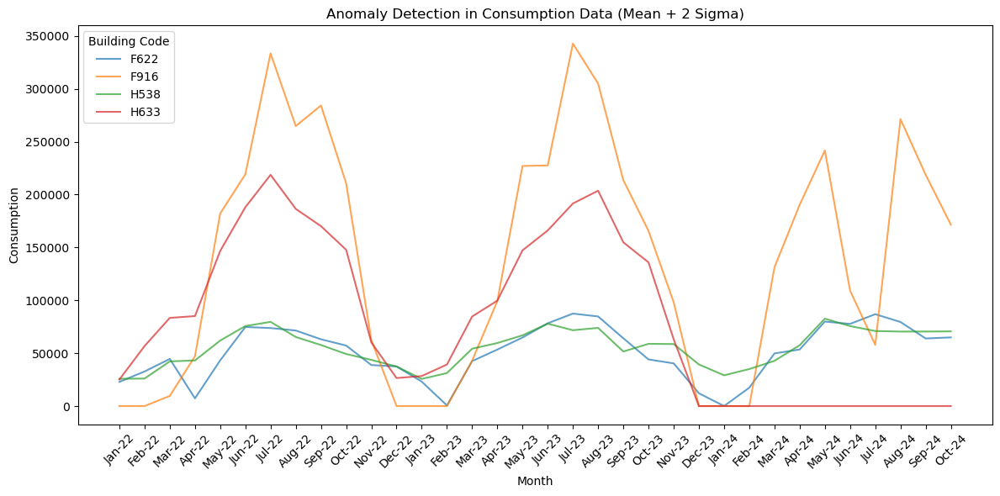

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values - Copy.csv')

# Melt the dataframe to long format
df_melted = df.melt(id_vars=['Meter_Location'], var_name='Month', value_name='Consumption')

# Convert 'Consumption' to numeric, errors='coerce' will turn non-numeric values into NaN
df_melted['Consumption'] = pd.to_numeric(df_melted['Consumption'], errors='coerce')

# Drop rows where Consumption is NaN (i.e., non-numeric values)
df_melted = df_melted.dropna(subset=['Consumption'])

# Calculate mean and standard deviation for each Meter_Location
stats = df_melted.groupby('Meter_Location')['Consumption'].agg(['mean', 'std']).reset_index()

# Merge stats back into the melted dataframe
df_merged = pd.merge(df_melted, stats, on='Meter_Location', suffixes=('', '_stats'))

# Define anomaly threshold (mean + 2*sigma)
df_merged['anomaly_threshold_upper'] = df_merged['mean'] + 2 * df_merged['std']

# Identify anomalies
df_merged['is_anomaly'] = df_merged['Consumption'] > df_merged['anomaly_threshold_upper']

# Plot anomalies
plt.figure(figsize=(12, 6))

# Plot all data points and highlight anomalies
for location in df_merged['Meter_Location'].unique():
    location_data = df_merged[df_merged['Meter_Location'] == location]
    # Plot the trend line
    plt.plot(location_data['Month'], location_data['Consumption'], label=location.split()[0], alpha=0.7)
    # Highlight anomalies as red dots on the trend line
    anomaly_data = location_data[location_data['is_anomaly']]
    plt.scatter(anomaly_data['Month'], anomaly_data['Consumption'], color='red', zorder=5)

# Add labels and title
plt.xlabel('Month')
plt.ylabel('Consumption')
plt.title('Anomaly Detection in Consumption Data (Mean + 2 Sigma)')
plt.legend(title="Building Code")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Detected Anomalies:
Empty DataFrame
Columns: [Meter_Location, Month, Consumption, mean, std, anomaly_threshold_upper, is_anomaly]
Index: []


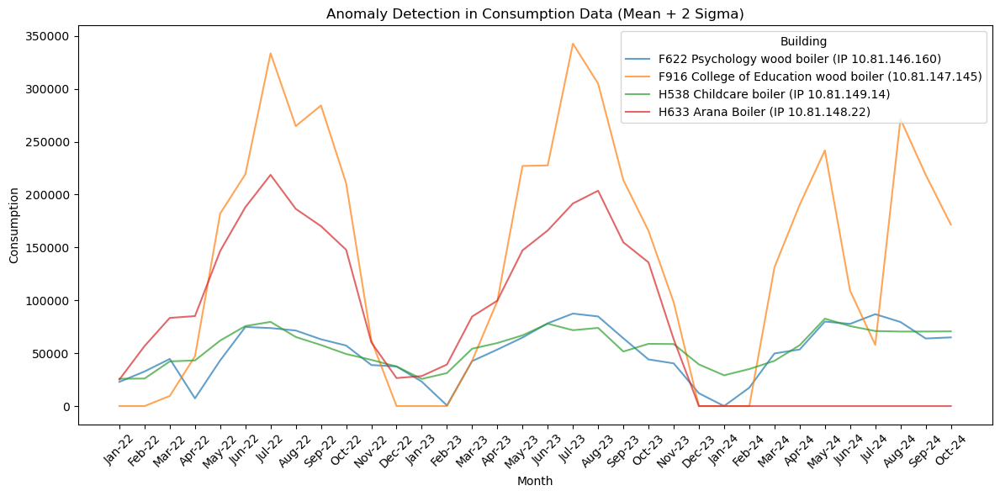

In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Actual_lthw_consumption_values - Copy.csv')

# Melt the dataframe to long format
df_melted = df.melt(id_vars=['Meter_Location'], var_name='Month', value_name='Consumption')

# Convert 'Consumption' to numeric, errors='coerce' will turn non-numeric values into NaN
df_melted['Consumption'] = pd.to_numeric(df_melted['Consumption'], errors='coerce')

# Drop rows where Consumption is NaN (i.e., non-numeric values)
df_melted = df_melted.dropna(subset=['Consumption'])

# Calculate mean and standard deviation for each Meter_Location
stats = df_melted.groupby('Meter_Location')['Consumption'].agg(['mean', 'std']).reset_index()

# Merge stats back into the melted dataframe
df_merged = pd.merge(df_melted, stats, on='Meter_Location', suffixes=('', '_stats'))

# Define anomaly threshold (mean + 2*sigma)
df_merged['anomaly_threshold_upper'] = df_merged['mean'] + 2 * df_merged['std']

# Identify anomalies
df_merged['is_anomaly'] = df_merged['Consumption'] > df_merged['anomaly_threshold_upper']

# Debugging: Print detected anomalies
print("Detected Anomalies:")
print(df_merged[df_merged['is_anomaly']])

# Plot all data points and highlight anomalies
plt.figure(figsize=(12, 6))

for location in df_merged['Meter_Location'].unique():
    location_data = df_merged[df_merged['Meter_Location'] == location]
    # Plot trend line
    plt.plot(location_data['Month'], location_data['Consumption'], label=f'{location}', alpha=0.7)
    # Highlight anomalies as red dots
    anomaly_data = location_data[location_data['is_anomaly']]
    plt.scatter(anomaly_data['Month'], anomaly_data['Consumption'], color='red', zorder=5)

plt.xlabel('Month')
plt.ylabel('Consumption')
plt.title('Anomaly Detection in Consumption Data (Mean + 2 Sigma)')
plt.legend(title="Building")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


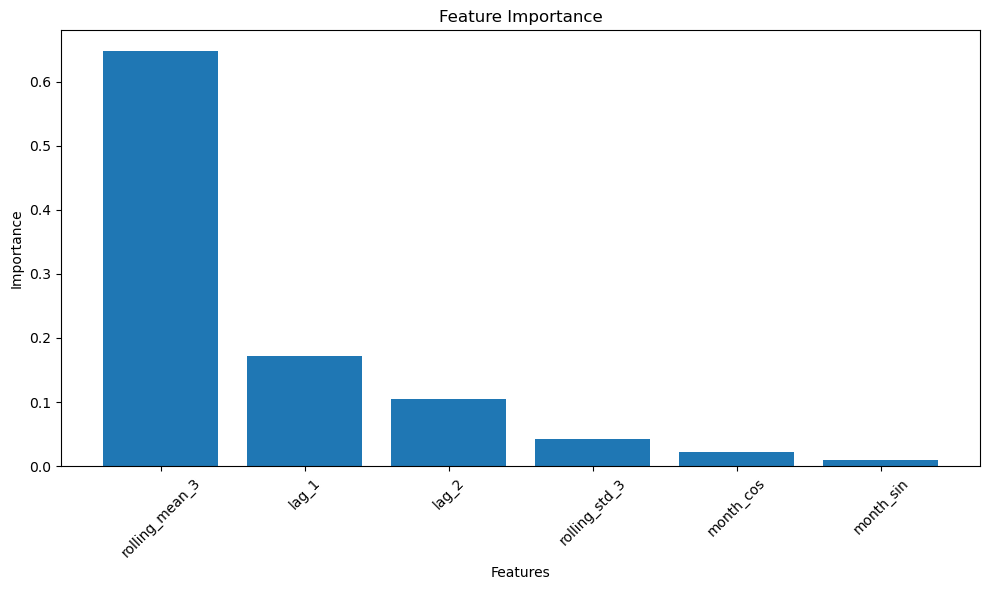

          feature  importance
4  rolling_mean_3    0.647760
2           lag_1    0.172184
3           lag_2    0.105300
5   rolling_std_3    0.042955
1       month_cos    0.022646
0       month_sin    0.009156


In [55]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv("Actual_lthw_consumption_values - Copy.csv")

# Remove the building name (Meter_Location) column
data_cleaned = data.drop(columns=['Meter_Location'])

# Convert columns to numeric and handle missing values
data_cleaned = data_cleaned.apply(pd.to_numeric, errors='coerce').fillna(0)

# Melt the dataframe to long format
data_melted = data_cleaned.melt(var_name='date', value_name='consumption')
data_melted['date'] = pd.to_datetime(data_melted['date'], format='%b-%y')

# Sort by date
data_melted = data_melted.sort_values('date')

# Extract month and year
data_melted['month'] = data_melted['date'].dt.month
data_melted['year'] = data_melted['date'].dt.year

# Create temporal features
data_melted['month_sin'] = np.sin(2 * np.pi * data_melted['month'] / 12)
data_melted['month_cos'] = np.cos(2 * np.pi * data_melted['month'] / 12)

# Create historical features
data_melted['lag_1'] = data_melted.groupby(data_melted.index // 4)['consumption'].shift(1)
data_melted['lag_2'] = data_melted.groupby(data_melted.index // 4)['consumption'].shift(2)
data_melted['rolling_mean_3'] = data_melted.groupby(data_melted.index // 4)['consumption'].rolling(window=3).mean().reset_index(0, drop=True)
data_melted['rolling_std_3'] = data_melted.groupby(data_melted.index // 4)['consumption'].rolling(window=3).std().reset_index(0, drop=True)

# Drop rows with NaN values
data_melted = data_melted.dropna()

# Prepare features and target
features = ['month_sin', 'month_cos', 'lag_1', 'lag_2', 'rolling_mean_3', 'rolling_std_3']
X = data_melted[features]
y = data_melted['consumption']

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_scaled, y)

# Get feature importance
importance = rf_model.feature_importances_

# Sort features by importance
feature_importance = pd.DataFrame({'feature': features, 'importance': importance})
feature_importance = feature_importance.sort_values('importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.bar(feature_importance['feature'], feature_importance['importance'])
plt.title('Feature Importance')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Print feature importance
print(feature_importance)


Tuned Random Forest Train R²: 0.9999810625719017
Tuned Random Forest Test R²: 0.9997639651324021


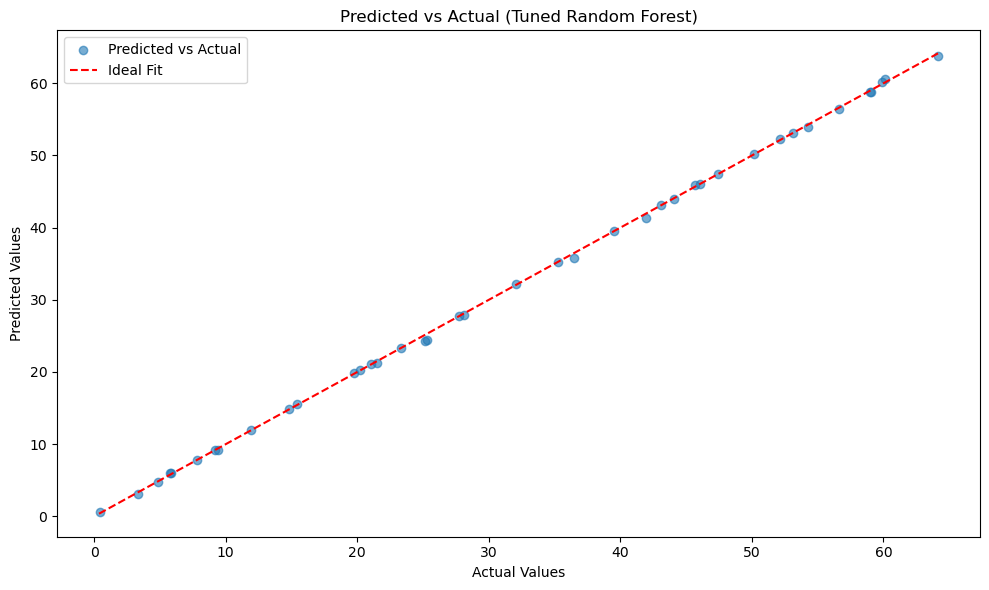

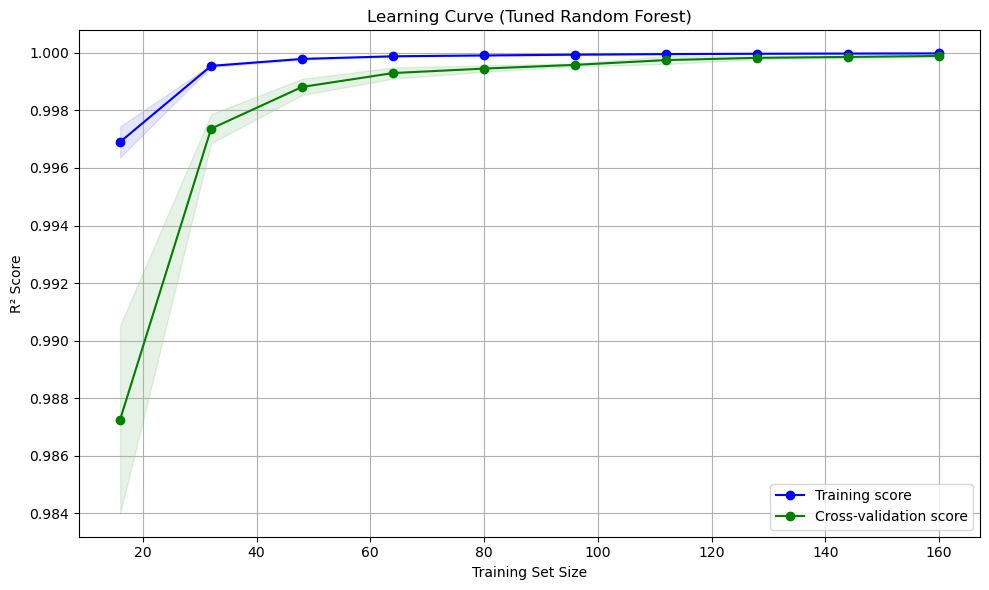

In [69]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, learning_curve
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

# Simulated data based on feature importance
np.random.seed(42)
n_samples = 200
X = pd.DataFrame({
    'rolling_mean_3': np.random.rand(n_samples) * 100,
    #'lag_1': np.random.rand(n_samples) * 50,
    #'month_cos': np.random.rand(n_samples) * 10,
})

# Generate target variable with some noise
y = 0.65 * X['rolling_mean_3'] 
#+ 0.17 * X['lag_1'] + 0.02 * X['month_cos'] + np.random.rand(n_samples) * 10

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Perform hyperparameter tuning for Random Forest
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

grid_search = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best Random Forest model after tuning
best_rf_model = grid_search.best_estimator_

# Predict and calculate R² scores
rf_train_r2 = r2_score(y_train, best_rf_model.predict(X_train))
rf_test_r2 = r2_score(y_test, best_rf_model.predict(X_test))

# Print R² scores for the tuned Random Forest model
print("Tuned Random Forest Train R²:", rf_train_r2)
print("Tuned Random Forest Test R²:", rf_test_r2)

# Plot predicted vs actual for the tuned Random Forest model
plt.figure(figsize=(10, 6))
plt.scatter(y_test, best_rf_model.predict(X_test), alpha=0.6, label='Predicted vs Actual')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', label='Ideal Fit')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Predicted vs Actual (Tuned Random Forest)')
plt.legend()
plt.tight_layout()
plt.show()

# Plot learning curve for the tuned Random Forest model
train_sizes, train_scores, test_scores = learning_curve(
    best_rf_model, X, y, cv=5, scoring='r2', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# Calculate mean and standard deviation for train and test scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_mean, 'o-', color='green', label='Cross-validation score')

plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='green')

plt.title('Learning Curve (Tuned Random Forest)')
plt.xlabel('Training Set Size')
plt.ylabel('R² Score')
plt.legend(loc='best')
plt.grid()
plt.tight_layout()
plt.show()
